# 1. Project Overview

Esse projeto tem como objetivo discorrer e demonstrar os passos efetuados para a construção do pipeline de previsão do dataset de séries temporais do índice GDP para os anos de 2024 a 2028, comparando com os dados disponíveis que foram previstos pelo Statistica.

Nesse notebook serão abordados os tópicos:

- **Exploratory Data Analysis (EDA)**. A análise investigativa sobre os dados disponíveis, buscando informações sobre dados faltantes, correlações, distribuição dos dados e estatísticas descritivas, assim como análises mais específicas de séries temporais como estacionariedade, auto-correlação e padrões de séries temporais. 

- **Valores `no data`**. Uma atenção especial foi dada aos dados faltantes, considerando que uma série temporal não permite a mera remoção de valores faltantes dos dados, uma investigação mais aprofundada foi feita para definir as melhores estratégias para imputação desses valores.

- **Feature Engineering**. Etapa em que são abordados de uma maneira mais técnica e aprofundada as estratégias de imputação de dados faltantes, além de outras modificações nos dados para adequação à aplicação dos modelos.

- **Training**. Alguns modelos foram testados visando avaliar qual tinha a melhor performance considerando a métrica do Percentual Absoluto Médio (*Mean Absolute Percentage Error* ou MAPE). Essa seção contém explicações sobre bibliotecas e modelos utlizados, comparativos visuais das predições de cada modelo e decisão pelo modelo final.

#### Existem algumas diferenças entre os códigos do notebook e códigos do pipeline do Kedro devido a algumas adaptações visando melhor funcionamento das funções.

## 1.1. Data Glossary

Aqui está um glossário de termos-chave desse dataset, ou seja, termos que aparecem com certa frequência e cuja compreensão do seu significado é crucial para a dinâmica do entendimento deste notebook. 

* **Séries Temporais**: Em estatística, econometria, matemática aplicada e processamento de sinais, uma série temporal é uma coleção de observações feitas sequencialmente ao longo do tempo
* **Índice GDP**: O GDP, que vem do inglês “*Gross Domestic Product*” é a soma da produção econômica total de um país em um determinado período. Em português, esse termo é chamado de Produto Interno Bruto, ou PIB
* **Imputação de dados**: Substituição de dados faltantes em um conjunto de dados utilizando de variadas técnicas
* **Forecasting**: tipo de abordagem estatística ou de machine learning que tenta modelar dados históricos de séries temporais para fazer previsões sobre pontos de tempo futuros
* **Tendência (*trend*) e sazonalidade (*seasonality*)**: Componentes não observáveis de uma série temporal que representam, respectivamente, o movimento de longo prazo e o padrão regular (queda/subida) de um determinado período da série de tempo.
* **Estacionariedade (*stationarity*)**: Propriedade importante que descreve como os valores estatísticos (como a média, a variância, a autocovariância) de uma série temporal se comportam ao longo do tempo,sendo considerada estacionária se essas propriedades estatísticas não mudam ao longo do tempo.
* **Grupos econômicos**: Divisão dos países definido pela *World Economics Outlook*, dividindo-os em dois grupos majoritários ( *Advanced economies* e *Emerging and developing economies*) e subgrupos dentro desses (*Euro Area*, *Major Advanced Economies (G7)*, *Other Advanced Economies*, *European Union*, *ASEAN-5*, *Emerging and Developing Asia*, *Emerging and Developing Europe*, *Latin America and the Caribbean*, *Middle East and Central Asia*, e *Sub-Saharan Africa*).

## 1.2 Import Libraries and Data

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [4]:
import missingno

In [5]:
path = '../data/01_raw/imf-dm-export-20230513.xls'
imf_df = pd.read_excel(path)

In [6]:
imf_df.head()

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,Afghanistan,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,3.9,-2.4,no data,no data,no data,no data,no data,no data,no data,no data
1,Albania,2.7,5.7,2.9,1.1,2,-1.5,5.6,-0.8,-1.4,...,2.1,-3.5,8.5,3.7,2.2,3.3,3.4,3.4,3.4,3.4
2,Algeria,-5.4,3,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,1,-5.1,3.4,2.9,2.6,2.6,2.2,2.1,1.7,1.8
3,Andorra,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,2,-11.2,8.9,8.7,1.3,1.5,1.5,1.5,1.5,1.5
4,Angola,2.4,-4.4,0,4.2,6,3.5,2.9,4.1,6.1,...,-0.7,-5.6,1.1,2.8,3.5,3.7,4,4.1,4.2,4.2


# 2. Exploratory Data Analysis

Aqui está relacionada toda a etapa de exploração dos dados, visando retirar informações e insights do que foi fornecido pelo conjunto de dados. 

Nessa seção serão apresentadas:

- Análise geral: subseção apresentando uma análise mais "macro" dos dados, analisando propriedades estatísticas, dados faltantes e outras considerações.

- Análise de valores faltantes: subseção dedicada ao estudo dos dados faltantes, como quantidade e distribuição, bem como possíveis estratégias de subsituição.

- Análise de séries temporais: subseção dedidada à análise das séries temporais e suas singularidades, buscando informações como estacionariedade, autocorrelação e afins.

## 2.1 - Análise geral

Aqui tem início a análise mais geral dos dados. Estatísticas descritivas, valores faltantes, visualizações e afins. 

In [7]:
imf_df.describe()

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
count,229,228,228,228,228,228,228,228,228,228,...,228,228.0,228.0,228,228.0,228,228,228,228,228
unique,229,115,104,104,103,105,102,100,108,110,...,98,131.0,119.0,104,76.0,68,63,65,61,57
top,Afghanistan,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,2,-1.8,5.7,4,3.5,2,3,3,3,3
freq,1,59,55,54,54,54,54,53,52,51,...,8,8.0,7.0,9,10.0,9,13,14,17,15


Aqui já se vê um formato diferente do esperado, já que não é possível ver as estatísticas descritivas normalmente presentes (média, mediana, desvio padrão, etc). Isso pode ser devido ao formato dos dados, já que a presente dos campos `no data` podem estar criando problemas nos tipos dos dados.

In [8]:
imf_df.dtypes

Real GDP growth (Annual percent change)    object
1980                                       object
1981                                       object
1982                                       object
1983                                       object
1984                                       object
1985                                       object
1986                                       object
1987                                       object
1988                                       object
1989                                       object
1990                                       object
1991                                       object
1992                                       object
1993                                       object
1994                                       object
1995                                       object
1996                                       object
1997                                       object
1998                                       object


Como se observa, o tipo das colunas está como `object`, o que pode estar afetando a contagem das estatísticas. Converter esses valores para `NaN` e mudar o tipo dos dados pode alterar essa situação. Contudo, antes é útil analisar a presença desses campos nos dados.

Antes disso, analisando os dados nulos para ver se há algum tipo de "mistura" entre `no data` e `NaN`

In [9]:
imf_df.isna().sum()

Real GDP growth (Annual percent change)    1
1980                                       2
1981                                       2
1982                                       2
1983                                       2
1984                                       2
1985                                       2
1986                                       2
1987                                       2
1988                                       2
1989                                       2
1990                                       2
1991                                       2
1992                                       2
1993                                       2
1994                                       2
1995                                       2
1996                                       2
1997                                       2
1998                                       2
1999                                       2
2000                                       2
2001      

In [10]:
imf_df[imf_df[1980].isnull()]

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
228,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
229,"©IMF, 2023",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Os valores nulos nesse caso são de duas linhas que não apresentam informação de país ou índices, portanto podem ser removidas.

In [11]:
imf_df = imf_df.dropna()
imf_df.isna().sum()

Real GDP growth (Annual percent change)    0
1980                                       0
1981                                       0
1982                                       0
1983                                       0
1984                                       0
1985                                       0
1986                                       0
1987                                       0
1988                                       0
1989                                       0
1990                                       0
1991                                       0
1992                                       0
1993                                       0
1994                                       0
1995                                       0
1996                                       0
1997                                       0
1998                                       0
1999                                       0
2000                                       0
2001      

Agora sim, analisando a presença dos campos `no data`

In [12]:
imf_df[imf_df == 'no data'].count()

Real GDP growth (Annual percent change)     0
1980                                       59
1981                                       55
1982                                       54
1983                                       54
1984                                       54
1985                                       54
1986                                       53
1987                                       52
1988                                       51
1989                                       51
1990                                       51
1991                                       40
1992                                       37
1993                                       25
1994                                       23
1995                                       21
1996                                       18
1997                                       18
1998                                       15
1999                                       12
2000                              

Observa-se que maior parte dos valores faltantes estão entre 1980 e 2000, caindo para no máximo 5 entre 2001 e 2023 e 4 a 5 entre 2024 e 2028. Apesar de não ser a fonte dos dados, uma informação do site [World Bank](https://www.worldbank.org/en/about) pode ajudar a elucidar esse fato:

"*There are a number of reasons why data may not be available for some indicators for all countries and years. Some indicators are derived from sporadic surveys and are only available every few years. Some data sets or indicators are only available from the year they were initiated. For example, Doing Business indicators start from 2003 when the program was launched. Government finance statistics uses updated indicator definitions and methodology which only allowed for a consistent time series beginning no earlier than 1990. For the same reason, balance of payments statistics time-series only start in 2005. Some countries do not regularly report data due to conflict, lack of statistical capacity, or other reasons (e.g. Somalia, North Korea, and some Caribbean and Pacific island economies). And some countries do not have data for earlier years simply because they did not exist (e.g. countries of the former Soviet Union, South Sudan, Eritrea, Timor-Leste).*"

Nos casos de 2024 a 2028, pode-se imaginar que as previsões não foram feitas para determinados países - caso da Ucrânia, cujo conflito atual pode ter sido um fator que levou a ausência de previsões - mas não é possível afirmar com certeza.

Os valores `no data` serão substituidos por `NaN`.

In [13]:
df2 = imf_df.replace('no data', np.nan)
df2.head()

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.9,-2.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Albania,2.7,5.7,2.9,1.1,2.0,-1.5,5.6,-0.8,-1.4,...,2.1,-3.5,8.5,3.7,2.2,3.3,3.4,3.4,3.4,3.4
2,Algeria,-5.4,3.0,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,1.0,-5.1,3.4,2.9,2.6,2.6,2.2,2.1,1.7,1.8
3,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.0,-11.2,8.9,8.7,1.3,1.5,1.5,1.5,1.5,1.5
4,Angola,2.4,-4.4,0.0,4.2,6.0,3.5,2.9,4.1,6.1,...,-0.7,-5.6,1.1,2.8,3.5,3.7,4.0,4.1,4.2,4.2


In [14]:
statistics = df2.describe()
statistics

,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,...,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
count,169.000000,173.000000,174.000000,174.000000,174.000000,174.000000,175.000000,176.000000,177.000000,177.000000,...,227.000000,227.000000,225.000000,225.000000,225.000000,224.000000,223.000000,223.000000,223.000000,223.000000
mean,2.872189,2.444509,1.303448,1.936782,4.177586,3.129310,3.742286,3.710227,4.140678,3.468362,...,2.588987,-4.726872,5.449778,3.948000,3.389333,3.700000,3.427803,3.526009,3.316143,3.298206
std,5.417190,5.465041,5.964451,5.150310,6.281408,4.490556,4.436724,4.966437,5.652045,5.947604,...,3.519304,7.596170,5.266989,6.059085,4.891298,3.685251,1.765342,2.790709,1.713988,1.676654
min,-21.600000,-20.000000,-36.800000,-16.100000,-16.800000,-13.000000,-19.300000,-15.400000,-28.200000,-42.200000,...,-27.700000,-54.200000,-17.900000,-30.300000,-3.000000,-8.200000,-8.600000,-1.600000,-1.100000,-0.500000
25%,0.100000,0.100000,-0.800000,-1.000000,1.925000,1.100000,1.950000,1.500000,1.700000,1.400000,...,1.250000,-7.150000,3.100000,2.400000,1.500000,2.000000,2.300000,2.200000,2.200000,2.200000
50%,3.300000,2.600000,1.500000,2.400000,4.100000,3.500000,3.600000,3.600000,4.200000,3.800000,...,2.600000,-3.600000,5.200000,3.800000,2.900000,3.150000,3.200000,3.000000,3.000000,3.000000
75%,5.800000,5.500000,4.100000,4.600000,6.100000,5.300000,6.100000,5.900000,6.900000,5.400000,...,4.500000,-1.450000,7.400000,5.700000,4.400000,4.500000,4.400000,4.300000,4.300000,4.300000
max,18.800000,17.100000,23.200000,22.700000,44.500000,24.300000,18.600000,22.000000,23.400000,25.900000,...,13.800000,43.500000,41.700000,62.300000,58.900000,45.300000,8.600000,36.600000,15.500000,14.500000


Com a presença dos valores transformados já é possível visualizar melhor as estatísticas dos dados, como a contagem indicando a falta de alguns (menor que 228, a quantidade total de dados), média por ano, desvio padrão, mínimo e máximo e quartis.

É interessante explorar algumas dessas estatísticas ao longo dos anos.

In [15]:
statistics = statistics.T
statistics

,count,mean,std,min,25%,50%,75%,max
1980,169.0,2.872189,5.417190,-21.6,0.100,3.30,5.800,18.8
1981,173.0,2.444509,5.465041,-20.0,0.100,2.60,5.500,17.1
1982,174.0,1.303448,5.964451,-36.8,-0.800,1.50,4.100,23.2
1983,174.0,1.936782,5.150310,-16.1,-1.000,2.40,4.600,22.7
1984,174.0,4.177586,6.281408,-16.8,1.925,4.10,6.100,44.5
1985,174.0,3.129310,4.490556,-13.0,1.100,3.50,5.300,24.3
1986,175.0,3.742286,4.436724,-19.3,1.950,3.60,6.100,18.6
1987,176.0,3.710227,4.966437,-15.4,1.500,3.60,5.900,22.0
1988,177.0,4.140678,5.652045,-28.2,1.700,4.20,6.900,23.4
1989,177.0,3.468362,5.947604,-42.2,1.400,3.80,5.400,25.9


<Axes: title={'center': 'Dataset Statistics'}, xlabel='Years', ylabel='GDP Index'>

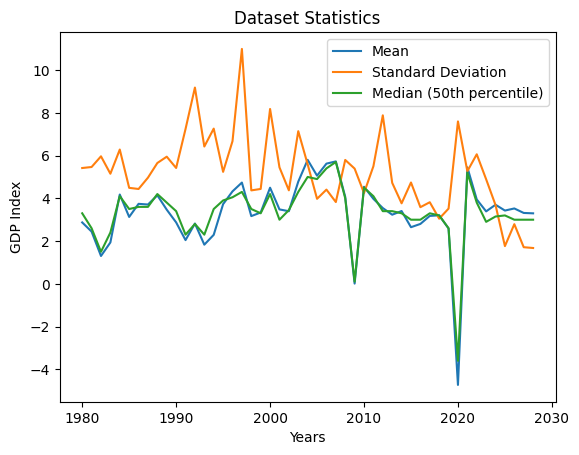

In [16]:
plt.title('Dataset Statistics')
plt.xlabel('Years')
plt.ylabel('GDP Index')
sns.lineplot(x = statistics.index, y = 'mean', label = 'Mean', data = statistics)
sns.lineplot(x = statistics.index, y = 'std', label = 'Standard Deviation', data = statistics)
sns.lineplot(x = statistics.index, y = '50%', label = 'Median (50th percentile)', data = statistics)

Pelo mostrado graficamente, média e mediana andam próximas ao longo de todos os anos, inclusive nos anos de crise (2008-2009 e 2020). Olhando apenas de 2000 em diante, que é quando países com dados faltantes nos anos anteriores passam a compor os dados de maneira mais completa, essa tendência ainda se mantém, o que já pode ser um indicativo de que isso ocorreu anteriormente. Isso pode ser levado em consideração na imputação dos valores faltantes.

Quanto ao desvio padrão, por sua maior sensibilidade a outliers, seus valores são mais altos. Percebe-se que de 1990 a meados dos anos 2000 o desvio padrão oscilou bastante, apresentando alguns picos, coincidentemente quando dados de países que antes não compunham as tabelas passam a aparecer. Como no caso do dataset inicial cada linha representa um país, isso quer dizer que se em 1980 (quando o desvio padrão é menor) haviam dados de 169 países, regiões e afíns, ao passo que em 2000 agora haviam 223. 

Isso também indica que embora a média dos índices dos países estejam em torno de 2 e 4 - desconsiderando anos de crise - analisando individualmente muitos países desviam tanto positiva quanto negativamente da média, tanto por apresentarem um *boom* em seu desenvolvimento econômico como uma grande queda por fatores internos. 

Outro ponto interessante é que após períodos de crise o desvio padrão sofre um aumento imediato, demonstrando as diferentes respostas econômicas dos países à essas situações.

Quanto aos dados em si, as estatísticas acima indicam que a média é uma abordagem relativamente segura de imputação, mas pela variabilidade presente é interessante que as estratégias englobem uma visão mais micro do que macro para os países faltantes.

A partir daqui se inicia a análise dos dados faltantes.

In [17]:
new_df = df2.transpose()
new_df.columns = new_df.iloc[0]
new_df = new_df.iloc[1:]
new_df.head()

Real GDP growth (Annual percent change),Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
1980,NaN,2.7,-5.4,NaN,2.4,8.2,0.7,NaN,NaN,2.9,...,-0.8,3.3,NaN,1.8,6.4,0.9,-1.9,3.8,NaN,2.1
1981,NaN,5.7,3.0,NaN,-4.4,3.8,-5.7,NaN,NaN,4.1,...,-0.5,1.9,NaN,0.1,0.9,2.0,-0.2,4.2,NaN,1.9
1982,NaN,2.9,6.4,NaN,0.0,-0.1,-3.1,NaN,NaN,0.1,...,1.4,1.5,NaN,0.6,-0.5,-0.1,0.4,2.2,NaN,0.7
1983,NaN,1.1,5.4,NaN,4.2,5.4,3.7,NaN,NaN,-0.5,...,4.6,1.8,NaN,1.7,-2.8,3.3,0.7,4.0,NaN,2.6
1984,NaN,2.0,5.6,NaN,6.0,10.2,2.0,NaN,NaN,6.3,...,4.1,4.1,NaN,2.5,3.9,5.0,0.3,6.6,NaN,4.6


## 2.2 - Análise para preenchimento de dados

Para visualizar de uma maneira mais "próxima", primeiro os países serão divididos por seu grupo econômico (relacionados [aqui](https://www.imf.org/en/Publications/WEO/weo-database/2023/April/groups-and-aggregates#lac)).

In [18]:
#Country groups
euro_area = ['Austria','Belgium','Croatia','Cyprus','Estonia','Finland','France','Germany','Greece','Ireland','Italy','Latvia','Lithuania','Luxembourg','Malta','The Netherlands','Portugal','Slovak Republic','Slovenia','Spain']

major_advanced_economies = ['Canada','France','Germany','Italy','Japan','United Kingdom','United States']

other_advanced_economies = ['Andorra','Australia','Czech Republic','Denmark','Hong Kong SAR','Iceland','Israel','Korea','Macao SAR','New Zealand','Norway','Puerto Rico','San Marino','Singapore','Sweden','Switzerland','Taiwan Province of China']

european_union = ['Austria','Belgium','Bulgaria','Croatia','Cyprus','Czech Republic','Denmark','Estonia','Finland','France','Germany','Greece','Hungary','Ireland','Italy','Latvia','Lithuania','Luxembourg','Malta','The Netherlands','Poland','Portugal','Romania','Slovak Republic','Slovenia','Spain','Sweden']

asean_5 = ['Indonesia','Malaysia','Philippines','Singapore','Thailand']

emerging_developing_asia = ['Bangladesh','Bhutan','Brunei Darussalam','Cambodia','China','Fiji','India','Indonesia','Kiribati','Lao P.D.R.','Malaysia','Maldives','Marshall Islands','Micronesia','Mongolia','Myanmar','Nauru','Nepal','Palau','Papua New Guinea','Philippines','Samoa','Solomon Islands','Sri Lanka','Thailand','Timor-Leste','Tonga','Tuvalu','Vanuatu','Vietnam']

emerging_developing_europe = ['Albania','Belarus','Bosnia and Herzegovina','Bulgaria','Hungary','Kosovo','Moldova','Montenegro','North Macedonia','Poland','Romania','Russia','Serbia','Türkiye','Ukraine']

latin_american_caribean = ['Antigua and Barbuda','Argentina','Aruba','The Bahamas','Barbados','Belize','Bolivia','Brazil','Chile','Colombia','Costa Rica','Dominica','Dominican Republic','Ecuador','El Salvador','Grenada','Guatemala','Guyana','Haiti','Honduras','Jamaica','Mexico','Nicaragua','Panama','Paraguay','Peru','St. Kitts and Nevis','St. Lucia','St. Vincent and','the Grenadines','Suriname','Trinidad and Tobago','Uruguay','Venezuela']

middle_east_central_asia = ['Afghanistan','Algeria','Armenia','Azerbaijan','Bahrain','Djibouti','Egypt','Georgia','Iran','Iraq','Jordan','Kazakhstan','Kuwait','Kyrgyz Republic','Lebanon','Libya','Mauritania','Morocco','Oman','Pakistan','Qatar','Saudi Arabia','Somalia','Sudan','Syria','Tajikistan','Tunisia','Turkmenistan','United Arab Emirates','Uzbekistan','West Bank and Gaza','Yemen']

sub_saharan_africa = ['Angola','Benin','Botswana','Burkina Faso','Burundi','Cabo Verde','Cameroon','Central African Republic','Chad','Comoros','Democratic Republic of the Congo','Republic of Congo',"Côte d'Ivoire",'Equatorial Guinea','Eritrea','Eswatini','Ethiopia','Gabon','The Gambia','Ghana','Guinea','Guinea-Bissau','Kenya','Lesotho','Liberia','Madagascar','Malawi','Mali','Mauritius','Mozambique','Namibia','Niger','Nigeria','Rwanda','São Tomé and Príncipe','Senegal','Seychelles','Sierra Leone','South Africa','South Sudan','Tanzania','Togo','Uganda','Zambia','Zimbabwe']

Para avaliar melhor o quão completos os dados estão, é útil comparar as informações das listas acima com os países presentes no dataset.

In [19]:
all_country_list = new_df.columns

In [20]:
economic_groups = [
    major_advanced_economies,
    other_advanced_economies,
    european_union,
    asean_5,
    euro_area,
    emerging_developing_asia,
    emerging_developing_europe,
    latin_american_caribean,
    middle_east_central_asia,
    sub_saharan_africa
]
group_names = [
    'major_advanced_economies',
    'other_advanced_economies',
    'european_union',
    'asean_5',
    'euro_area',
    'emerging_developing_asia',
    'emerging_developing_europe',
    'latin_american_caribean',
    'middle_east_central_asia',
    'sub_saharan_africa']

for group_name, group in zip(group_names, economic_groups):
    count = sum(1 for country in group if country in all_country_list)
    print(f"{group_name}: {count} countries present of {len(group)} total countries",'\n')

major_advanced_economies: 7 countries present of 7 total countries 

other_advanced_economies: 16 countries present of 17 total countries 

european_union: 26 countries present of 27 total countries 

asean_5: 5 countries present of 5 total countries 

euro_area: 19 countries present of 20 total countries 

emerging_developing_asia: 28 countries present of 30 total countries 

emerging_developing_europe: 12 countries present of 15 total countries 

latin_american_caribean: 29 countries present of 34 total countries 

middle_east_central_asia: 32 countries present of 32 total countries 

sub_saharan_africa: 41 countries present of 45 total countries 



É notável a ausência de alguns países das listas, ainda assim, é útil verificar se essa falta é pela ausência do país em si ou do conflito de identificação (nome da lista estando diferente do nome no dataset).
Sendo assim, primeiro verificou-se quais eram os países faltantes e uma segunda busca foi feita nos dados do dataset.

In [21]:
missing_dict = {}
for group_name, group in zip(group_names, economic_groups):
    not_in = [country for country in group if country not in all_country_list]
    missing_dict[group_name] = not_in
    print(f"{not_in} not present in {group_name}")
        

[] not present in major_advanced_economies
['Korea'] not present in other_advanced_economies
['The Netherlands'] not present in european_union
[] not present in asean_5
['The Netherlands'] not present in euro_area
['China', 'Micronesia'] not present in emerging_developing_asia
['North Macedonia', 'Russia', 'Türkiye'] not present in emerging_developing_europe
['The Bahamas', 'St. Kitts and Nevis', 'St. Lucia', 'St. Vincent and', 'the Grenadines'] not present in latin_american_caribean
[] not present in middle_east_central_asia
['Democratic Republic of the Congo', 'Republic of Congo', 'The Gambia', 'South Sudan'] not present in sub_saharan_africa


In [22]:
missing_dict

{'major_advanced_economies': [],
 'other_advanced_economies': ['Korea'],
 'european_union': ['The Netherlands'],
 'asean_5': [],
 'euro_area': ['The Netherlands'],
 'emerging_developing_asia': ['China', 'Micronesia'],
 'emerging_developing_europe': ['North Macedonia', 'Russia', 'Türkiye'],
 'latin_american_caribean': ['The Bahamas',
  'St. Kitts and Nevis',
  'St. Lucia',
  'St. Vincent and',
  'the Grenadines'],
 'middle_east_central_asia': [],
 'sub_saharan_africa': ['Democratic Republic of the Congo',
  'Republic of Congo',
  'The Gambia',
  'South Sudan']}

In [23]:
test_words = ['Turkey','Russia','China','Korea','Netherlands','Micronesia','Macedonia','North Macedonia', 'Türkiye',
             'Bahamas','St. Kitts and Nevis','St. Lucia','St. Vincent and the Grenadines','Central African Republic','Democratic Republic of the Congo','Republic of Congo','Gambia','South Sudan']
change_names = []
for test in test_words:
    for word in all_country_list:
        if word.startswith(test):
            print(word)
            change_names.append(word)

Russian Federation
China, People's Republic of
Korea, Republic of
Netherlands
Micronesia, Fed. States of
North Macedonia 
Türkiye, Republic of
Bahamas, The
Central African Republic
Gambia, The
South Sudan, Republic of


Como imaginado, alguns países de fato estão presentes mas escritos de maneira diferente da lista obtida com base na fonte. Esses países terão seus nomes modificados para que possam compor as listas dos grupos econômicos.

Notando o padrão de escrita dos países que estavam faltantes, é útil explorar os nomes de um modo mais específico.

In [24]:
 for word in all_country_list:
        if word.startswith('St'):
            print(word)

In [25]:
 for word in all_country_list:
        if word.startswith('Gambia'):
            print(word)

Gambia, The


In [26]:
 for word in all_country_list:
        if word.startswith('Congo'):
            print(word)

Congo, Dem. Rep. of the
Congo, Republic of 


Com isso, República democrática do Congo, República do Congo e Gambia devem ser adicionados à lista.

In [27]:
change_names.extend(["Congo, Dem. Rep. of the",
"Congo, Republic of ","Gambia, The"])

In [28]:
change_names

['Russian Federation',
 "China, People's Republic of",
 'Korea, Republic of',
 'Netherlands',
 'Micronesia, Fed. States of',
 'North Macedonia ',
 'Türkiye, Republic of',
 'Bahamas, The',
 'Central African Republic',
 'Gambia, The',
 'South Sudan, Republic of',
 'Congo, Dem. Rep. of the',
 'Congo, Republic of ',
 'Gambia, The']

In [29]:
new_df[change_names].isna().sum()

Real GDP growth (Annual percent change)
Russian Federation             11
China, People's Republic of     0
Korea, Republic of              0
Netherlands                     1
Micronesia, Fed. States of     16
North Macedonia                13
Türkiye, Republic of            0
Bahamas, The                    0
Central African Republic        0
Gambia, The                     0
South Sudan, Republic of       32
Congo, Dem. Rep. of the         0
Congo, Republic of              0
Gambia, The                     0
dtype: int64

In [30]:
change_names_dict = {'Russian Federation': 'Russia',"China, People's Republic of":'China',"Korea, Republic of":"Korea",'North Macedonia ':'North Macedonia',
                     "Micronesia, Fed. States of":'Micronesia',"Türkiye, Republic of":'Türkiye',"South Sudan, Republic of":'South Sudan',"Bahamas, The":'The Bahamas','Netherlands':'The Netherlands',
                    "Congo, Dem. Rep. of the": 'Democratic Republic of the Congo', "Congo, Republic of ":'Republic of Congo',"Gambia, The":'The Gambia'}

new_df.rename(columns=change_names_dict, inplace=True)

In [31]:
all_country_list = new_df.columns

In [32]:
updated_economic_groups = [
    [country for country in group if country in all_country_list]
    for group in economic_groups
]

for group_name, updated_group in zip(group_names, updated_economic_groups):
    print(f"{group_name}: {', '.join(updated_group)}",'\n')

major_advanced_economies: Canada, France, Germany, Italy, Japan, United Kingdom, United States 

other_advanced_economies: Andorra, Australia, Czech Republic, Denmark, Hong Kong SAR, Iceland, Israel, Korea, Macao SAR, New Zealand, Norway, Puerto Rico, San Marino, Singapore, Sweden, Switzerland, Taiwan Province of China 

european_union: Austria, Belgium, Bulgaria, Croatia, Cyprus, Czech Republic, Denmark, Estonia, Finland, France, Germany, Greece, Hungary, Ireland, Italy, Latvia, Lithuania, Luxembourg, Malta, The Netherlands, Poland, Portugal, Romania, Slovak Republic, Slovenia, Spain, Sweden 

asean_5: Indonesia, Malaysia, Philippines, Singapore, Thailand 

euro_area: Austria, Belgium, Croatia, Cyprus, Estonia, Finland, France, Germany, Greece, Ireland, Italy, Latvia, Lithuania, Luxembourg, Malta, The Netherlands, Portugal, Slovak Republic, Slovenia, Spain 

emerging_developing_asia: Bangladesh, Bhutan, Brunei Darussalam, Cambodia, China, Fiji, India, Indonesia, Kiribati, Lao P.D.R., 

As listas completas permitem explorar melhor a presença dos valores faltantes por grupo e por país. Esse último será feito utilizando a biblioteca `missingno`.
   
Missingno é uma biblioteca em Python que oferece uma série de visualizações para compreender a presença e distribuição de dados faltantes dentro de um dataframe do `pandas`. Isso pode ser na forma de um gráfico de barras, um gráfico de matriz, um mapa de calor ou um dendrograma. A publicação original da biblioteca pode ser encontrada [aqui](https://joss.theoj.org/papers/10.21105/joss.00547). 

In [33]:
major_advanced_economies = updated_economic_groups[0]
other_advanced_economies = updated_economic_groups[1]
european_union = updated_economic_groups[2]
asean_5 = updated_economic_groups[3]
euro_area = updated_economic_groups[4]
emerging_developing_asia = updated_economic_groups[5]
emerging_developing_europe = updated_economic_groups[6]
latin_american_caribean = updated_economic_groups[7]
middle_east_central_asia = updated_economic_groups[8]
sub_saharan_africa = updated_economic_groups[9]

In [34]:
#Contagem de valores nulos por grupo
for group_name,updated_group in zip(group_names,updated_economic_groups):
    count = sum(new_df[country].isna().sum() for country in updated_group)
    print(f"{group_name}: contains {count} missing values.") 

major_advanced_economies: contains 0 missing values.
other_advanced_economies: contains 78 missing values.
european_union: contains 100 missing values.
asean_5: contains 0 missing values.
euro_area: contains 84 missing values.
emerging_developing_asia: contains 156 missing values.
emerging_developing_europe: contains 129 missing values.
latin_american_caribean: contains 11 missing values.
middle_east_central_asia: contains 257 missing values.
sub_saharan_africa: contains 108 missing values.


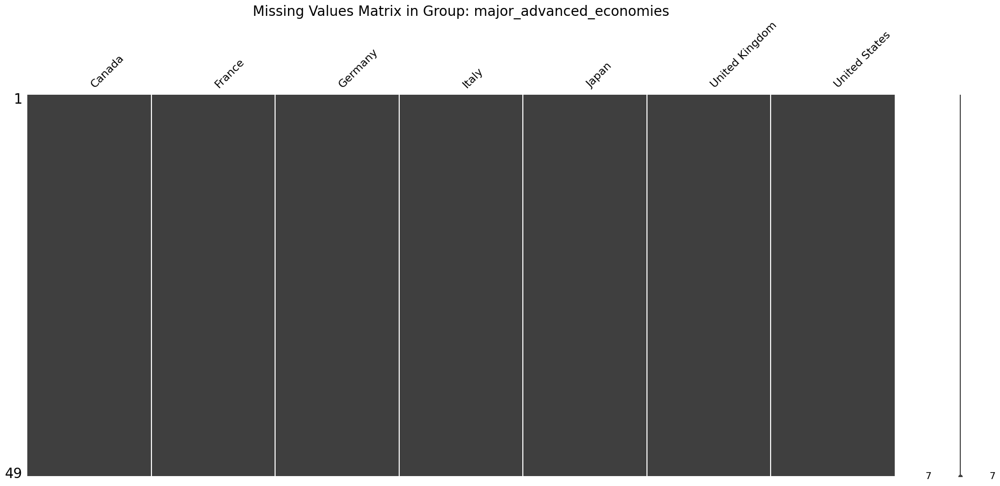

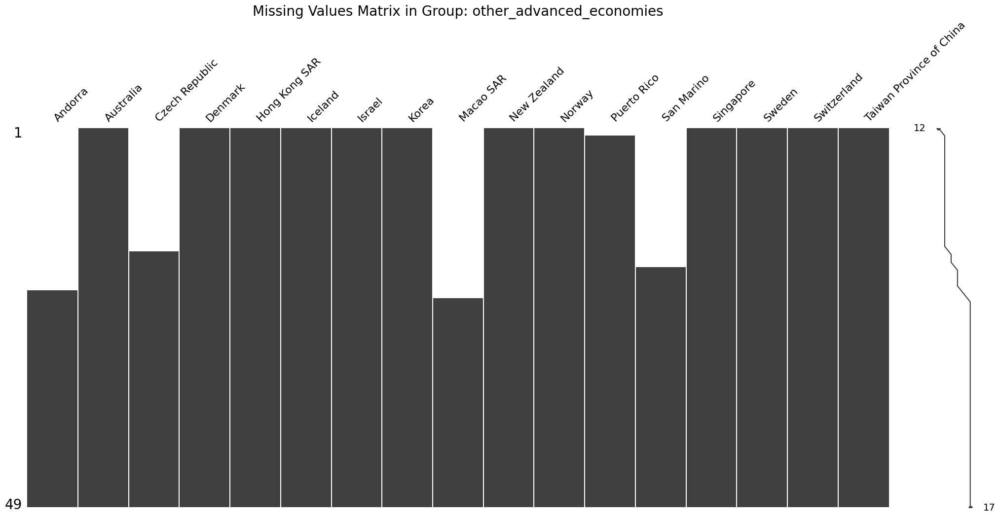

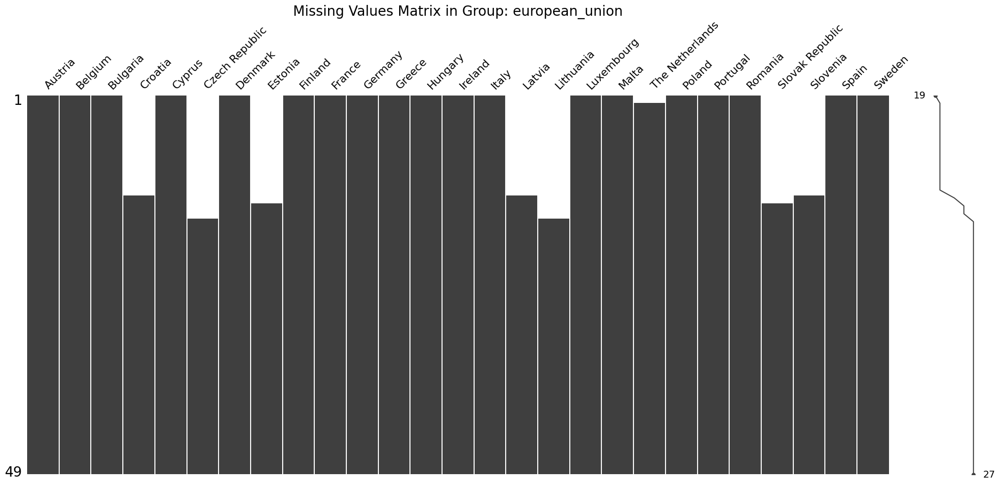

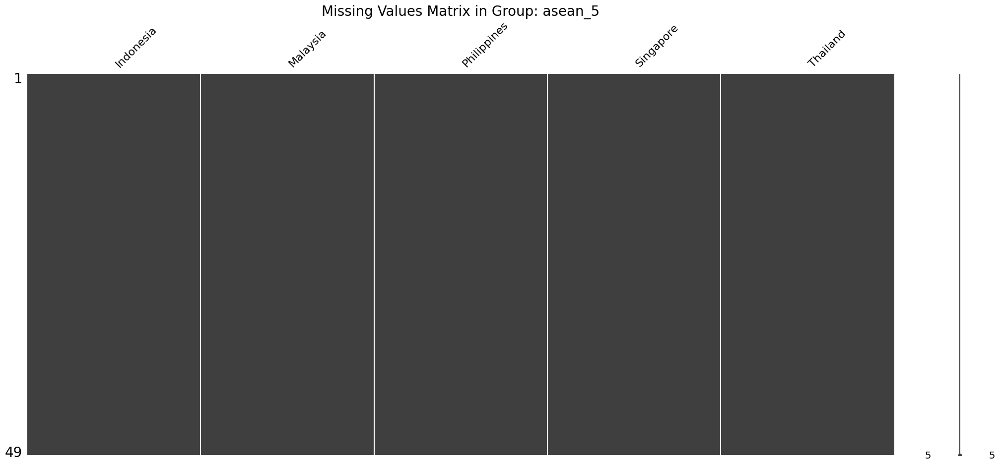

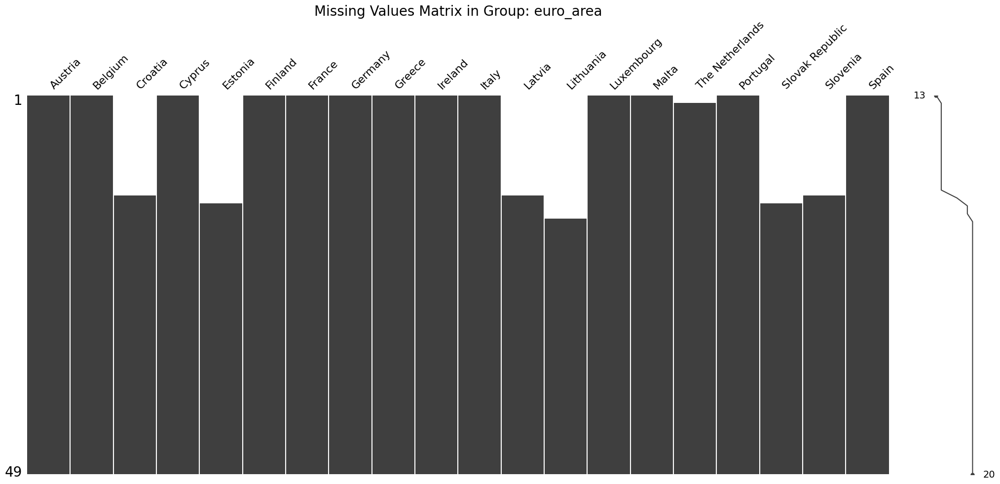

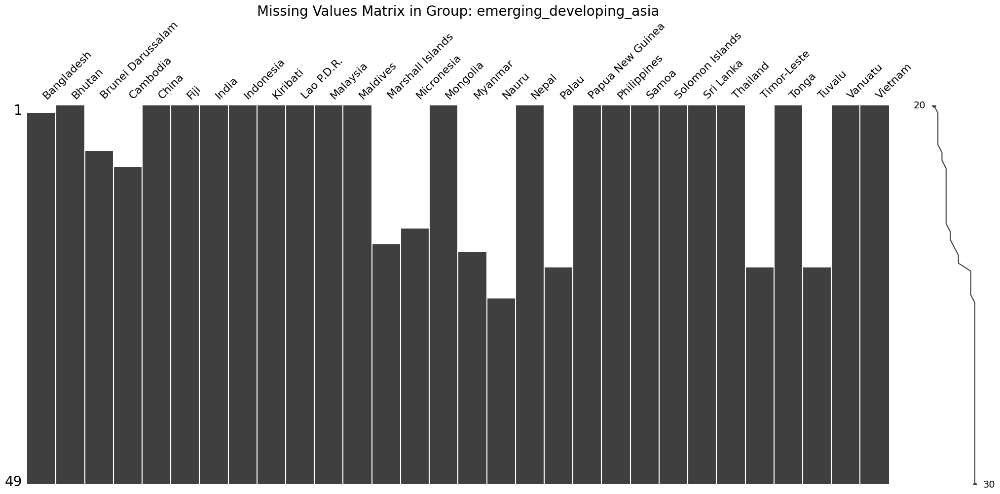

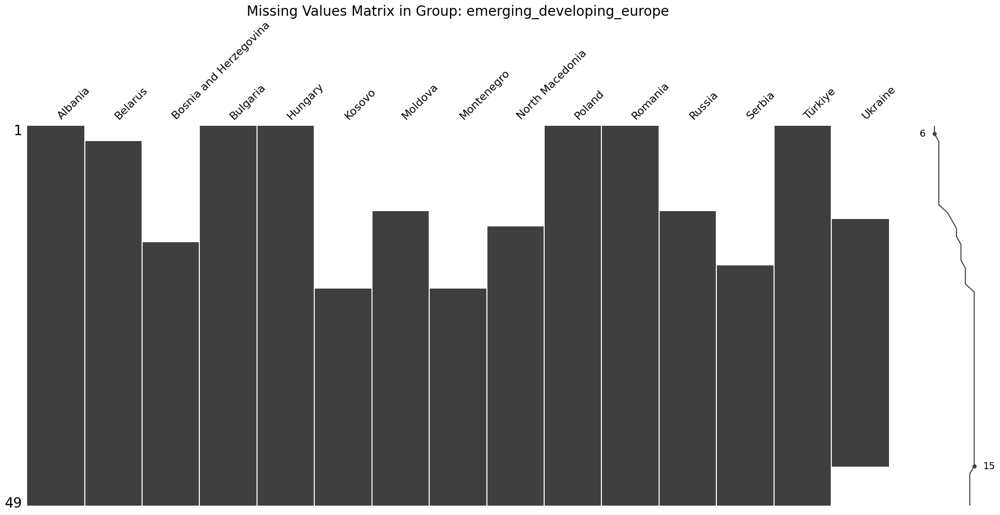

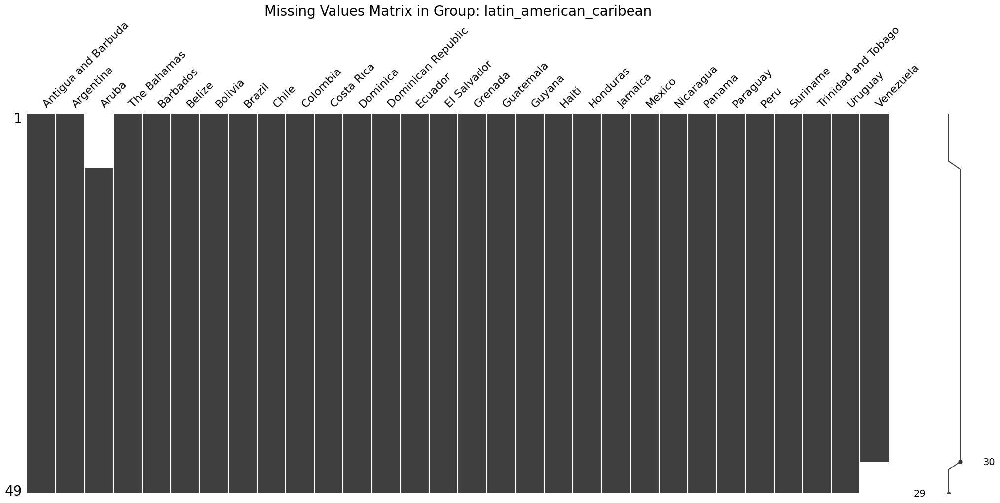

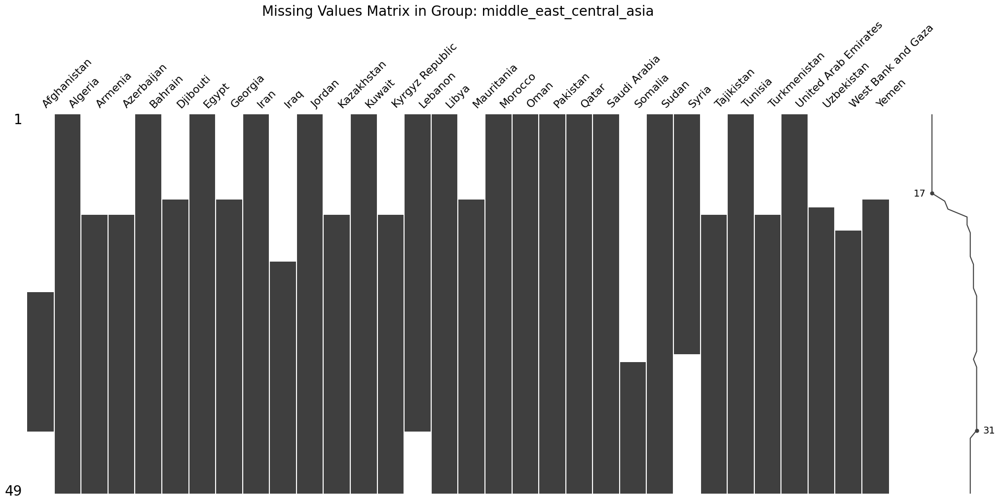

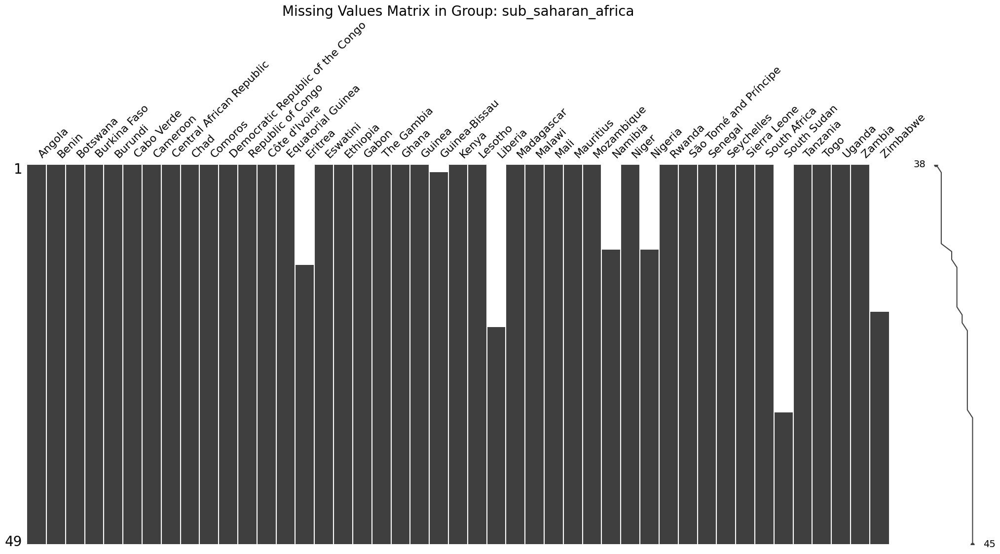

In [35]:
#Plots de valores nulos por país em cada grupo
for i in range(len(updated_economic_groups)):
    missingno.matrix(new_df[updated_economic_groups[i]])
    plt.title(f'Missing Values Matrix in Group: {group_names[i]}',fontsize = 20)

Como o Dataset também contém a variação do índice GDP por grupo econômico, também é interessante analisar a presença de valores faltantes nesses.

In [36]:
economic_groups_df = new_df[new_df.columns[-13:]]
economic_groups_df.isna().sum()

Real GDP growth (Annual percent change)
ASEAN-5                                      0
Advanced economies                           0
Emerging and Developing Asia                 0
Emerging and Developing Europe               0
Emerging market and developing economies     0
Euro area                                   12
European Union                               0
Latin America and the Caribbean              0
Major advanced economies (G7)                0
Middle East and Central Asia                 0
Other advanced economies                     0
Sub-Saharan Africa                          11
World                                        0
dtype: int64

Em contraste com os grupos calculados manualmente, apenas os grupos *Euro-Area* e Africa Subsariana (*Sub-Saharan Africa*) apresentam valores faltantes. Isso pode ajudar no preenchimento dos valores faltantes, afinal, como dito na documentação: *Composite data for country groups in the WEO are either sums or weighted averages of data for individual countries*.

Ao que parece, também há colunas que indicam a variação do índice para localizações geográficas. 

In [37]:
new_df[new_df.columns[-28:-13]].isna().sum()

Real GDP growth (Annual percent change)
Central America                   0
Central Asia and the Caucasus    13
East Asia                         0
Eastern Europe                    0
Europe                            0
Middle East (Region)              0
North Africa                      0
North America                     0
Pacific Islands                   0
South America                     0
South Asia                        0
Southeast Asia                    0
Sub-Saharan Africa (Region)      11
Western Europe                    0
Western Hemisphere (Region)       0
dtype: int64

Apenas duas regiões com valores faltantes. Como há o sufixo *(Region)*, é interessante investigar se há mais casos dentro dos dados com esse sufixo que não apareceram nessa relação.

In [38]:
for word in all_country_list:
    if '(Region)' in word:
        print(word)

Africa (Region)
Middle East (Region)
Sub-Saharan Africa (Region) 
Western Hemisphere (Region)


No caso, apenas a região da África. Uma rápida análise demonstra que essa região também apresenta valores faltantes. Pensando na imputação dos dados utilizando os países do continente africano, buscou-se quais eram e se todos estavam presentes no dataset.

In [39]:
new_df['Africa (Region)']

1980    NaN
1981    NaN
1982    NaN
1983    NaN
1984    NaN
1985    NaN
1986    NaN
1987    NaN
1988    NaN
1989    NaN
1990    NaN
1991    2.3
1992    0.1
1993    0.9
1994    2.5
1995    2.6
1996    5.0
1997    3.2
1998    4.0
1999    3.1
2000    4.3
2001    4.5
2002    4.9
2003    5.5
2004    5.9
2005    5.9
2006    5.5
2007    6.1
2008    5.2
2009    3.0
2010    5.9
2011    2.7
2012    6.2
2013    3.7
2014    3.8
2015    3.4
2016    2.2
2017    3.5
2018    3.4
2019    3.0
2020   -1.7
2021    4.9
2022    3.8
2023    3.7
2024    4.2
2025    4.3
2026    4.3
2027    4.4
2028    4.5
Name: Africa (Region), dtype: object

In [40]:
african_continent = ["Algeria", "Angola", "Benin", "Botswana", "Burkina Faso", "Burundi",
    "Cabo Verde", "Cameroon", "Central African Republic", "Chad", "Comoros",
    "Congo, Democratic Republic of the Congo", "Republic of Congo", "Djibouti",
    "Egypt", "Equatorial Guinea", "Eritrea", "Eswatini", "Ethiopia", "Gabon",
    "The Gambia", "Ghana", "Guinea", "Guinea-Bissau", "Ivory Coast", "Kenya",
    "Lesotho", "Liberia", "Libya", "Madagascar", "Malawi", "Mali", "Mauritania",
    "Mauritius", "Morocco", "Mozambique", "Namibia", "Niger", "Nigeria", "Rwanda",
    "Sao Tome and Principe", "Senegal", "Seychelles", "Sierra Leone", "Somalia",
    "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo", "Tunisia",
    "Uganda", "Zambia", "Zimbabwe"
]

In [41]:
africa = []
for test in african_continent:
    for word in all_country_list:
        if word.startswith(test):
            print(word)
            if word not in africa:
                africa.append(word)
                
print(f'{len(africa)} countries of 54 in African Continent')

Algeria
Angola
Benin
Botswana
Burkina Faso
Burundi
Cabo Verde
Cameroon
Central African Republic
Chad
Comoros
Republic of Congo
Djibouti
Egypt
Equatorial Guinea
Eritrea
Eswatini
Ethiopia
Gabon
The Gambia
Ghana
Guinea
Guinea-Bissau
Guinea-Bissau
Kenya
Lesotho
Liberia
Libya
Madagascar
Malawi
Mali
Mauritania
Mauritius
Morocco
Mozambique
Namibia
Niger
Nigeria
Nigeria
Rwanda
Senegal
Seychelles
Sierra Leone
Somalia
South Africa
South Sudan
Sudan
Tanzania
Togo
Tunisia
Uganda
Zambia
Zimbabwe
51 countries of 54 in African Continent


Portanto, 51 dos 54 países do continente africano estão presentes no dataset.

Para futuras análises envolvendo as regiões, cabem as seguintes considerações
- *The region of Western Europe includes the regions of northern Europe, southern Europe, Central Europe, and the British Isles. Eastern Europe is everything east of Germany, Austria, and Italy.*
- *In addition to Syria, Iran, Iraq, Afghanistan, Jordan, and Saudi Arabia, it shows the eastern parts of Egypt and the Anglo-Egyptian Condominium of Sudan as well as parts of Eritrea and Ethiopia. Many borders on the map, particularly on the Arabian Peninsula, are shown as still undetermined.*
- *The countries present in Pacific Islands are the Commonwealth of the Northern Mariana Islands, the Federated States of Micronesia, Fiji, French Polynesia, Kiribati, the Marshall Islands, Nauru, New Caledonia, New Zealand, Palau, Solomon Islands, Tonga, Tuvalu, Vanuatu, and Wallis and Futuna.*
- *The Central Asia and Caucasus region comprises five Central Asia countries — Uzbekistan, Kazakhstan, the Kyrgyz Republic, Tajikistan and Turkmenistan — lying east of the Caspian Sea, and their three neighbors to the west of the Caspian sea, namely Azerbaijan, Armenia and Georgia*

A ideia é portanto de imputar aos países com índices ausentes valores relacionados com os outros países de suas regiões dentro de cada grupo econônmico.

### Países (com dados faltantes) e regiões

Com base na análise de grupos econômicos com valores faltantes, os únicos eram *Euro area* e Africa Subsariana. Considerando que cada grupo é a média de seus países, a imputação nesse caso pode ser feita dessa maneira, mas primeiro é preciso preencher os dados dos países de cada grupo. 

Sendo assim, esses dois grupos serão analisados inicialmente.

In [42]:
new_df[euro_area].isna().sum()

Real GDP growth (Annual percent change)
Austria             0
Belgium             0
Croatia            13
Cyprus              0
Estonia            14
Finland             0
France              0
Germany             0
Greece              0
Ireland             0
Italy               0
Latvia             13
Lithuania          16
Luxembourg          0
Malta               0
The Netherlands     1
Portugal            0
Slovak Republic    14
Slovenia           13
Spain               0
dtype: int64

In [43]:
new_df[euro_area] 

Real GDP growth (Annual percent change),Austria,Belgium,Croatia,Cyprus,Estonia,Finland,France,Germany,Greece,Ireland,Italy,Latvia,Lithuania,Luxembourg,Malta,The Netherlands,Portugal,Slovak Republic,Slovenia,Spain
1980,2.3,4.4,NaN,5.9,NaN,5.7,1.8,1.3,0.7,2.9,3.1,NaN,NaN,3.2,7.0,NaN,6.7,NaN,NaN,1.2
1981,-0.1,-0.3,NaN,3.1,NaN,1.3,1.1,0.1,-1.6,2.5,0.6,NaN,NaN,0.8,2.7,-0.5,3.5,NaN,NaN,-0.4
1982,1.9,0.6,NaN,6.3,NaN,3.1,2.5,-0.8,-1.1,1.5,0.2,NaN,NaN,1.0,0.1,-1.3,2.2,NaN,NaN,1.2
1983,2.8,0.3,NaN,5.3,NaN,3.1,1.3,1.6,-1.1,-0.7,0.9,NaN,NaN,1.9,2.6,1.8,1.0,NaN,NaN,1.7
1984,0.3,2.5,NaN,8.8,NaN,3.2,1.6,2.8,2.0,3.2,3.0,NaN,NaN,4.7,0.8,3.1,-1.0,NaN,NaN,1.7
1985,2.2,1.7,NaN,4.7,NaN,3.5,1.7,2.2,2.5,1.9,2.6,NaN,NaN,5.6,2.4,2.7,1.6,NaN,NaN,2.4
1986,2.3,1.8,NaN,3.6,NaN,2.7,2.3,2.4,0.5,0.4,2.7,NaN,NaN,10.0,3.8,3.1,3.3,NaN,NaN,3.4
1987,1.7,2.3,NaN,7.1,NaN,3.6,2.6,1.5,-2.3,3.6,3.1,NaN,NaN,4.0,5.7,1.9,7.6,NaN,NaN,5.7
1988,1.0,4.7,NaN,8.3,NaN,5.2,4.6,3.7,4.3,3.0,4.0,NaN,NaN,8.5,6.8,4.6,5.3,NaN,NaN,5.3
1989,3.9,3.5,NaN,8.1,NaN,5.1,4.5,3.9,3.8,5.6,3.3,NaN,NaN,9.8,7.1,4.5,6.6,NaN,NaN,5.0


- Croatia - Western Europe
- Estonia - Western Europe
- Latvia - Western Europe
- Lithuania - Western Europe
- Slovak Republic - Western Europe
- Slovenia - Western Europe

Considerando a estratégia definida, logo seriam imputados para Croácia, Eslovência e Eslováquia a média dos índices dos países que compõe a Europa Ocidental, para Estônia, Latvia e Lituânia a média dos índices dos países que compõe a Europa Oriental. 

Isso será aplicado e melhor discutido na etapa de Feature Engineering. Aqui, seguem as análises.


In [44]:
new_df[sub_saharan_africa].isna().sum()

Real GDP growth (Annual percent change)
Angola                               0
Benin                                0
Botswana                             0
Burkina Faso                         0
Burundi                              0
Cabo Verde                           0
Cameroon                             0
Central African Republic             0
Chad                                 0
Comoros                              0
Democratic Republic of the Congo     0
Republic of Congo                    0
Côte d'Ivoire                        0
Equatorial Guinea                    0
Eritrea                             13
Eswatini                             0
Ethiopia                             0
Gabon                                0
The Gambia                           0
Ghana                                0
Guinea                               0
Guinea-Bissau                        1
Kenya                                0
Lesotho                              0
Liberia                 

In [45]:
missing_sub_saharan = ['Eritrea','Guinea-Bissau','Liberia','Namibia','Nigeria','Zimbabwe']
new_df[missing_sub_saharan]

Real GDP growth (Annual percent change),Eritrea,Guinea-Bissau,Liberia,Namibia,Nigeria,Zimbabwe
1980,NaN,NaN,NaN,NaN,NaN,NaN
1981,NaN,-0.5,NaN,NaN,NaN,NaN
1982,NaN,4.2,NaN,NaN,NaN,NaN
1983,NaN,-3.4,NaN,NaN,NaN,NaN
1984,NaN,5.5,NaN,NaN,NaN,NaN
1985,NaN,4.3,NaN,NaN,NaN,NaN
1986,NaN,-1.0,NaN,NaN,NaN,NaN
1987,NaN,5.6,NaN,NaN,NaN,NaN
1988,NaN,2.0,NaN,NaN,NaN,NaN
1989,NaN,2.9,NaN,NaN,NaN,NaN


No caso da África há um fator que impede o uso da estratégia da imputação das regiões: todos os países pertecem ao mesmo local, e tanto o grupo como região da África subsariana no dataset contém valores faltantes para praticamente o mesmo período dos países.

In [46]:
new_df['Sub-Saharan Africa'].isna()

1980     True
1981     True
1982     True
1983     True
1984     True
1985     True
1986     True
1987     True
1988     True
1989     True
1990     True
1991    False
1992    False
1993    False
1994    False
1995    False
1996    False
1997    False
1998    False
1999    False
2000    False
2001    False
2002    False
2003    False
2004    False
2005    False
2006    False
2007    False
2008    False
2009    False
2010    False
2011    False
2012    False
2013    False
2014    False
2015    False
2016    False
2017    False
2018    False
2019    False
2020    False
2021    False
2022    False
2023    False
2024    False
2025    False
2026    False
2027    False
2028    False
Name: Sub-Saharan Africa, dtype: bool

In [47]:
new_df['Sub-Saharan Africa (Region) '].isna()

1980     True
1981     True
1982     True
1983     True
1984     True
1985     True
1986     True
1987     True
1988     True
1989     True
1990     True
1991    False
1992    False
1993    False
1994    False
1995    False
1996    False
1997    False
1998    False
1999    False
2000    False
2001    False
2002    False
2003    False
2004    False
2005    False
2006    False
2007    False
2008    False
2009    False
2010    False
2011    False
2012    False
2013    False
2014    False
2015    False
2016    False
2017    False
2018    False
2019    False
2020    False
2021    False
2022    False
2023    False
2024    False
2025    False
2026    False
2027    False
2028    False
Name: Sub-Saharan Africa (Region) , dtype: bool

Nesse caso então outras estratégias podem ser pensadas. A partir de 1990 podem ser imputados dados da coluna da África Subsariana nos dados faltantes dos países que compõe esse grupo, ou também podem ser relacionados com os países mais próximos de cada um dos que contém índices faltantes.

### Países próximos

- Eritrea - Ethiopia, Sudan, Djibouti
- Guinea-Bissau - Guinea, Senegal
- Liberia - Guinea, Sierra Leone
- Namibia - Angola, Zambia, Botswana, South Africa
- Nigeria - Benin, Cameroon, Chad, Niger
- Zimbabwe - Botswanai, Mozambique, South Africa, Zambia
- South Sudan - Sudan, Ethiopia, Kenya, Uganda, and Central African Republic

Agora é preciso constatar quais desses países estão presentes nos dados

In [48]:
neighbours = ['Botswana', 'Mozambique', 'South Africa', 'Zambia','Benin','Cameroon','Chad', 'Niger','Guinea', 'Sierra Leone','Senegal','Ethiopia', 'Sudan', 'Djibouti','Uganda','Democratic Republic of the Congo','Central African Republic']
res = all(country in all_country_list for country in neighbours)
# Printing result
print("Does every element of neighbours is in dataframe countries ? : " + str(res))


Does every element of neighbours is in dataframe countries ? : True


Nesse caso, todos os países vizinhos estão no dataset. Agora é preciso chegar quais dos países vizinhos tem valores nulos, se houver

In [49]:
new_df[neighbours].isna().sum()

Real GDP growth (Annual percent change)
Botswana                             0
Mozambique                           0
South Africa                         0
Zambia                               0
Benin                                0
Cameroon                             0
Chad                                 0
Niger                                0
Guinea                               0
Sierra Leone                         0
Senegal                              0
Ethiopia                             0
Sudan                                0
Djibouti                            11
Uganda                               0
Democratic Republic of the Congo     0
Central African Republic             0
dtype: int64

Como Djbouti tem valores nulos, é preciso então deixar a correção dessa parte do dataset posterior à correção do grupo que contém esse país. Desse modo, partimos para a análise dos outros grupos. Análises similares serão aplicadas para os casos seguintes.


In [50]:
new_df[major_advanced_economies].isna().sum()

Real GDP growth (Annual percent change)
Canada            0
France            0
Germany           0
Italy             0
Japan             0
United Kingdom    0
United States     0
dtype: int64

In [51]:
new_df[other_advanced_economies].isna().sum()

Real GDP growth (Annual percent change)
Andorra                     21
Australia                    0
Czech Republic              16
Denmark                      0
Hong Kong SAR                0
Iceland                      0
Israel                       0
Korea                        0
Macao SAR                   22
New Zealand                  0
Norway                       0
Puerto Rico                  1
San Marino                  18
Singapore                    0
Sweden                       0
Switzerland                  0
Taiwan Province of China     0
dtype: int64

Países e suas regiões
- Andorra - Western Europe
- Czech Republic - Eastern Europe
- Macao SAR - Southeasth Asia
- San Marino - Western Europe
- Puerto Rico - Carribean


In [52]:
new_df[other_advanced_economies]

Real GDP growth (Annual percent change),Andorra,Australia,Czech Republic,Denmark,Hong Kong SAR,Iceland,Israel,Korea,Macao SAR,New Zealand,Norway,Puerto Rico,San Marino,Singapore,Sweden,Switzerland,Taiwan Province of China
1980,NaN,2.9,NaN,-0.5,10.3,5.7,3.6,-1.6,NaN,1.0,4.5,NaN,NaN,10.1,4.6,5.1,8.0
1981,NaN,4.1,NaN,-0.7,9.2,4.3,4.7,7.2,NaN,3.0,1.6,1.1,NaN,10.8,4.5,1.6,7.1
1982,NaN,0.1,NaN,3.7,2.9,2.2,1.4,8.3,NaN,2.9,0.2,-3.0,NaN,7.1,1.4,-1.3,4.8
1983,NaN,-0.5,NaN,2.6,6.0,-2.2,2.6,13.4,NaN,-0.1,4.0,0.5,NaN,8.6,2.1,0.6,9.0
1984,NaN,6.3,NaN,4.2,10.0,4.1,2.2,10.6,NaN,6.9,6.1,7.3,NaN,8.8,4.3,3.1,10.0
1985,NaN,5.5,NaN,4.0,0.7,3.3,4.5,7.8,NaN,1.2,5.6,2.1,NaN,-0.6,2.3,3.7,4.8
1986,NaN,2.4,NaN,4.9,11.1,6.3,3.6,11.3,NaN,1.8,4.0,8.2,NaN,1.3,3.0,1.8,11.5
1987,NaN,4.9,NaN,0.3,13.4,8.5,7.5,12.7,NaN,2.4,1.8,4.9,NaN,10.8,3.3,1.5,12.8
1988,NaN,4.3,NaN,0.0,8.5,-0.1,3.6,12.0,NaN,0.6,-0.3,6.5,NaN,11.3,2.5,3.3,8.0
1989,NaN,4.6,NaN,0.6,2.3,0.3,1.4,7.1,NaN,0.4,1.0,4.9,NaN,10.2,2.7,4.4,8.7


In [53]:
new_df[european_union].isna().sum()

Real GDP growth (Annual percent change)
Austria             0
Belgium             0
Bulgaria            0
Croatia            13
Cyprus              0
Czech Republic     16
Denmark             0
Estonia            14
Finland             0
France              0
Germany             0
Greece              0
Hungary             0
Ireland             0
Italy               0
Latvia             13
Lithuania          16
Luxembourg          0
Malta               0
The Netherlands     1
Poland              0
Portugal            0
Romania             0
Slovak Republic    14
Slovenia           13
Spain               0
Sweden              0
dtype: int64

Como nesse caso a maioria dos países estão presentes no caso da *Euro Area*, o método aplicado irá corrigir os dados faltantes de ambas as regiões simultaneamente.

In [54]:
new_df[asean_5].isna().sum()

Real GDP growth (Annual percent change)
Indonesia      0
Malaysia       0
Philippines    0
Singapore      0
Thailand       0
dtype: int64

In [55]:
new_df[emerging_developing_asia].isna().sum()

Real GDP growth (Annual percent change)
Bangladesh            1
Bhutan                0
Brunei Darussalam     6
Cambodia              8
China                 0
Fiji                  0
India                 0
Indonesia             0
Kiribati              0
Lao P.D.R.            0
Malaysia              0
Maldives              0
Marshall Islands     18
Micronesia           16
Mongolia              0
Myanmar              19
Nauru                25
Nepal                 0
Palau                21
Papua New Guinea      0
Philippines           0
Samoa                 0
Solomon Islands       0
Sri Lanka             0
Thailand              0
Timor-Leste          21
Tonga                 0
Tuvalu               21
Vanuatu               0
Vietnam               0
dtype: int64

In [56]:
dev_asia_missing_countries = ['Bangladesh','Brunei Darussalam','Cambodia','Marshall Islands','Myanmar','Nauru','Palau','Timor-Leste','Tuvalu']
new_df[dev_asia_missing_countries]

Real GDP growth (Annual percent change),Bangladesh,Brunei Darussalam,Cambodia,Marshall Islands,Myanmar,Nauru,Palau,Timor-Leste,Tuvalu
1980,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1981,3.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1982,2.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1983,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984,5.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1985,3.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1986,4.2,-2.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1987,3.7,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1988,2.2,1.1,9.6,NaN,NaN,NaN,NaN,NaN,NaN
1989,2.6,-1.1,3.3,NaN,NaN,NaN,NaN,NaN,NaN


Países e suas regiões

- Bangladesh - South Asia
- Brunei Darussalam - Southeast Asia
- Cambodia - Southeast Asia
- Marshall Islands - Pacific Islands
- Myanmar - Southeast Asia
- Nauru - Pacific Islands
- Palau - Pacific Islands
- Timor-Leste - Southeast Asia
- Tuvalu - Pacific Islands

In [57]:
new_df[emerging_developing_europe].isna().sum()

Real GDP growth (Annual percent change)
Albania                    0
Belarus                    2
Bosnia and Herzegovina    15
Bulgaria                   0
Hungary                    0
Kosovo                    21
Moldova                   11
Montenegro                21
North Macedonia           13
Poland                     0
Romania                    0
Russia                    11
Serbia                    18
Türkiye                    0
Ukraine                   17
dtype: int64

In [58]:
new_df[emerging_developing_europe]

Real GDP growth (Annual percent change),Albania,Belarus,Bosnia and Herzegovina,Bulgaria,Hungary,Kosovo,Moldova,Montenegro,North Macedonia,Poland,Romania,Russia,Serbia,Türkiye,Ukraine
1980,2.7,NaN,NaN,5.7,0.2,NaN,NaN,NaN,NaN,-6.0,3.3,NaN,NaN,-0.8,NaN
1981,5.7,NaN,NaN,5.3,2.9,NaN,NaN,NaN,NaN,-10.0,0.1,NaN,NaN,4.4,NaN
1982,2.9,4.0,NaN,4.2,2.8,NaN,NaN,NaN,NaN,-4.8,3.9,NaN,NaN,3.4,NaN
1983,1.1,4.3,NaN,3.0,0.7,NaN,NaN,NaN,NaN,5.6,6.0,NaN,NaN,4.8,NaN
1984,2.0,3.0,NaN,4.6,2.7,NaN,NaN,NaN,NaN,-0.4,6.0,NaN,NaN,6.8,NaN
1985,-1.5,1.7,NaN,1.8,-0.3,NaN,NaN,NaN,NaN,3.9,-0.1,NaN,NaN,4.3,NaN
1986,5.6,3.6,NaN,5.3,1.5,NaN,NaN,NaN,NaN,3.5,2.4,NaN,NaN,6.9,NaN
1987,-0.8,2.8,NaN,4.7,4.1,NaN,NaN,NaN,NaN,2.3,0.8,NaN,NaN,10.0,NaN
1988,-1.4,5.3,NaN,2.4,-0.1,NaN,NaN,NaN,NaN,3.3,-0.5,NaN,NaN,2.1,NaN
1989,9.8,3.0,NaN,-0.5,0.7,NaN,NaN,NaN,NaN,3.8,-5.8,NaN,NaN,0.3,NaN


Países e suas regiões
- Belarus - East Europe
- Bosnia and Herzegovina - Western Europe 
- Kosovo - Western Europe
- Moldova - East Europe
- Montenegro - Western Europe
- Serbia - Western Europe
- Russia - Eastern Europe
- Ukraine - East Europe

In [59]:
new_df[latin_american_caribean].isna().sum()

Real GDP growth (Annual percent change)
Antigua and Barbuda    0
Argentina              0
Aruba                  7
The Bahamas            0
Barbados               0
Belize                 0
Bolivia                0
Brazil                 0
Chile                  0
Colombia               0
Costa Rica             0
Dominica               0
Dominican Republic     0
Ecuador                0
El Salvador            0
Grenada                0
Guatemala              0
Guyana                 0
Haiti                  0
Honduras               0
Jamaica                0
Mexico                 0
Nicaragua              0
Panama                 0
Paraguay               0
Peru                   0
Suriname               0
Trinidad and Tobago    0
Uruguay                0
Venezuela              4
dtype: int64

In [60]:
new_df[['Aruba','Venezuela']]

Real GDP growth (Annual percent change),Aruba,Venezuela
1980,NaN,-4.9
1981,NaN,-1.3
1982,NaN,2.6
1983,NaN,-9.9
1984,NaN,5.2
1985,NaN,0.9
1986,NaN,6.1
1987,16.1,4.8
1988,18.6,6.5
1989,12.1,-13.9


Países e suas regiões

- Aruba - South America
- Venezuela - South America

In [61]:
new_df[middle_east_central_asia].isna().sum()

Real GDP growth (Annual percent change)
Afghanistan             31
Algeria                  0
Armenia                 13
Azerbaijan              13
Bahrain                  0
Djibouti                11
Egypt                    0
Georgia                 11
Iran                     0
Iraq                    19
Jordan                   0
Kazakhstan              13
Kuwait                   0
Kyrgyz Republic         13
Lebanon                  8
Libya                    0
Mauritania              11
Morocco                  0
Oman                     0
Pakistan                 0
Qatar                    0
Saudi Arabia             0
Somalia                 32
Sudan                    0
Syria                   18
Tajikistan              13
Tunisia                  0
Turkmenistan            13
United Arab Emirates     0
Uzbekistan              12
West Bank and Gaza      15
Yemen                   11
dtype: int64

In [62]:
middle_east_missing_countries = ['Afghanistan','Armenia','Azerbaijan','Djibouti','Georgia','Iraq','Kazakhstan','Kyrgyz Republic','Lebanon','Mauritania','Somalia','Syria','Tajikistan','Turkmenistan','Uzbekistan','West Bank and Gaza','Yemen']
new_df[middle_east_missing_countries]

Real GDP growth (Annual percent change),Afghanistan,Armenia,Azerbaijan,Djibouti,Georgia,Iraq,Kazakhstan,Kyrgyz Republic,Lebanon,Mauritania,Somalia,Syria,Tajikistan,Turkmenistan,Uzbekistan,West Bank and Gaza,Yemen
1980,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.5,NaN,NaN,10.5,NaN,NaN,NaN,NaN,NaN
1981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.5,NaN,NaN,8.5,NaN,NaN,NaN,NaN,NaN
1982,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-36.8,NaN,NaN,2.6,NaN,NaN,NaN,NaN,NaN
1983,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.7,NaN,NaN,1.6,NaN,NaN,NaN,NaN,NaN
1984,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.5,NaN,NaN,-6.5,NaN,NaN,NaN,NaN,NaN
1985,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.3,NaN,NaN,7.3,NaN,NaN,NaN,NaN,NaN
1986,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.8,NaN,NaN,-4.8,NaN,NaN,NaN,NaN,NaN
1987,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.7,NaN,NaN,1.3,NaN,NaN,NaN,NaN,NaN
1988,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-28.2,NaN,NaN,12.7,NaN,NaN,NaN,NaN,NaN
1989,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-42.2,NaN,NaN,-6.1,NaN,NaN,NaN,NaN,NaN


Como todos os países aqui pertencem à mesma região, a abordagem será semelhante aos países da África subsariana. 

Países Vizinhos
- Afghanistan - Pakistan, Iran, Turkmenistan, Uzbekistan, and Tajikistan
- Armenia - Georgia, Azerbaijan, Iran and Türkiye
- Azerbaijan - Armenia, Georgia, Iran and Russia
- Djibouti - Eritrea, Ethiopia and Somalia
- Georgia - Russia, Türkiye, Armenia and Azerbaijan
- Iraq - Kuwait, Iran, Türkiye, Syria, Jordan, and Saudi Arabia
- Kazakhstan - Russia, China, Kyrgyz Republic, Uzbekistan, the Aral Sea, and Turkmenistan
- Kyrgyz Republic - Kazakhstan, Uzbekistan, Tajikistan and China
- Lebanon -  Israel and Syria 
- Mauritania - Western Sahara, Algeria, Mali, and Senegal
- Somalia - Gulf of Aden, Kenya, Ethiopia, and Djibouti
- Syria - Türkiye, Iraq, Jordan and Lebanon
- Tajikistan - Kyrgyz Republic, China, Afghanistan, and Uzbekistan
- Turkmenistan - Kazakhstan, Uzbekistan, Afghanistan, and Iran
- Uzbekistan - Kazakhstan, Kyrgyz Republic, Tajikistan, Afghanistan, and Turkmenistan
- West Bank and Gaza - Jordan and Israel
- Yemen - Saudi Arabia and Oman

Há um problema visível. Muitos dos países com dados faltantes são vizinhos entre si, o que causa uma certa complicação no uso desses países para preencher os dados que faltam. De início, é preciso analisar quais são os países que compartilham mais vizinhos, ou seja, os mais presentes.

In [63]:
all_neighbours = ['Pakistan', 'Iran', 'Turkmenistan', 'Uzbekistan', 'Tajikistan','Georgia', 'Azerbaijan', 'Iran', 'Türkiye','Armenia', 'Georgia', 'Iran', 'Russia','Eritrea', 'Ethiopia', 'Somalia','Russia', 'Türkiye', 'Armenia', 'Azerbaijan','Kuwait', 'Iran', 'Türkiye', 'Syria', 'Jordan', 'Saudi Arabia','Russia', 'China', 'Kyrgyz Republic', 'Uzbekistan', 'the Aral Sea', 'Turkmenistan','Kazakhstan','Uzbekistan', 'Tajikistan', 'China','Israel', 'Syria','Western Sahara', 'Algeria', 'Mali', 'Senegal','Gulf of Aden', 'Kenya', 'Ethiopia', 'Djibouti','Türkiye', 'Iraq', 'Jordan', 'Lebanon','Kyrgyz Republic', 'China', 'Afghanistan', 'Uzbekistan','Kazakhstan', 'Uzbekistan','Afghanistan', 'Iran','Kazakhstan', 'Kyrgyz Republic', 'Tajikistan', 'Afghanistan', 'Turkmenistan','Jordan' ,'Israel','Saudi Arabia' ,'Oman']
    
from collections import Counter

repeated_countries = dict(Counter(all_neighbours))
countries_list = pd.Series(repeated_countries)
new_countries_list = countries_list.drop(labels = [country for country in countries_list.index if country not in middle_east_missing_countries])
new_countries_list.sort_values(ascending = False)


Uzbekistan         5
Turkmenistan       3
Tajikistan         3
Kyrgyz Republic    3
Kazakhstan         3
Afghanistan        3
Georgia            2
Azerbaijan         2
Armenia            2
Syria              2
Somalia            1
Djibouti           1
Iraq               1
Lebanon            1
dtype: int64

Também é interessante ver a distribuição dos outros países, avaliando o impacto de sua ausência caso não estejam presentes no dataset.

In [64]:
new_countries_list = countries_list.drop(labels = [country for country in countries_list.index if country in middle_east_missing_countries])
new_countries_list.sort_values(ascending = False)

Iran              5
Türkiye           4
China             3
Russia            3
Jordan            3
Ethiopia          2
Saudi Arabia      2
Israel            2
Algeria           1
Kenya             1
Gulf of Aden      1
Senegal           1
Mali              1
Pakistan          1
Western Sahara    1
the Aral Sea      1
Kuwait            1
Eritrea           1
Oman              1
dtype: int64

In [65]:
res = all(country in all_country_list for country in new_countries_list.index)
# Printing result
print("Does every element of neighbours is in dataframe countries ? : " + str(res))

for country in new_countries_list.index:
    if country not in all_country_list:
        print(country)

Does every element of neighbours is in dataframe countries ? : False
the Aral Sea
Western Sahara
Gulf of Aden


A ausência desses três países não afeta tanto o método por aparecem apenas uma vez cada. Ainda assim, vamos checar se de fato esses países não estão presentes no Dataset.

In [66]:
missing = ['Aral Sea',
'Western Sahara',
'Gulf of Aden']
for test in missing:
    for word in all_country_list:
        if word.startswith(test):
            print(word)

Ou seja, esses três países realmente não estão no dataset.

Com isso, tem-se a informação de que o Uzbequistão é o país com valores faltantes mais presente nas vizinhanças. 
Além disso, os países com valores faltantes que podem ser preenchidos sem dificuldades são Yemen, West Bank and Gaza,e Mauritania. Além disso, Lebanon e Syria só tem valores faltantes nos anos finais, o que auxilia no preenchimento de outros que possuem ausência só nos anos inciais e tem esses dois como vizinhos.

### As estratégias de preenchimento de todos os dados serão abordadas na parte de Feature Engineering.

Também é interessante observar a existência de correlações entre grupos e regiões, tanto para o modelo como para escolha da imputação dos valores

In [67]:
#Preprocessing

new_df['Year'] = new_df.index
new_df = new_df.reset_index().drop('index',axis = 1)
new_df.columns.name = None
new_df.head()

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World,Year
0,NaN,2.7,-5.4,NaN,2.4,8.2,0.7,NaN,NaN,2.9,...,3.3,NaN,1.8,6.4,0.9,-1.9,3.8,NaN,2.1,1980
1,NaN,5.7,3.0,NaN,-4.4,3.8,-5.7,NaN,NaN,4.1,...,1.9,NaN,0.1,0.9,2.0,-0.2,4.2,NaN,1.9,1981
2,NaN,2.9,6.4,NaN,0.0,-0.1,-3.1,NaN,NaN,0.1,...,1.5,NaN,0.6,-0.5,-0.1,0.4,2.2,NaN,0.7,1982
3,NaN,1.1,5.4,NaN,4.2,5.4,3.7,NaN,NaN,-0.5,...,1.8,NaN,1.7,-2.8,3.3,0.7,4.0,NaN,2.6,1983
4,NaN,2.0,5.6,NaN,6.0,10.2,2.0,NaN,NaN,6.3,...,4.1,NaN,2.5,3.9,5.0,0.3,6.6,NaN,4.6,1984


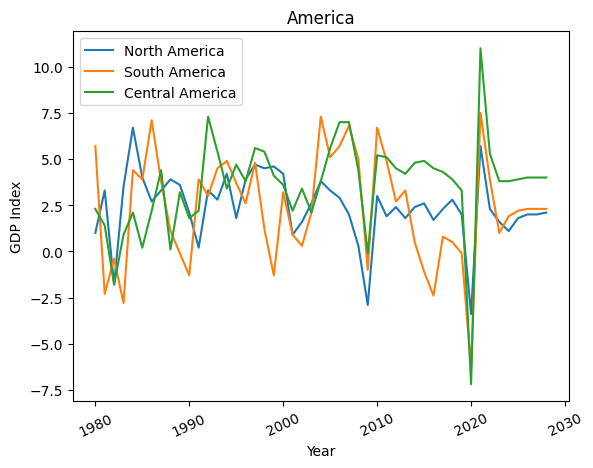

In [68]:
#America
sns.lineplot(x = "Year", y = "North America", data = new_df, label = "North America")
sns.lineplot(x = "Year", y = "South America", data = new_df, label = "South America")
sns.lineplot(x = "Year", y = "Central America", data = new_df, label = "Central America")
plt.ylabel("GDP Index")
plt.xticks(rotation = 25)
plt.title('America')
plt.legend()

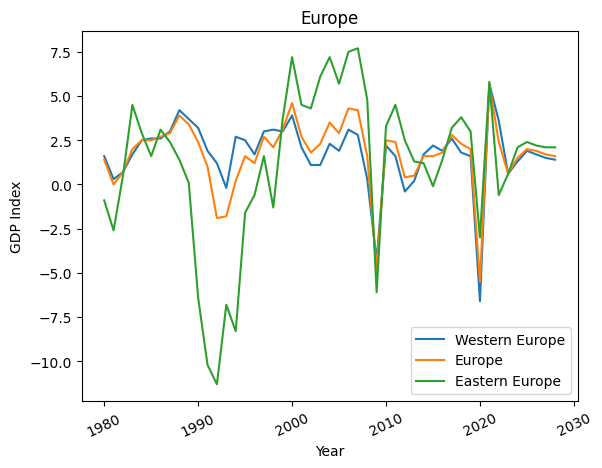

In [69]:
#Europe
sns.lineplot(x = "Year", y = "Western Europe", data = new_df, label = "Western Europe")
sns.lineplot(x = "Year", y = "Europe", data = new_df, label = "Europe")
sns.lineplot(x = "Year", y = "Eastern Europe ", data = new_df, label = "Eastern Europe")
plt.ylabel("GDP Index")
plt.xticks(rotation = 25)
plt.title('Europe')
plt.legend()

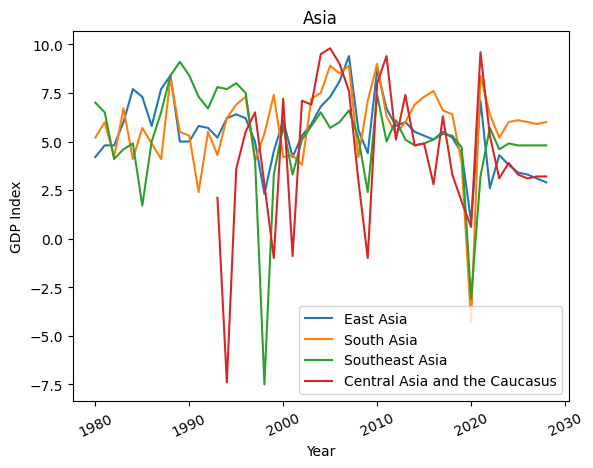

In [70]:
#Asia
sns.lineplot(x = "Year", y = "East Asia", data = new_df,label = "East Asia")
sns.lineplot(x = "Year", y = "South Asia", data = new_df,label = "South Asia")
sns.lineplot(x = "Year", y = "Southeast Asia", data = new_df,label = "Southeast Asia")
sns.lineplot(x = "Year", y = "Central Asia and the Caucasus", data = new_df,label = "Central Asia and the Caucasus")
plt.ylabel("GDP Index")
plt.xticks(rotation = 25)
plt.title('Asia')
plt.legend()

Text(0.5, 1.0, 'Africa')

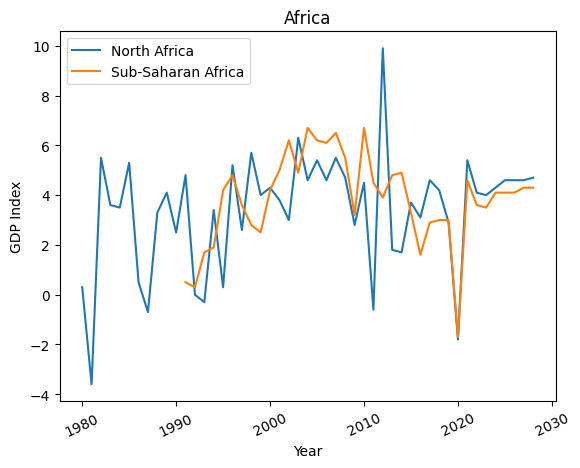

In [71]:
#Africa
sns.lineplot(x = "Year", y = "North Africa", data = new_df, label = "North Africa")
sns.lineplot(x = "Year", y = "Sub-Saharan Africa (Region) ", data = new_df, label = "Sub-Saharan Africa")
plt.ylabel("GDP Index")
plt.xticks(rotation = 25)
plt.title('Africa')

Text(0.5, 1.0, 'Western Hemisphere and World')

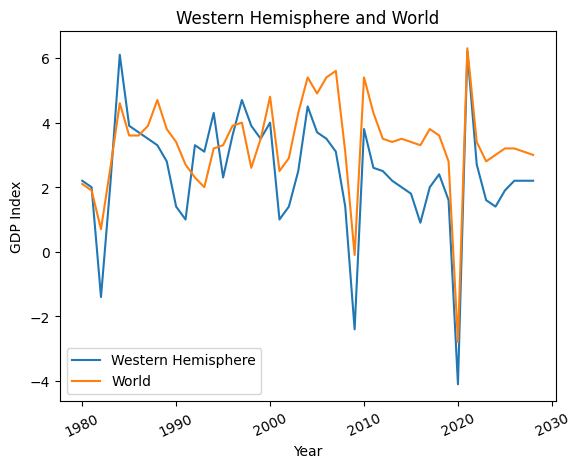

In [72]:
#Western Hemisphere and World
sns.lineplot(x = "Year", y = "Western Hemisphere (Region)", data = new_df, label = "Western Hemisphere")
sns.lineplot(x = "Year", y = "World", data = new_df, label = "World")
plt.ylabel("GDP Index")
plt.xticks(rotation = 25)
plt.title('Western Hemisphere and World')

Text(0.5, 1.0, 'Europe and World')

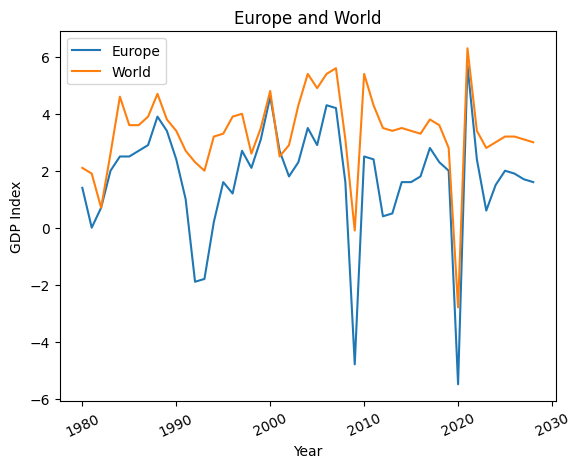

In [73]:
#Europe and World
sns.lineplot(x = "Year", y = "Europe", data = new_df, label = "Europe")
sns.lineplot(x = "Year", y = "World", data = new_df, label = "World")
plt.ylabel("GDP Index")
plt.xticks(rotation = 25)
plt.title('Europe and World')

Text(0.5, 1.0, 'Europe and World')

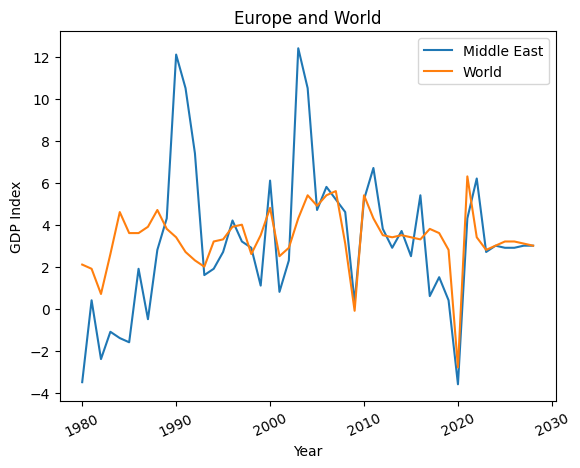

In [74]:
#Middle East and World
sns.lineplot(x = "Year", y = "Middle East (Region)", data = new_df, label = "Middle East")
sns.lineplot(x = "Year", y = "World", data = new_df, label = "World")
plt.ylabel("GDP Index")
plt.xticks(rotation = 25)
plt.title('Europe and World')

Text(0.5, 1.0, 'Europe and World')

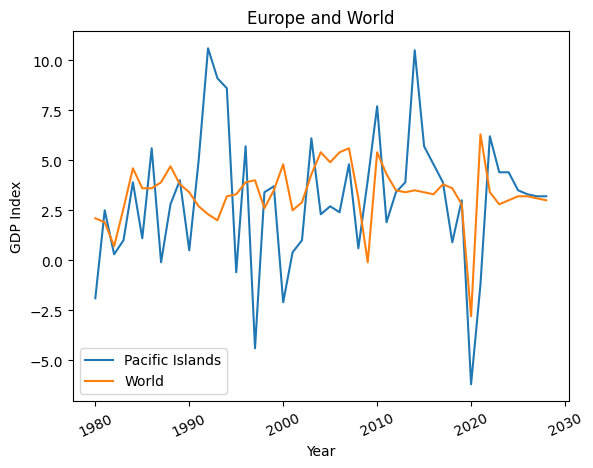

In [75]:
#Pacific Islands and World
sns.lineplot(x = "Year", y = "Pacific Islands ", data = new_df, label = "Pacific Islands")
sns.lineplot(x = "Year", y = "World", data = new_df, label = "World")
plt.ylabel("GDP Index")
plt.xticks(rotation = 25)
plt.title('Europe and World')


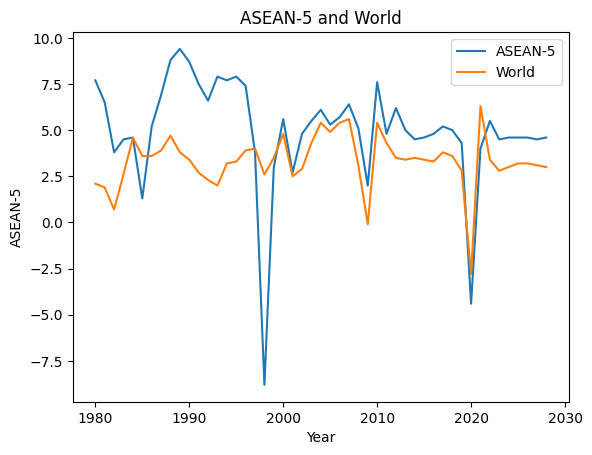

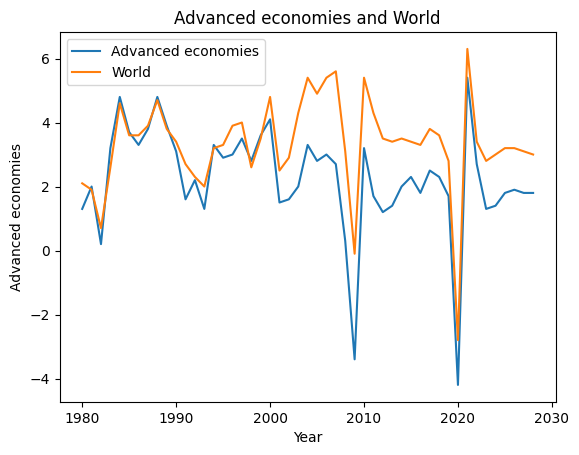

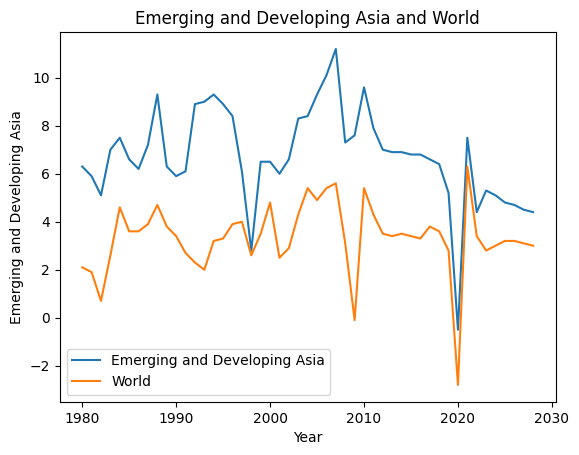

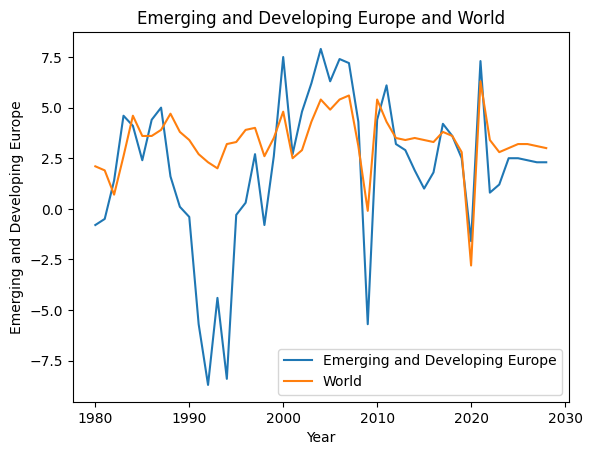

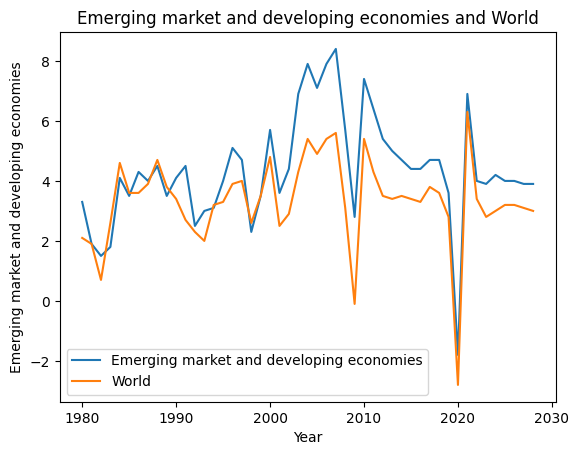

...

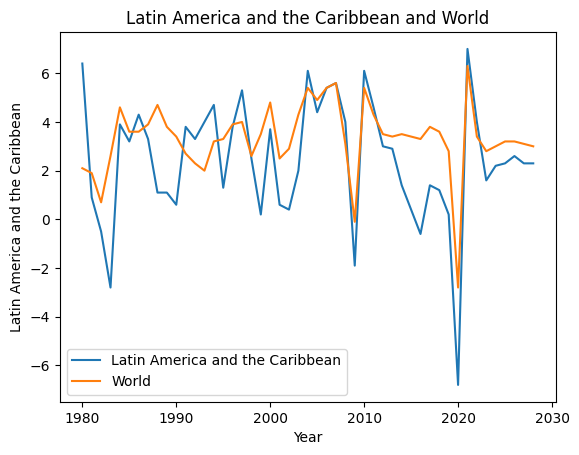

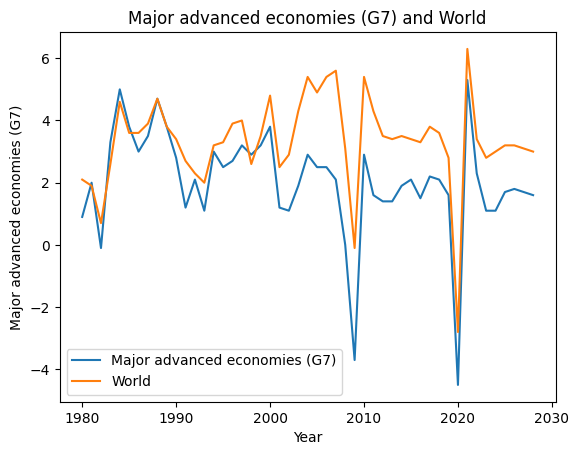

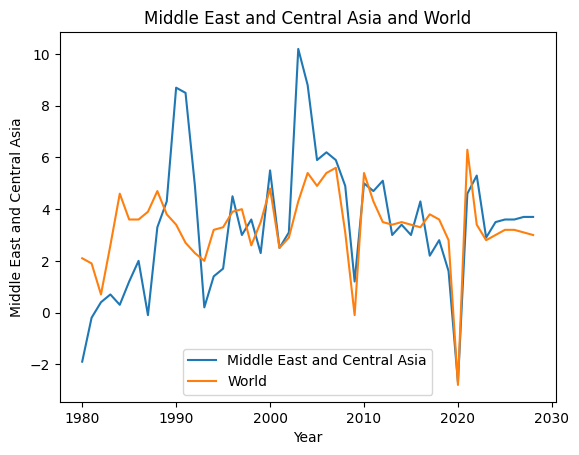

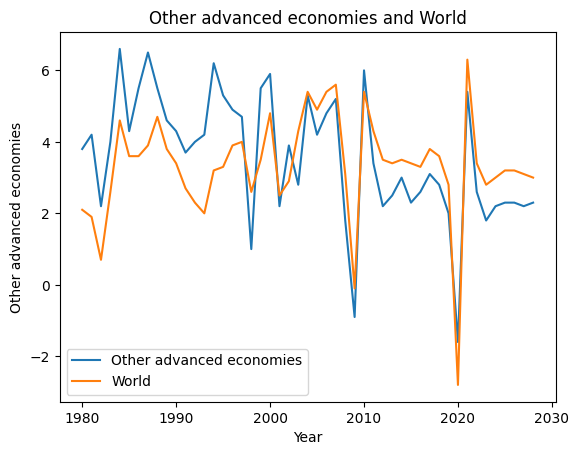

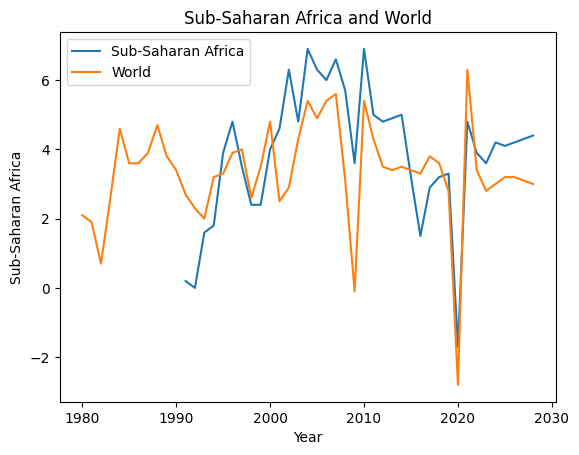

In [76]:
#Economic Groups and World
economic_groups_names = new_df.columns[-14:-2]
year = new_df['Year']
for i in range(len(economic_groups_names)):
    plt.figure()
    sns.lineplot(x = 'Year', y = economic_groups_names[i], data = new_df, label = economic_groups_names[i])
    sns.lineplot(x = 'Year', y = 'World', data = new_df,label = 'World')
    plt.title(f'{economic_groups_names[i]} and World')
    # Show/save figure as desired.
    plt.show()

Esses plots já permitem alguns insights. Também é útil comparar as séries temporais entre regiões e grupos econômicos de mesmo nome.

Text(0.5, 1.0, 'Middle East (Region), Central Asia and the Caucasus and Middle East and Central Asia Group')

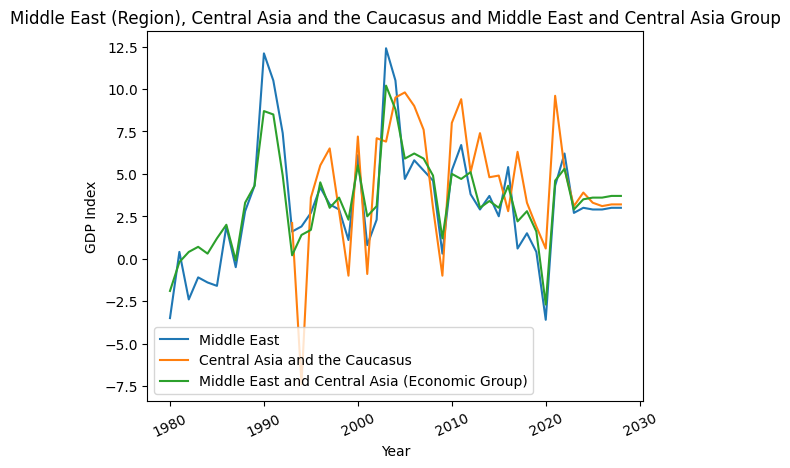

In [77]:
#Middle East, Central Asia and respective economic group
sns.lineplot(x = "Year", y = "Middle East (Region)", data = new_df, label = "Middle East")
sns.lineplot(x = "Year", y = "Central Asia and the Caucasus", data = new_df,label = "Central Asia and the Caucasus")
sns.lineplot(x = "Year", y = "Middle East and Central Asia", data = new_df,label = "Middle East and Central Asia (Economic Group)")
plt.ylabel("GDP Index")
plt.xticks(rotation = 25)
plt.title('Middle East (Region), Central Asia and the Caucasus and Middle East and Central Asia Group')

Text(0.5, 1.0, 'Sub-Saharan Africa (Region and Economic Grouo)')

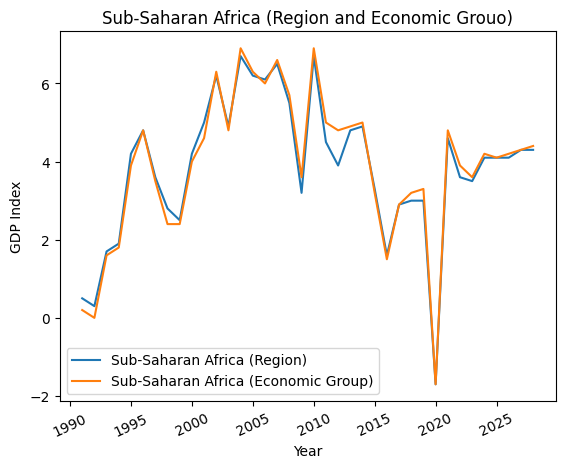

In [78]:
#Sub-Saharan Africa (Group and Region)
sns.lineplot(x = "Year", y = "Sub-Saharan Africa (Region) ", data = new_df, label = "Sub-Saharan Africa (Region)")
sns.lineplot(x = "Year", y = "Sub-Saharan Africa", data = new_df,label = "Sub-Saharan Africa (Economic Group)")
plt.ylabel("GDP Index")
plt.xticks(rotation = 25)
plt.title('Sub-Saharan Africa (Region and Economic Grouo)')

### Conclusões

####  Regiões 
- Em todos os casos, é possível identificar as crises de 2010 (recessão) e 2020 (pandemia). Contudo, alguns casos com Europa e Ásia apresentam grandes flutuações negativas em pouco mais de 1990 e anterior a 2010.
- Regiões como Oriente Médio (*Middle East*) e Oceania (*Pacific Islands*) apresentam alto crescimento e queda nesse mesmo período, que é compartilhado pelos grupos econômicos *ASEAN-5*, *Middle East and Central Asia* e de modo mais contido pelo grupo *European Union*. Isso não foi sentido pelo Hemisfério Ocidental (*Western Hemisphere*), e consequentemente pelas Américas e Caribe.
- *Asia Central e Caucasus* tem o comportamento mais volátil das quatro regiões, mas em certa medida acompanhou a mesma tendência do continente como um todo
- Africa Subsariana apresenta flutuações diferentes da África do Norte (*North Africa*), mas apresenta a mesma tendência, então é possível supor que também apresenta esse comportamento para os anos em que não há dados disponíveis.

#### Regiões x mundial
- O Hemisfério Ocidental apresenta um comportamento muito semelhante ao da variação mundial do GPD, seguido pela Europa. Já o Oriente Médio tem comportamento que difere consideravelmente até a crise de 2010, ainda apresentando diferenças após. Esse comportamento também é visto na Oceania.

#### Grupos econômicos x mundial
- A maioria dos grupos econômicos apresenta comportamento semelhante ao da variação mundial de GPD, exceto pelo grupo *Emerging and Developing Europe* no período de 1990 a 2000 e do grupo Middle East and Central Asia de 1990 até 2010. Dado o comportamento dos grupos *Euro Area* e África Subsariana serem semelhantes ao do índice mundial geral, é possível inferir que os dados faltantes seguem a mesma linha, o que auxilia em seu preenchimento.
#### Regiões e grupos
- A região do Oriente Médio segue a tendência do seu respectivo grupo, o que pode servir para guiar o preenchimento dos dados de países com valores faltantes. A região da Ásia Central apresenta uma queda abrupta no índice, mas caso siga a tendência do grupo essa queda vem de um aumento que tanto a região do Oriente Médio como o grupo econômico passaram, dando um direcionamento no preenchimento dos dados faltantes dessa região. 


## 2.3. Análise de Séries Temporais

Dada a quantidade de países, fica impraticável analisar cada série temporal isolada, portanto serão analisadas as séries temporais que mais generalizam o comportamento da variação do índice GDP, no caso as regiões *Western Hemisphere*, *Europe*, *Pacific Island*s, os grupos *Emerging Developing Economies*, *Major* e *Other Advanced Economies* e *World*.

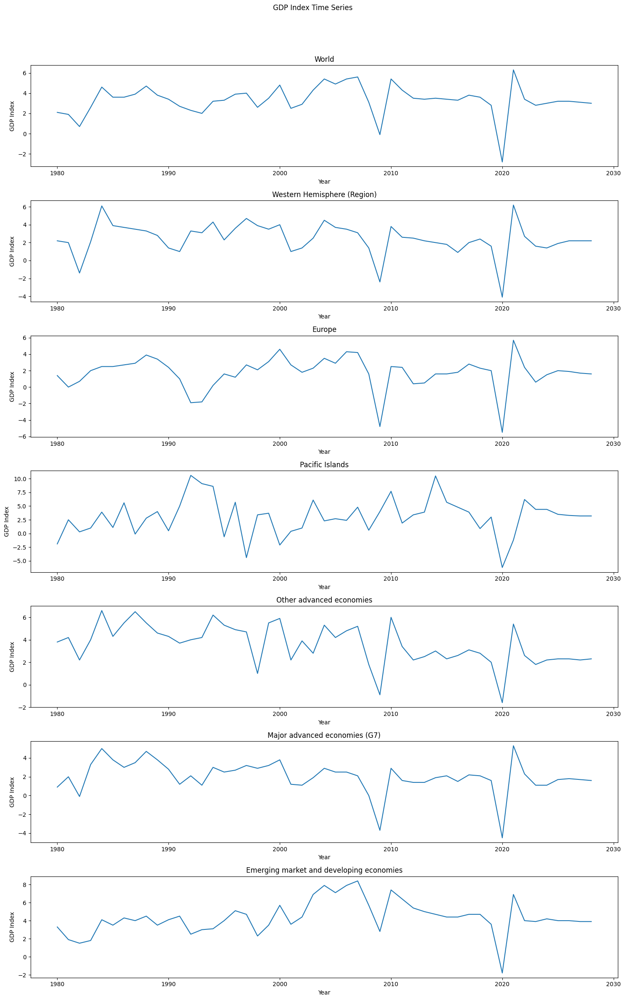

In [234]:
fig, ax = plt.subplots(nrows = 7,figsize=(15,25))
fig.suptitle('GDP Index Time Series')

sns.lineplot(ax = ax[0], x = "Year", y = "World", data = new_df)
ax[0].set_title('World')
ax[0].set_ylabel('GDP Index')
sns.lineplot(ax = ax[1], x = "Year", y = "Western Hemisphere (Region)", data = new_df)
ax[1].set_title('Western Hemisphere (Region)')
ax[1].set_ylabel('GDP Index')
sns.lineplot(ax = ax[2], x = "Year", y = "Europe", data = new_df)
ax[2].set_title('Europe')
ax[2].set_ylabel('GDP Index')
sns.lineplot(ax = ax[3], x = "Year", y = "Pacific Islands ", data = new_df)
ax[3].set_title('Pacific Islands')
ax[3].set_ylabel('GDP Index')
sns.lineplot(ax = ax[4], x = "Year", y = "Other advanced economies", data = new_df)
ax[4].set_title('Other advanced economies')
ax[4].set_ylabel('GDP Index')
sns.lineplot(ax = ax[5], x = "Year", y = "Major advanced economies (G7)", data = new_df)
ax[5].set_title('Major advanced economies (G7)')
ax[5].set_ylabel('GDP Index')
sns.lineplot(ax = ax[6], x = "Year", y = "Emerging market and developing economies", data = new_df)
ax[6].set_title('Emerging market and developing economies')
ax[6].set_ylabel('GDP Index')



fig.tight_layout(rect=[0, 0.03, 1, 0.95])

As séries têm comportamento semelhante. De início, é bom analisar se as séries possuem algum grau de correlação entre si, o que pode indicar influência de uma série sobre a outra

/home/lcscrv/projetos/indicium/kedro/kedro_time_series_project/venv/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


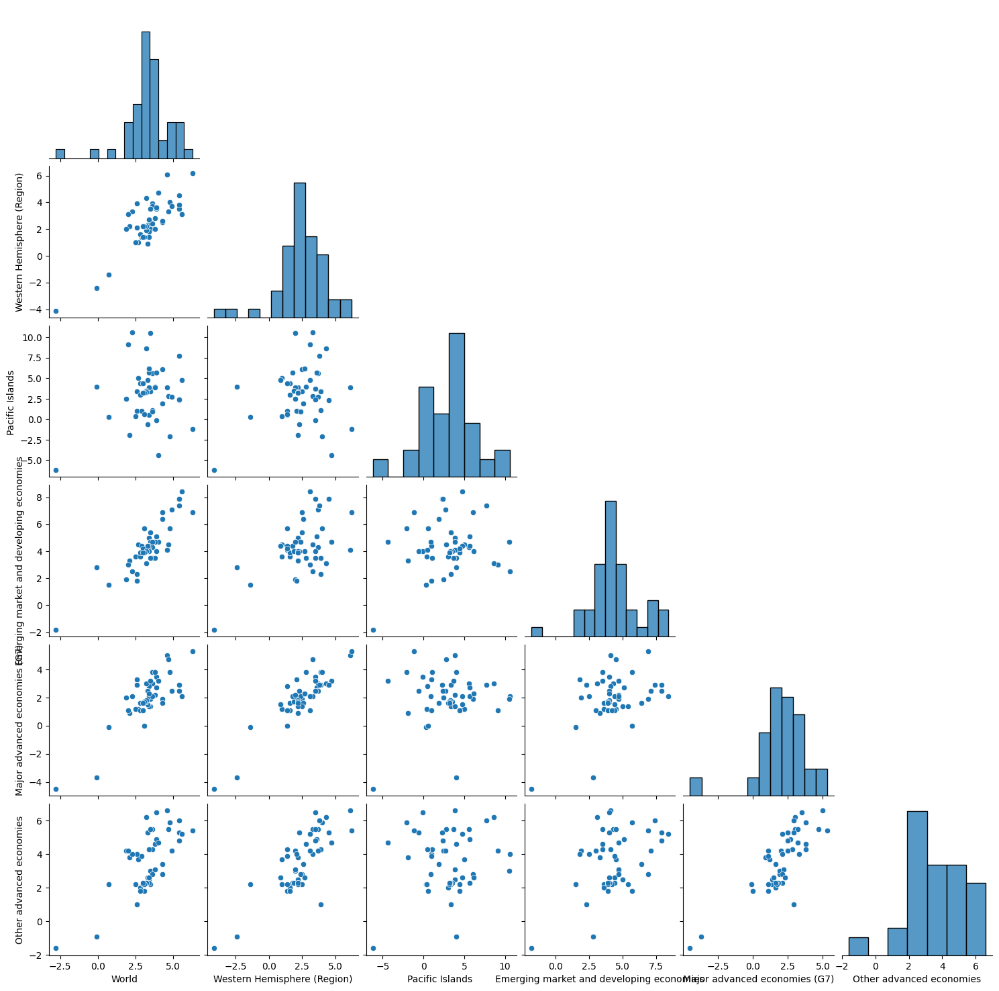

In [80]:
sns.pairplot(new_df[["World","Western Hemisphere (Region)","Pacific Islands ",'Emerging market and developing economies','Major advanced economies (G7)','Other advanced economies']],corner=True)

Com exceção de *Pacific Islands*, os outros grupos apresentação um grau de correlação linear com World. Um grau de correlação também é identificado entre os grupos *Major Advanced Economie*s, *Western Hemisphere* e *Other Advanced Economies*, que também apresentam séries temporais semelhantes. Pode-se inferir que esses grupos tem comportamento econômico semelhante no que diz respeito ao índice GDP.

Partindo então para uma análise de autocorrelação, ou seja, se os dados passados têm influência nos dados futuros. Isso está apresentado nos plots do lado direito.

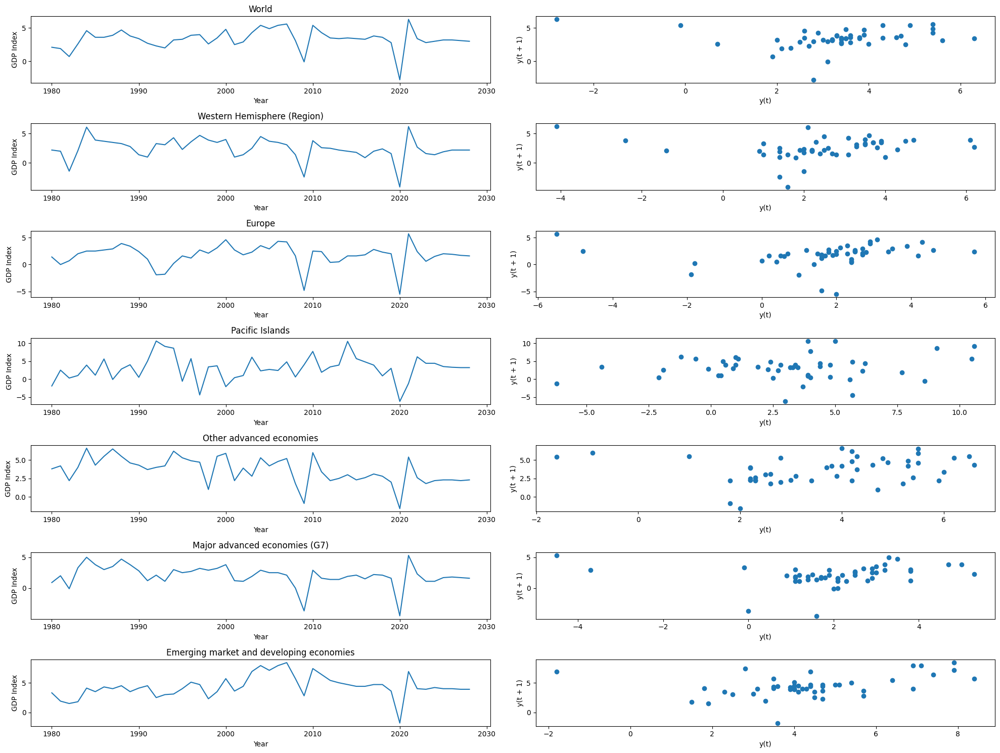

In [81]:
#Lag Plots
fig,ax = plt.subplots(nrows = 7,ncols = 2,figsize = (20,15))

sns.lineplot(ax = ax[0][0], x = "Year", y = "World", data = new_df)
pd.plotting.lag_plot(new_df['World'],lag=1,ax= ax[0][1])

ax[0][0].set_title('World')
ax[0][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[1][0], x = "Year", y = "Western Hemisphere (Region)", data = new_df)
pd.plotting.lag_plot(new_df['Western Hemisphere (Region)'],lag=1,ax= ax[1][1])

ax[1][0].set_title('Western Hemisphere (Region)')
ax[1][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[2][0], x = "Year", y = "Europe", data = new_df)
pd.plotting.lag_plot(new_df['Europe'],lag=1,ax= ax[2][1])

ax[2][0].set_title('Europe')
ax[2][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[3][0], x = "Year", y = "Pacific Islands ", data = new_df)
pd.plotting.lag_plot(new_df['Pacific Islands '],lag=1,ax= ax[3][1])

ax[3][0].set_title('Pacific Islands')
ax[3][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[4][0], x = "Year", y = "Other advanced economies", data = new_df)
pd.plotting.lag_plot(new_df['Other advanced economies'],lag=1,ax= ax[4][1])

ax[4][0].set_title('Other advanced economies')
ax[4][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[5][0], x = "Year", y = "Major advanced economies (G7)", data = new_df)
pd.plotting.lag_plot(new_df['Major advanced economies (G7)'],lag=1,ax= ax[5][1])

ax[5][0].set_title('Major advanced economies (G7)')
ax[5][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[6][0], x = "Year", y = "Emerging market and developing economies", data = new_df)
pd.plotting.lag_plot(new_df['Emerging market and developing economies'],lag=1,ax= ax[6][1])

ax[6][0].set_title('Emerging market and developing economies')
ax[6][0].set_ylabel('GDP Index')

plt.tight_layout()
plt.show()

No geral, os dados apresentam um comportamento aleatório, o que é esperado, considerando que o GDP (ou PIB) de um país é influenciado principalmente pelo consumo familiar, que influencia outros segmentos como investimentos estatais, ampliamento de operações, geração de empregos e etc. Como tudo isso não está protegido de contratempos como pressões inflacionárias, há uma alta imprevisibilidade na variação do GDP de um ano para outro, ainda que também seja possível observar uma tendência linear de crescimento na maioria dos casos.

No contexto de *forecasting*, esse comportamento sem tendências, sazonalidades ou ciclos detectáveis indica que essas séries temporais são **estacionárias**. 

"*Uma série temporal é estacionária quando suas características estatísticas (média, 
variância, autocorrelação, …) são constantes ao longo do tempo. É uma série que se 
desenvolve aleatoriamente no tempo, em torno de uma média constante, refletindo alguma 
forma de equilíbrio estatístico estável (i.e. as leis de probabilidade que atuam no processo 
não mudam com o tempo)*" - [Conceitos Básicos de Séries Temporais
para Modelagem Macroeconômica](http://www.icad.puc-rio.br/cfeijo/pdf/revis%C3%A3o%20b%C3%A1sica%20s%C3%A9ries%20temporais_material%20de%20apoio_curso%20teoria%20macroeconomica_PPGE%20UFF.pdf)


Caso a série não seja estacionária a previsão para o futuro não será eficiente, portanto é necessário detectar se a série é ou não estacionária para aplicar métodos que tornem aquela série estacionária, como a diferenciação. Também é útil analisar a média das séries temporais por meio da aplicação de média móvel (*rolling average*).

In [82]:
series = ["World","Western Hemisphere (Region)","Pacific Islands ",'Emerging market and developing economies','Major advanced economies (G7)','Other advanced economies','Europe']
MA_df = new_df.copy()
MA_df = MA_df.set_index('Year')
MA_df = MA_df[series]

for country in series:
    MA_df[f'MA_5_{country}'] = MA_df[country].rolling(window=5).mean()
    MA_df[f'MA_10_{country}'] = MA_df[country].rolling(window=10).mean()
    MA_df[f'MA_25_{country}'] = MA_df[country].rolling(window=25).mean()

MA_df


,World,Western Hemisphere (Region),Pacific Islands,Emerging market and developing economies,Major advanced economies (G7),Other advanced economies,Europe,MA_5_World,MA_10_World,MA_25_World,...,MA_25_Emerging market and developing economies,MA_5_Major advanced economies (G7),MA_10_Major advanced economies (G7),MA_25_Major advanced economies (G7),MA_5_Other advanced economies,MA_10_Other advanced economies,MA_25_Other advanced economies,MA_5_Europe,MA_10_Europe,MA_25_Europe
Year,,,,,,,,,,,,,,,,,,,,,
1980,2.1,2.2,-1.9,3.3,0.9,3.8,1.4,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1981,1.9,2.0,2.5,1.9,2.0,4.2,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1982,0.7,-1.4,0.3,1.5,-0.1,2.2,0.7,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1983,2.6,2.1,1.0,1.8,3.3,4.0,2.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984,4.6,6.1,3.9,4.1,5.0,6.6,2.5,2.38,NaN,NaN,...,NaN,2.22,NaN,NaN,4.16,NaN,NaN,1.32,NaN,NaN
1985,3.6,3.9,1.1,3.5,3.8,4.3,2.5,2.68,NaN,NaN,...,NaN,2.80,NaN,NaN,4.26,NaN,NaN,1.54,NaN,NaN
1986,3.6,3.7,5.6,4.3,3.0,5.5,2.7,3.02,NaN,NaN,...,NaN,3.00,NaN,NaN,4.52,NaN,NaN,2.08,NaN,NaN
1987,3.9,3.5,-0.1,4.0,3.5,6.5,2.9,3.66,NaN,NaN,...,NaN,3.72,NaN,NaN,5.38,NaN,NaN,2.52,NaN,NaN
1988,4.7,3.3,2.8,4.5,4.7,5.5,3.9,4.08,NaN,NaN,...,NaN,4.00,NaN,NaN,5.68,NaN,NaN,2.90,NaN,NaN


Text(0, 0.5, 'GDP Index')

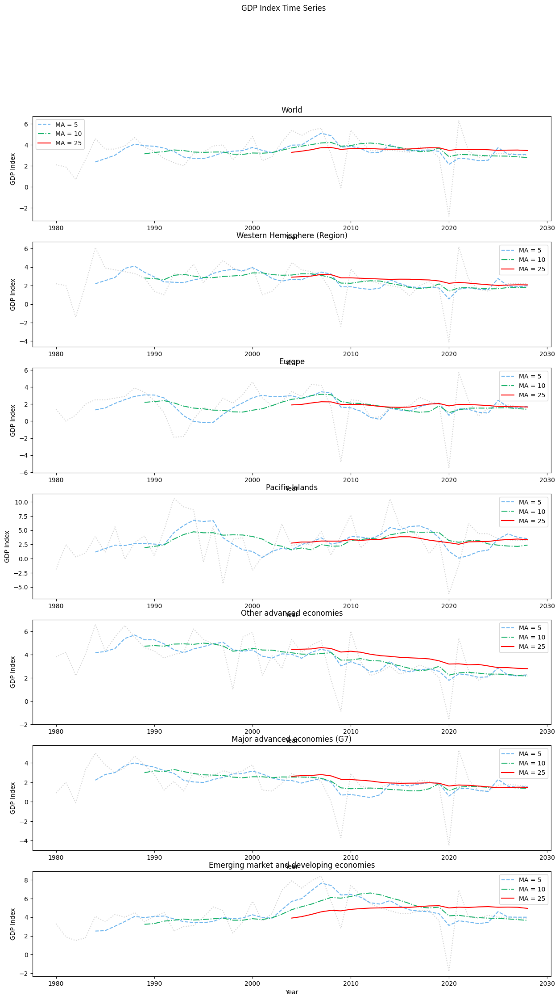

In [83]:
fig, ax = plt.subplots(nrows = 7,figsize=(15,25))
fig.suptitle('GDP Index Time Series')

sns.lineplot(ax = ax[0], x = MA_df.index, y = "World", data = MA_df,linestyle = 'dotted',color = '#d3d3d3')
sns.lineplot(ax = ax[0], x = MA_df.index, y = "MA_5_World", data = MA_df, label = 'MA = 5', linestyle = 'dashed', color = '#6CB4EE')
sns.lineplot(ax = ax[0], x = MA_df.index, y = "MA_10_World", data = MA_df, label = 'MA = 10',linestyle = 'dashdot',color = '#17B169')
sns.lineplot(ax = ax[0], x = MA_df.index, y = "MA_25_World", data = MA_df, label = 'MA = 25',color = 'red')

ax[0].set_title('World')
ax[0].set_ylabel('GDP Index')
sns.lineplot(ax = ax[1], x = MA_df.index, y = "Western Hemisphere (Region)", data = MA_df,linestyle = 'dotted',color = '#d3d3d3')
sns.lineplot(ax = ax[1], x = MA_df.index, y = "MA_5_Western Hemisphere (Region)", data = MA_df, label = 'MA = 5', linestyle = 'dashed', color = '#6CB4EE')
sns.lineplot(ax = ax[1], x = MA_df.index, y = "MA_10_Western Hemisphere (Region)", data = MA_df, label = 'MA = 10',linestyle = 'dashdot',color = '#17B169')
sns.lineplot(ax = ax[1], x = MA_df.index, y = "MA_25_Western Hemisphere (Region)", data = MA_df, label = 'MA = 25',color = 'red')

ax[1].set_title('Western Hemisphere (Region)')
ax[1].set_ylabel('GDP Index')
sns.lineplot(ax = ax[2], x = MA_df.index, y = "Europe", data = MA_df,linestyle = 'dotted',color = '#d3d3d3')
sns.lineplot(ax = ax[2], x = MA_df.index, y = "MA_5_Europe", data = MA_df, label = 'MA = 5', linestyle = 'dashed', color = '#6CB4EE')
sns.lineplot(ax = ax[2], x = MA_df.index, y = "MA_10_Europe", data = MA_df, label = 'MA = 10',linestyle = 'dashdot',color = '#17B169')
sns.lineplot(ax = ax[2], x = MA_df.index, y = "MA_25_Europe", data = MA_df, label = 'MA = 25',color = 'red')

ax[2].set_title('Europe')
ax[2].set_ylabel('GDP Index')
sns.lineplot(ax = ax[3], x = MA_df.index, y = "Pacific Islands ", data = MA_df,linestyle = 'dotted',color = '#d3d3d3')
sns.lineplot(ax = ax[3], x = MA_df.index, y = "MA_5_Pacific Islands ", data = MA_df, label = 'MA = 5', linestyle = 'dashed', color = '#6CB4EE')
sns.lineplot(ax = ax[3], x = MA_df.index, y = "MA_10_Pacific Islands ", data = MA_df, label = 'MA = 10',linestyle = 'dashdot',color = '#17B169')
sns.lineplot(ax = ax[3], x = MA_df.index, y = "MA_25_Pacific Islands ", data = MA_df, label = 'MA = 25',color = 'red')

ax[3].set_title('Pacific Islands')
ax[3].set_ylabel('GDP Index')
sns.lineplot(ax = ax[4], x = MA_df.index, y = "Other advanced economies", data = MA_df,linestyle = 'dotted',color = '#d3d3d3')
sns.lineplot(ax = ax[4], x = MA_df.index, y = "MA_5_Other advanced economies", data = MA_df, label = 'MA = 5', linestyle = 'dashed', color = '#6CB4EE')
sns.lineplot(ax = ax[4], x = MA_df.index, y = "MA_10_Other advanced economies", data = MA_df, label = 'MA = 10',linestyle = 'dashdot',color = '#17B169')
sns.lineplot(ax = ax[4], x = MA_df.index, y = "MA_25_Other advanced economies", data = MA_df, label = 'MA = 25',color = 'red')

ax[4].set_title('Other advanced economies')
ax[4].set_ylabel('GDP Index')
sns.lineplot(ax = ax[5], x = MA_df.index, y = "Major advanced economies (G7)", data = MA_df,linestyle = 'dotted',color = '#d3d3d3')
sns.lineplot(ax = ax[5], x = MA_df.index, y = "MA_5_Major advanced economies (G7)", data = MA_df, label = 'MA = 5', linestyle = 'dashed', color = '#6CB4EE')
sns.lineplot(ax = ax[5], x = MA_df.index, y = "MA_10_Major advanced economies (G7)", data = MA_df, label = 'MA = 10',linestyle = 'dashdot',color = '#17B169')
sns.lineplot(ax = ax[5], x = MA_df.index, y = "MA_25_Major advanced economies (G7)", data = MA_df, label = 'MA = 25',color = 'red')

ax[5].set_title('Major advanced economies (G7)')
ax[5].set_ylabel('GDP Index')
sns.lineplot(ax = ax[6], x = MA_df.index, y = "Emerging market and developing economies", data = MA_df,linestyle = 'dotted',color = '#d3d3d3')
sns.lineplot(ax = ax[6], x = MA_df.index, y = "MA_5_Emerging market and developing economies", data = MA_df, label = 'MA = 5', linestyle = 'dashed', color = '#6CB4EE')
sns.lineplot(ax = ax[6], x = MA_df.index, y = "MA_10_Emerging market and developing economies", data = MA_df, label = 'MA = 10',linestyle = 'dashdot',color = '#17B169')
sns.lineplot(ax = ax[6], x = MA_df.index, y = "MA_25_Emerging market and developing economies", data = MA_df, label = 'MA = 25',color = 'red')

ax[6].set_title('Emerging market and developing economies')
ax[6].set_ylabel('GDP Index')

Os *lags* foram definidos como sendo 5, 10 e 25 para ver o quanto o ruído diminui conforme o atraso em relação à série original aumenta. De acordo com os gráficos, a maioria possui uma média móvel estável, com exceção do grupo Emerging market and developing economies, que apresenta uma certa tendência crescente,e os grupos Other advanced e Major advanced economies, que apresentam uma tendência linear descrescente. 

No geral, as médias indicam séries temporais estacionárias. Também é útil explorar os Plots de Autocorrelação (*Auto Correlation Function* ou ACF) e Auto correlação parcial (*Partial Auto Correlation Function* ou PACF). 

Uma ACF mede e plota a correlação média entre os pontos de dados em uma série temporal e os valores anteriores dessa série medidos para diferentes defasagens (*lags*).
A PACF é similar com exceção de que cada correlação parcial controla qualquer correlação entre observações de um comprimento de defasagem mais curto.

Em uma ACF tem-se a correlação direta e indireta e em uma PACF apenas a correlação direta. Por exemplo, a aplicação de uma ACF permite observar a correlação direta do ano de 1980 e 1982 e também a correlação indireta que 1980 teve em 1981 que também teve em 1982.
Num plot de ACF e PACF há a indicação do intervalo de confiança. O intervalo de confiança por padrão é 95%, mostrado por uma marca azul, sendo um indicador da signficância estatística, o que quer dizer que quaisquer observações que estão fora da marca são consideradas estatisticamente correlacionadas (não zero) e dentro são consideradas estatisticamente zero.

Um decaímento rápido para o zero num plot de ACF é um indicativo de que uma série temporal é estacionária. Analisando então os plots a seguir.

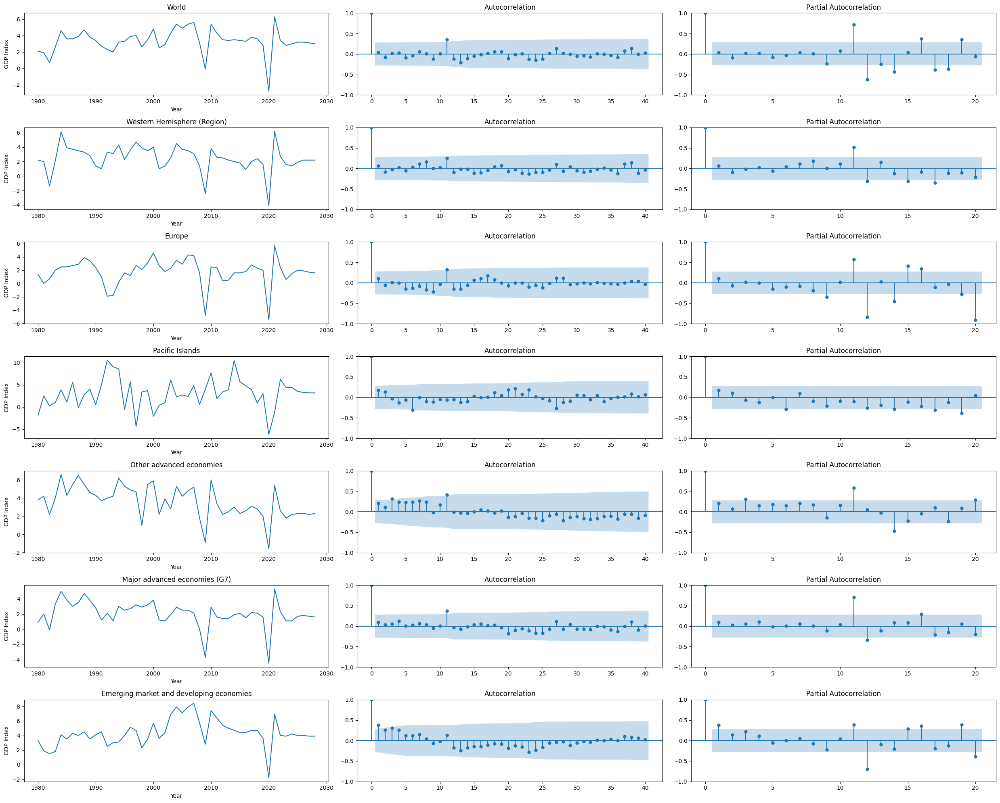

In [84]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
fig,ax = plt.subplots(nrows = 7, ncols = 3,figsize = (25,20))
sns.lineplot(ax = ax[0][0], x = "Year", y = "World", data = new_df)
plot_acf(new_df['World'], lags=40, ax = ax[0][1])
plot_pacf(new_df['World'], lags = 20, method = "ols", ax = ax[0][2])

ax[0][0].set_title('World')
ax[0][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[1][0], x = "Year", y = "Western Hemisphere (Region)", data = new_df)
plot_acf(new_df['Western Hemisphere (Region)'], lags=40, ax = ax[1][1])
plot_pacf(new_df['Western Hemisphere (Region)'], lags = 20, method = "ols", ax = ax[1][2])

ax[1][0].set_title('Western Hemisphere (Region)')
ax[1][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[2][0], x = "Year", y = "Europe", data = new_df)
plot_acf(new_df['Europe'], lags=40, ax = ax[2][1])
plot_pacf(new_df['Europe'], lags = 20, method = "ols", ax = ax[2][2])

ax[2][0].set_title('Europe')
ax[2][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[3][0], x = "Year", y = "Pacific Islands ", data = new_df)
plot_acf(new_df['Pacific Islands '], lags=40, ax = ax[3][1])
plot_pacf(new_df['Pacific Islands '], lags = 20, method = "ols", ax = ax[3][2])

ax[3][0].set_title('Pacific Islands')
ax[3][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[4][0], x = "Year", y = "Other advanced economies", data = new_df)
plot_acf(new_df['Other advanced economies'], lags=40, ax = ax[4][1])
plot_pacf(new_df['Other advanced economies'], lags = 20, method = "ols", ax = ax[4][2])

ax[4][0].set_title('Other advanced economies')
ax[4][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[5][0], x = "Year", y = "Major advanced economies (G7)", data = new_df)
plot_acf(new_df['Major advanced economies (G7)'], lags=40, ax = ax[5][1])
plot_pacf(new_df['Major advanced economies (G7)'], lags = 20, method = "ols", ax = ax[5][2])

ax[5][0].set_title('Major advanced economies (G7)')
ax[5][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[6][0], x = "Year", y = "Emerging market and developing economies", data = new_df)
plot_acf(new_df['Emerging market and developing economies'], lags=40, ax = ax[6][1])
plot_pacf(new_df['Emerging market and developing economies'], lags = 20, method = "ols", ax = ax[6][2])

ax[6][0].set_title('Emerging market and developing economies')
ax[6][0].set_ylabel('GDP Index')

plt.tight_layout()
plt.show()

Os plots ACF e PACF dão um forte indicativo de séries temporais estacionárias, com as PACFs indicando melhor a presença de correlações diretas. 
Para terminar a análise do tipo de série temporal serão aplicados testes estatísticos, ou testes de raiz unitária, que dão respostas mais significativas das características das séries.

Uma **raiz unitária** é uma tendência estocástica em uma série de tempo, muitas vezes denominada de “passeio aleatório”;
    Esse é o nome dado (raiz unitária) ao padrão aleatório, contido numa série temporal, se esta mostrar um padrão aleatório e imprevisível. Ou seja, é o movimento aleatório e imprevisível em torno da tendência da série.
    Ou seja, quando a hipótese de raiz unitária for verdadeira para uma série, os choques aleatórios que ela sofre geram na mesma um efeito permanente.
    
Quanto menor for o passeio aleatório (aleatoriedade) em torno da série maior será a estabilidade ou previsibilidade e assim a série será denominada “estacionária” ou estável e sem efeito de raiz unitária.

A aplicação de testes de raiz unitária servem para averiguar se uma série é estável (Estacionária e sem presença do efeito de raiz unitária) ou se essa série é não estável (Não-estacionária ou instável e com presença do efeito raiz unitária). 
As hipóteses para a maioria dos testes de significância para a raiz unitária são:

 - H0: a série é não estacionária, ou seja, a série tem o efeito raiz unitária.
 - Ha: a série é estacionária, ou seja, a série não tem o efeito raiz unitária.

Existem diversos testes de raiz unitária. Os testes aplicados aqui são o Teste ADF (Augmented Dickey- Fuller test) de Raiz Unitária e o teste KPSS de Denis Kwiatkowski, Peter C.B Phillips, Peter Schmidt e Yongcheol Shin, das iniciais dos nomes vem a sigla pela qual é conhecido o teste.

Para o teste ADF, caso o  p-valor seja maior que o nível de significância de 5% (padrão para os testes de hipóteses) então deve-se aceitar a hipótese inicial H0 e concluir que a série é **não estacionária**, isto é, tem raiz unitária. No caso do teste KPSS é o oposto, ou seja, se o p-valor ultrapassar o nível de significância, então a série é **estacionária**. 
Esses testes não são intercambiáveis, e é ideal que sejam aplicados em conjunto para maior certeza dos resultados.

Dito isso, abaixo estão as aplicações dos testes.

In [85]:
from statsmodels.tsa.stattools import adfuller
X = new_df['World'].to_numpy()
result = adfuller(X,autolag= 'AIC')

print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Number of lags:%f' % result[2])
print('Critical Values:')
for key, value in result[4].items():
 print('\t%s: %.3f' % (key, value))

ADF Statistic: -1.236563
p-value: 0.657673
Number of lags:11.000000
Critical Values:
	1%: -3.621
	5%: -2.944
	10%: -2.610


In [86]:
from statsmodels.tsa.stattools import kpss
def kpss_test(series, **kw):    
    statistic, p_value, n_lags, critical_values = kpss(series, **kw, regression='ct')
    # Format Output
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'num lags: {n_lags}')
    print('Critial Values:')
    for key, value in critical_values.items():
        print(f'   {key} : {value}')
    print(f'Result: The series is {"not " if p_value < 0.05 else ""}stationary')
    
Y = new_df['Other advanced economies'].to_numpy()
kpss_test(Y)

KPSS Statistic: 0.11576825219223497
p-value: 0.1
num lags: 8
Critial Values:
   10% : 0.119
   5% : 0.146
   2.5% : 0.176
   1% : 0.216
Result: The series is stationary


/tmp/ipykernel_1302/2828160267.py:3: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  statistic, p_value, n_lags, critical_values = kpss(series, **kw, regression='ct')


In [87]:
ADF_dict = {'Series':[],'ADF Statistic':[],'p-value':[],'Critical Values (1%)':[],'Critical Values (5%)':[],'Critical Values (10%)':[],'Is Stationary':[]}

for country in series:
    X = new_df[country].to_numpy()
    result = adfuller(X,autolag= 'AIC')
    ADF_dict['Series'].append(country)
    ADF_dict['ADF Statistic'].append(result[0])
    ADF_dict['p-value'].append(result[1])
    ADF_dict['Critical Values (1%)'].append(result[4]['1%'])
    ADF_dict['Critical Values (5%)'].append(result[4]['5%'])
    ADF_dict['Critical Values (10%)'].append(result[4]['10%'])
    if result[1] > 0.05: ADF_dict['Is Stationary'].append('NO')
    else: ADF_dict['Is Stationary'].append('YES')
print(ADF_dict)  


{'Series': ['World', 'Western Hemisphere (Region)', 'Pacific Islands ', 'Emerging market and developing economies', 'Major advanced economies (G7)', 'Other advanced economies', 'Europe'], 'ADF Statistic': [-1.2365630614723608, -6.383728484162409, -5.860514914680945, -4.559399663161947, -6.170543544915754, -0.19294001972115873, -2.8078034025319143], 'p-value': [0.6576728443574826, 2.1901338381978998e-08, 3.4191419706471824e-07, 0.00015335484916880658, 6.822231229458298e-08, 0.9393579328089274, 0.05716772411467469], 'Critical Values (1%)': [-3.6209175221605827, -3.5745892596209488, -3.5745892596209488, -3.5745892596209488, -3.5745892596209488, -3.6155091011809297, -3.6209175221605827], 'Critical Values (5%)': [-2.9435394610388332, -2.9239543084490744, -2.9239543084490744, -2.9239543084490744, -2.9239543084490744, -2.941262357486514, -2.9435394610388332], 'Critical Values (10%)': [-2.6104002410518627, -2.6000391840277777, -2.6000391840277777, -2.6000391840277777, -2.6000391840277777, -2.6

In [88]:
ADF_df = pd.DataFrame(ADF_dict)
ADF_df

,Series,ADF Statistic,p-value,Critical Values (1%),Critical Values (5%),Critical Values (10%),Is Stationary
0,World,-1.236563,6.576728e-01,-3.620918,-2.943539,-2.610400,NO
1,Western Hemisphere (Region),-6.383728,2.190134e-08,-3.574589,-2.923954,-2.600039,YES
2,Pacific Islands,-5.860515,3.419142e-07,-3.574589,-2.923954,-2.600039,YES
3,Emerging market and developing economies,-4.559400,1.533548e-04,-3.574589,-2.923954,-2.600039,YES
4,Major advanced economies (G7),-6.170544,6.822231e-08,-3.574589,-2.923954,-2.600039,YES
5,Other advanced economies,-0.192940,9.393579e-01,-3.615509,-2.941262,-2.609200,NO
6,Europe,-2.807803,5.716772e-02,-3.620918,-2.943539,-2.610400,NO


Para melhor visualização, foram aplicados ambos os testes num dataframe contendo as séries selecionadas. Posteriormente essas tabelas serão unidas para comparação dos resultados de ambos os testes.

In [89]:
KPSS_dict = {'Series':[],'KPSS Statistic':[],'p-value':[],'Critical Values (1%)':[],'Critical Values (2.5%)':[],'Critical Values (5%)':[],'Critical Values (10%)':[],'Is Stationary':[]}

for country in series:
    X = new_df[country].to_numpy()
    result = kpss(X,regression='ct')
    #argumento regression = 'ct' é utilizado para que o teste identifique que o modelo é estacionário ao longo de uma tendência, 
    #que é o que foi observado graficamente.
    KPSS_dict['Series'].append(country)
    KPSS_dict['KPSS Statistic'].append(result[0])
    KPSS_dict['p-value'].append(result[1])
    KPSS_dict['Critical Values (1%)'].append(result[3]['1%'])
    KPSS_dict['Critical Values (2.5%)'].append(result[3]["2.5%"])
    KPSS_dict['Critical Values (5%)'].append(result[3]['5%'])
    KPSS_dict['Critical Values (10%)'].append(result[3]['10%'])
    if result[1] < 0.05: KPSS_dict['Is Stationary'].append('NO')
    else: KPSS_dict['Is Stationary'].append('YES')
print(KPSS_dict)  

{'Series': ['World', 'Western Hemisphere (Region)', 'Pacific Islands ', 'Emerging market and developing economies', 'Major advanced economies (G7)', 'Other advanced economies', 'Europe'], 'KPSS Statistic': [0.12044198586191922, 0.08074085743875474, 0.056921144410922754, 0.2065499570516481, 0.06243804977756539, 0.11576825219223497, 0.05734693283789021], 'p-value': [0.0973296558112607, 0.1, 0.1, 0.013543766105631959, 0.1, 0.1, 0.1], 'Critical Values (1%)': [0.216, 0.216, 0.216, 0.216, 0.216, 0.216, 0.216], 'Critical Values (2.5%)': [0.176, 0.176, 0.176, 0.176, 0.176, 0.176, 0.176], 'Critical Values (5%)': [0.146, 0.146, 0.146, 0.146, 0.146, 0.146, 0.146], 'Critical Values (10%)': [0.119, 0.119, 0.119, 0.119, 0.119, 0.119, 0.119], 'Is Stationary': ['YES', 'YES', 'YES', 'NO', 'YES', 'YES', 'YES']}


/tmp/ipykernel_1302/2819664332.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(X,regression='ct')
/tmp/ipykernel_1302/2819664332.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(X,regression='ct')
/tmp/ipykernel_1302/2819664332.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(X,regression='ct')
/tmp/ipykernel_1302/2819664332.py:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(X,regression='ct')
/tmp/ipykernel_1302/2819664332.py:5: Interpo

In [90]:
kpss_df = pd.DataFrame(KPSS_dict)
kpss_df

,Series,KPSS Statistic,p-value,Critical Values (1%),Critical Values (2.5%),Critical Values (5%),Critical Values (10%),Is Stationary
0,World,0.120442,0.097330,0.216,0.176,0.146,0.119,YES
1,Western Hemisphere (Region),0.080741,0.100000,0.216,0.176,0.146,0.119,YES
2,Pacific Islands,0.056921,0.100000,0.216,0.176,0.146,0.119,YES
3,Emerging market and developing economies,0.206550,0.013544,0.216,0.176,0.146,0.119,NO
4,Major advanced economies (G7),0.062438,0.100000,0.216,0.176,0.146,0.119,YES
5,Other advanced economies,0.115768,0.100000,0.216,0.176,0.146,0.119,YES
6,Europe,0.057347,0.100000,0.216,0.176,0.146,0.119,YES


Comparando rapidamente os dados, há discrepâncias nos resultados dos testes para algumas séries. Isso é esperado dentre os possíveis resultados das aplicações desses testes, e que podem levar aos seguintes indicativos:

- Caso 1: Ambos os testes concluem que a série é não-estacionária - Série não-estacionária
- Caso 2: Ambos os testes concluem que a série é estacionária - Série estacionária
- Caso 3: KPSS indica estacionaridade e o ADF indica não-estacionaridade - A série é estacionária em torno de tendência (*trend stationary*). A tendência tem de ser removida para que a série seja estacionária, e o teste tem de ser reaplicado. 
- Caso 4: KPSS indica não-estacionaridade e ADF indica estacionaridade - Diferenciação é necessária para que a série seja estacionária (*difference stationary*) , e o teste deve ser reaplicado. 


Para um melhor entendimento, é importante esclarecer as diferenças entre *trend stationary* e *difference stationary*. Ambas são tipos de séries temporais que pertencem à categoria de séries não estacionárias, tendo como característica a presença de uma média tendencial - a média de uma série temporal que apresenta uma tendência ao longo do tempo, ou seja, um padrão de aumento ou diminuição sistemática.

Uma série estacionária de tendência (*trend stationary*) é uma série cuja média tendencial é determinística (processos com um resultado definido).  Uma vez estimada a tendência e removida dos dados, a série residual é um processo estocástico estacionário. Já uma série estacionária de diferenciação (*difference stationary*) é aquela cuja média tendencial é estocástica (processos que envolvem aleatoriedade). 

Tendo isso esclarecido, passa-se para a análise dos dados.

In [91]:
statistics_df = pd.merge(ADF_df,kpss_df,how = 'inner', on = 'Series',suffixes = ['_ADF','_KPSS'])
statistics_df

,Series,ADF Statistic,p-value_ADF,Critical Values (1%)_ADF,Critical Values (5%)_ADF,Critical Values (10%)_ADF,Is Stationary_ADF,KPSS Statistic,p-value_KPSS,Critical Values (1%)_KPSS,Critical Values (2.5%),Critical Values (5%)_KPSS,Critical Values (10%)_KPSS,Is Stationary_KPSS
0,World,-1.236563,6.576728e-01,-3.620918,-2.943539,-2.610400,NO,0.120442,0.097330,0.216,0.176,0.146,0.119,YES
1,Western Hemisphere (Region),-6.383728,2.190134e-08,-3.574589,-2.923954,-2.600039,YES,0.080741,0.100000,0.216,0.176,0.146,0.119,YES
2,Pacific Islands,-5.860515,3.419142e-07,-3.574589,-2.923954,-2.600039,YES,0.056921,0.100000,0.216,0.176,0.146,0.119,YES
3,Emerging market and developing economies,-4.559400,1.533548e-04,-3.574589,-2.923954,-2.600039,YES,0.206550,0.013544,0.216,0.176,0.146,0.119,NO
4,Major advanced economies (G7),-6.170544,6.822231e-08,-3.574589,-2.923954,-2.600039,YES,0.062438,0.100000,0.216,0.176,0.146,0.119,YES
5,Other advanced economies,-0.192940,9.393579e-01,-3.615509,-2.941262,-2.609200,NO,0.115768,0.100000,0.216,0.176,0.146,0.119,YES
6,Europe,-2.807803,5.716772e-02,-3.620918,-2.943539,-2.610400,NO,0.057347,0.100000,0.216,0.176,0.146,0.119,YES


In [92]:
conditions = [
    ((statistics_df['Is Stationary_KPSS'] == 'YES') & (statistics_df['Is Stationary_ADF'] == 'NO')),((statistics_df['Is Stationary_KPSS'] == 'NO') & (statistics_df['Is Stationary_ADF'] == 'YES')),
    ((statistics_df['Is Stationary_KPSS'] == 'YES') & (statistics_df['Is Stationary_ADF'] == 'YES')),((statistics_df['Is Stationary_KPSS'] == 'NO') & (statistics_df['Is Stationary_ADF'] == 'NO'))        
]
values = ['Trend Stationary','Difference Stationary','Stationary','Not Stationary']

statistics_df['Series Type'] = np.select(conditions, values)

statistics_df

,Series,ADF Statistic,p-value_ADF,Critical Values (1%)_ADF,Critical Values (5%)_ADF,Critical Values (10%)_ADF,Is Stationary_ADF,KPSS Statistic,p-value_KPSS,Critical Values (1%)_KPSS,Critical Values (2.5%),Critical Values (5%)_KPSS,Critical Values (10%)_KPSS,Is Stationary_KPSS,Series Type
0,World,-1.236563,6.576728e-01,-3.620918,-2.943539,-2.610400,NO,0.120442,0.097330,0.216,0.176,0.146,0.119,YES,Trend Stationary
1,Western Hemisphere (Region),-6.383728,2.190134e-08,-3.574589,-2.923954,-2.600039,YES,0.080741,0.100000,0.216,0.176,0.146,0.119,YES,Stationary
2,Pacific Islands,-5.860515,3.419142e-07,-3.574589,-2.923954,-2.600039,YES,0.056921,0.100000,0.216,0.176,0.146,0.119,YES,Stationary
3,Emerging market and developing economies,-4.559400,1.533548e-04,-3.574589,-2.923954,-2.600039,YES,0.206550,0.013544,0.216,0.176,0.146,0.119,NO,Difference Stationary
4,Major advanced economies (G7),-6.170544,6.822231e-08,-3.574589,-2.923954,-2.600039,YES,0.062438,0.100000,0.216,0.176,0.146,0.119,YES,Stationary
5,Other advanced economies,-0.192940,9.393579e-01,-3.615509,-2.941262,-2.609200,NO,0.115768,0.100000,0.216,0.176,0.146,0.119,YES,Trend Stationary
6,Europe,-2.807803,5.716772e-02,-3.620918,-2.943539,-2.610400,NO,0.057347,0.100000,0.216,0.176,0.146,0.119,YES,Trend Stationary


três séries são totalmente estacionárias, três estacionárias de tendência, e uma estacionária de diferenciação. Isso dá um indicativo de que pode se repetir dentro do dataset completo, além de indicar os tratamentos de dados adequados às séries, no caso, remoção de tendência e diferenciação.

Diferenciação é uma maneira de tornar uma série temporal não estacionária em estacionária calculando as diferenças entre observações consecutivas.
A diferenciação pode ajudar a estabilizar a média de uma série temporal ao remover as mudanças no nível da série temporal, eliminando assim (ou reduzindo) a tendência e sazonalidade. 


Sabendo das características das séries temporais, já é possível estudar os modelos que podem ser utilizados. Isso será melhor discutido na seção de Training.

A partir daqui serão discutidas e aplicadas as estratégias de imputação e outras modificações nos dados.

# 3. Feature Engineering

Como discutido anteriormente, algumas estratégias foram pensadas para preencher os valores faltantes dos dados dependendo das condições as quais eles estavam inseridos - sendo grupo econômico, região ou país pertencente a algum grupo.

Sendo assim, quatro estratégias foram pensadas, com duas sendo comparadas entre si para avaliação. 

- Estratégia 1 - **Grupos econômicos**. Pegar média do quanto os grupos estão abaixo do índice mundial e usar como peso para os valores faltantes do grupo.
- Estratégia 2 - **África Subsariana e Oriente Médio**. Média dos países vizinhos 
- Estratégia 3 - **África Subsariana e Oriente Médio**. MICE Imputer usando países vizinhos (comparação com anterior)
- Estratégia 4 - **Dados restante**s. MICE Imputer usando países do grupo e região.

Antes de avançar, é importante explicar o que é o MICE Imputer. 


MICE significa *Multivariate Imputation by Chained Equations*. É um método estatístico usado para lidar com dados faltantes em um conjunto de dados. O processo utiliza diversas técnicas de imputação para preencher os dados faltantes e então combina os resultados de várias imputações para produzir um conjunto de dados imputados final. 

É um método considerado um método útil pelas seguintes razões:


- Preserva as relações: MICE preserva as relações entre variáveis nos dados originais, o que é importante para produzir resultados precisos em modelos de aprendizado de máquina.
- Reduz o viés: Ao imputar valores faltantes várias vezes e combinar os resultados, MICE reduz a quantidade de viés introduzida nos dados.
- Flexibilidade: MICE é uma técnica flexível que pode lidar com diferentes tipos de dados faltantes, incluindo dados faltantes ao acaso e dados faltantes não ao acaso.
- Lida com grandes quantidades de dados faltantes: MICE é particularmente útil para conjuntos de dados com grandes quantidades de dados faltantes, onde outras técnicas de imputação podem não ser adequadas.
- Abrangente: MICE oferece uma maneira abrangente de lidar com dados faltantes, levando em consideração a incerteza associada à imputação de valores faltantes.

Sua aplicação aqui será comparada com a imputação manual, sendo uma oportunidade de ver como o modelo se comporta em contraste com uma aplicação mais controlada, porém demorada.

In [93]:
full_df = new_df.copy()

### 3.1. Aplicação da Estratégia 1 - África subsariana e Euro Area

In [94]:
world_africa = ((full_df['World'] - full_df['Sub-Saharan Africa'])/full_df['World']).mean()
world_euro = ((full_df['World'] - full_df['Euro area'])/full_df['World']).mean()
print(np.abs(world_africa),np.abs(world_euro))

0.8804136204006925 0.7504692296687423


<Axes: xlabel='Year', ylabel='Sub-Saharan Africa'>

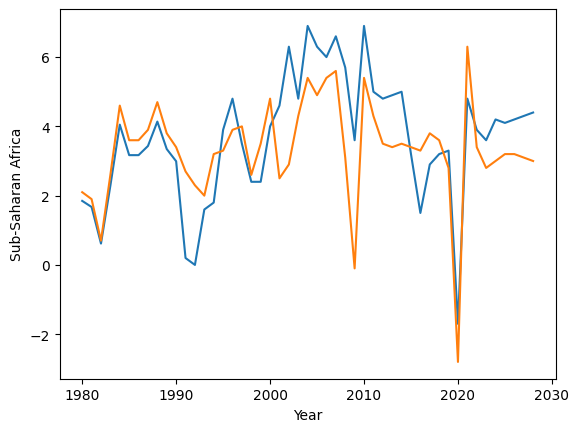

In [95]:
#df['c'] = df.apply(
#    lambda row: row['a']*row['b'] if np.isnan(row['c']) else row['c'],
#    axis=1)
test_df = full_df.copy()
test_df['Sub-Saharan Africa'] = full_df.apply(lambda row:row['World']*world_africa if np.isnan(row['Sub-Saharan Africa']) else row['Sub-Saharan Africa'],axis = 1)
    
sns.lineplot(x = 'Year',y = 'Sub-Saharan Africa', data = test_df)
sns.lineplot(x = 'Year',y = 'World', data = test_df)

<Axes: xlabel='Year', ylabel='Euro area'>

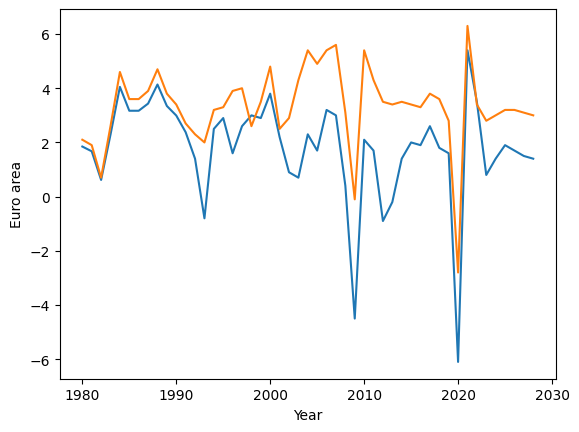

In [96]:
test_df['Euro area'] = full_df.apply(lambda row:row['World']*world_africa if np.isnan(row['Euro area']) else row['Euro area'],axis = 1)
sns.lineplot(x = 'Year',y = 'Euro area', data = test_df)
sns.lineplot(x = 'Year',y = 'World', data = test_df)

In [97]:
full_df[['Euro area','Sub-Saharan Africa']] = test_df[['Euro area','Sub-Saharan Africa']]

### Estratégia 2 e 3 - África Subsariana (países) e Oriente Médio (países)

In [98]:
test_2_df = test_df.copy()

In [99]:
#Países do Oriente Médio e seus vizinhos
group_Afghanistan = ['Afghanistan','Pakistan', 'Iran', 'Turkmenistan', 'Uzbekistan','Tajikistan']
group_Armenia = ['Armenia','Georgia', 'Azerbaijan', 'Iran','Türkiye']
group_Azerbaijan = ['Azerbaijan','Armenia', 'Georgia', 'Iran','Russia']
group_Djibouti = ['Djibouti','Eritrea', 'Ethiopia','Somalia']
group_Georgia = ['Georgia', 'Armenia','Azerbaijan','Russia','Türkiye']
group_Iraq = ['Iraq','Kuwait', 'Iran', 'Syria', 'Jordan','Saudi Arabia','Türkiye']
group_Kazakhstan = ['Kazakhstan', 'Kyrgyz Republic', 'Uzbekistan','Turkmenistan','Russia','China']
group_Kyrgyz_Republic = ['Kyrgyz Republic','Kazakhstan', 'Uzbekistan', 'Tajikistan','China']
group_Lebanon = ['Lebanon','Israel','Syria' ]
group_Mauritania = ['Mauritania','Algeria','Mali','Senegal']
group_Somalia = ['Somalia','Kenya','Ethiopia','Djibouti']
group_Syria = ['Syria','Iraq','Jordan','Lebanon','Türkiye']
group_Tajikistan = ['Tajikistan','Kyrgyz Republic', 'Afghanistan','Uzbekistan','China']
group_Turkmenistan = ['Turkmenistan','Kazakhstan','Uzbekistan', 'Afghanistan','Iran']
group_Uzbekistan = ['Uzbekistan','Kazakhstan','Kyrgyz Republic', 'Tajikistan', 'Afghanistan','Turkmenistan']
group_West_Bank = ['West Bank and Gaza','Jordan','Israel']
group_Yemen = ['Yemen','Saudi Arabia','Oman']

In [100]:
#Países da Africa subsariana e seus vizinhos
group_Eritrea = ['Eritrea','Ethiopia', 'Sudan', 'Djibouti']
group_Guinea_Bissau =['Guinea-Bissau','Guinea', 'Senegal']
group_Liberia =['Liberia','Guinea', 'Sierra Leone']
group_Namibia =['Namibia','Angola', 'Zambia', 'Botswana', 'South Africa']
group_Nigeria =['Nigeria','Benin','Chad', 'Niger','Cameroon']
group_Zimbabwe =['Zimbabwe','Botswana', 'Mozambique', 'South Africa', 'Zambia']
group_South_Sudan =['South Sudan','Sudan', 'Ethiopia', 'Uganda', 'Democratic Republic of the Congo','Central African Republic']

In [101]:
#Função para aplicar a imputação das médias de outros valores na linha com valor faltante.
def avg_neigh_imputation(neighbours,country):
    return lambda row:np.mean([row[n] for n in neighbours]) if np.isnan(row[country]) else row[country]

In [102]:
#Como dos vizinhos dos países africanos com dados faltantes somente Djibouti tem valores faltantes, a imputação já pode ser aplicada.
test_df['Eritrea'] = test_df.apply(avg_neigh_imputation(['Ethiopia', 'Sudan'],'Eritrea'),axis = 1)
test_df['Guinea-Bissau'] = test_df.apply(avg_neigh_imputation(['Guinea', 'Senegal'],'Guinea-Bissau'),axis = 1)
test_df['Liberia'] = test_df.apply(avg_neigh_imputation(['Guinea', 'Sierra Leone'],'Liberia'),axis = 1)
test_df['Namibia'] = test_df.apply(avg_neigh_imputation(['Angola', 'Zambia', 'Botswana', 'South Africa'],'Namibia'),axis = 1)
test_df['Nigeria'] = test_df.apply(avg_neigh_imputation(['Benin','Chad', 'Niger','Cameroon'],'Nigeria'),axis = 1)
test_df['Zimbabwe'] = test_df.apply(avg_neigh_imputation(['Botswana', 'Mozambique', 'South Africa', 'Zambia'],'Zimbabwe'),axis = 1)
test_df['South Sudan'] = test_df.apply(avg_neigh_imputation(['Sudan', 'Ethiopia', 'Uganda', 'Democratic Republic of the Congo','Central African Republic'],'South Sudan'),axis = 1)

In [103]:
#Agora o processo para os países do Oriente Médio, começando com os países cujos vizinhos não possuem dados faltantes, Yemen, West Bank e Mauritania.
test_df['West Bank and Gaza'] = test_df.apply(avg_neigh_imputation(['Israel','Jordan'],'West Bank and Gaza'),axis = 1)
test_df['Yemen'] = test_df.apply(avg_neigh_imputation(['Saudi Arabia','Oman'],'Yemen'),axis = 1)
test_df['Mauritania'] = test_df.apply(avg_neigh_imputation(['Algeria','Mali','Senegal'],'Mauritania'),axis = 1)

In [104]:
#Síria e Líbano são países vizinhos cujos valores faltantes estão nos anos finais, mas como a Síria possui mais vizinhos que o Líbano,
# primeiramente serão preenchidos os dados da Síria para preencher os do Líbano. Síria é o único vizinho do Iraque com valores faltantes, 
# portanto em sequência esse país também pode ser preenchido.
test_df['Syria'] = test_df.apply(avg_neigh_imputation(['Iraq','Jordan','Türkiye'],'Syria'),axis = 1)
test_df['Lebanon'] = test_df.apply(avg_neigh_imputation(['Israel','Syria'],'Lebanon'),axis = 1)
test_df['Iraq'] = test_df.apply(avg_neigh_imputation(['Kuwait', 'Iran', 'Syria', 'Jordan','Saudi Arabia','Türkiye'],'Iraq'),axis = 1)


<Axes: xlabel='Year', ylabel='Georgia'>

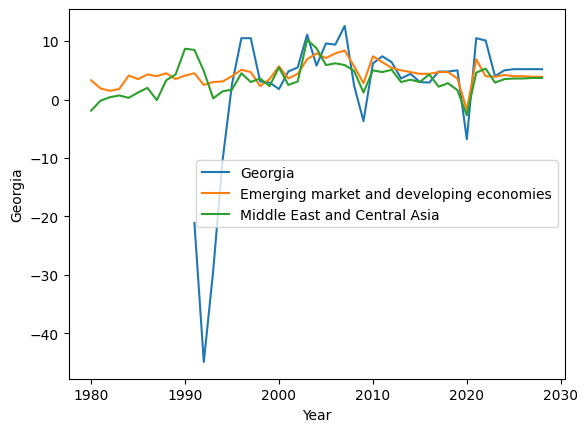

In [105]:
#Os próximos países a serem preenchidos são Azerbaijão e Armenia. Ambos compartilham o mesmo vizinho, Geórgia. Desse modo,
# A Geórgia tem de ser preenchida primeiro. Como a Geórgia pertence tanto ao grupo Middle East and Central Asia e Emerging Developing Economies,
#É interessante visualizar melhor se há alguma relação específica entre essas economias.

sns.lineplot(x = 'Year',y = 'Georgia', data = test_df, label = 'Georgia')
sns.lineplot(x = 'Year',y = 'Emerging market and developing economies', data = test_df, label = 'Emerging market and developing economies')
sns.lineplot(x = 'Year',y = 'Middle East and Central Asia', data = test_df, label = 'Middle East and Central Asia')

Apesar do ponto entre 90 e 2000 diferir, é seguro dizer que a Geórgia seguiu a variação do índice GDP dos grupos, portanto pode-se inferir um comportamento semelhante aos anos com dados faltantes, visto que há uma queda a partir dos anos 90. Com isso, será utilizada a média dos dois grupos para compôr os dados faltantes. Após isso, serão preenchidos os valores da Armenia e Azerbaijão.

In [106]:
test_df['Georgia'] = test_df.apply(avg_neigh_imputation(['Emerging market and developing economies','Middle East and Central Asia'],'Georgia'),axis = 1)

<Axes: xlabel='Year', ylabel='Georgia'>

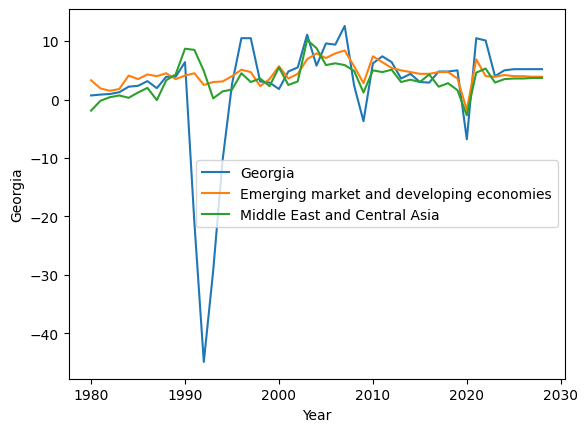

In [107]:
sns.lineplot(x = 'Year',y = 'Georgia', data = test_df, label = 'Georgia')
sns.lineplot(x = 'Year',y = 'Emerging market and developing economies', data = test_df, label = 'Emerging market and developing economies')
sns.lineplot(x = 'Year',y = 'Middle East and Central Asia', data = test_df, label = 'Middle East and Central Asia')

In [108]:
test_df['Armenia'] = test_df.apply(avg_neigh_imputation(['Georgia','Iran','Türkiye'],'Armenia'),axis = 1)
test_df['Azerbaijan'] = test_df.apply(avg_neigh_imputation(['Georgia','Iran','Armenia'],'Azerbaijan'),axis = 1)

<Axes: xlabel='Year', ylabel='Georgia'>

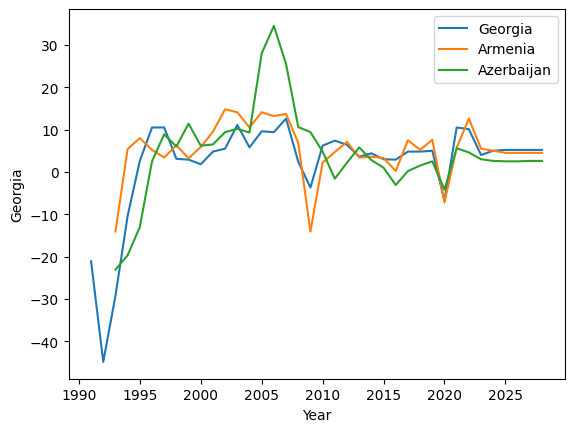

In [109]:
#A título de curiosidade, vamos observar como é a variação do índice desses países antes da imputação
sns.lineplot(x = 'Year',y = 'Georgia', data = new_df, label = 'Georgia')
sns.lineplot(x = 'Year',y = 'Armenia', data = new_df, label = 'Armenia')
sns.lineplot(x = 'Year',y = 'Azerbaijan', data = new_df, label = 'Azerbaijan')

Os três países têm variação semelhante, portanto a decisão pode ser considerada acertada.
Por fim, a imputação dos países restantes, iniciando com Djibouti e encerrando com Usbequistão.

In [110]:
test_df['Djibouti'] = test_df.apply(avg_neigh_imputation(['Eritrea', 'Ethiopia'],'Djibouti'),axis = 1)
test_df['Somalia'] = test_df.apply(avg_neigh_imputation(['Kenya','Ethiopia','Djibouti'],'Somalia'),axis = 1)
test_df['Afghanistan'] = test_df.apply(avg_neigh_imputation(['Pakistan','Iran'],'Afghanistan'),axis = 1)
test_df['Turkmenistan'] = test_df.apply(avg_neigh_imputation(['Afghanistan','Iran'],'Turkmenistan'),axis = 1)
test_df['Tajikistan'] = test_df.apply(avg_neigh_imputation(["China", 'Afghanistan'],'Tajikistan'),axis = 1)
test_df['Kazakhstan'] = test_df.apply(avg_neigh_imputation(['Tajikistan','China'],'Kazakhstan'),axis = 1)
test_df['Kyrgyz Republic'] = test_df.apply(avg_neigh_imputation(['China','Kazakhstan','Tajikistan'],'Kyrgyz Republic'),axis = 1)
test_df['Uzbekistan'] = test_df.apply(avg_neigh_imputation(['Kazakhstan','Kyrgyz Republic', 'Tajikistan', 'Afghanistan','Turkmenistan'],'Uzbekistan'),axis = 1)

<Axes: xlabel='Year', ylabel='avg_middle_east'>

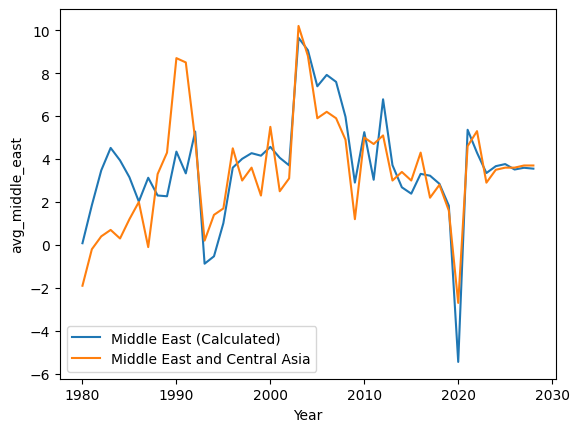

In [111]:
#Para fins de teste, vamos plotar a média dos valores dos países contra a variação do índice dos grupos

test_df['avg_middle_east'] = test_df[middle_east_central_asia].mean(axis = 1)

sns.lineplot(x = 'Year',y = 'avg_middle_east', data = test_df, label = 'Middle East (Calculated)')
sns.lineplot(x = 'Year',y = 'Middle East and Central Asia', data = test_df, label = 'Middle East and Central Asia')

<Axes: xlabel='Year', ylabel='avg_sub_saharan'>

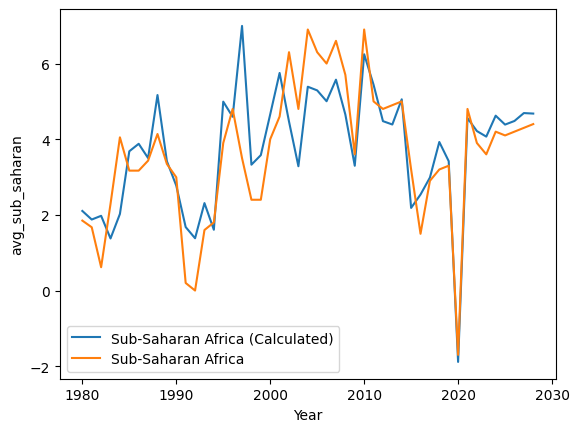

In [112]:
test_df['avg_sub_saharan'] = test_df[sub_saharan_africa].mean(axis = 1)

sns.lineplot(x = 'Year',y = 'avg_sub_saharan', data = test_df, label = 'Sub-Saharan Africa (Calculated)')
sns.lineplot(x = 'Year',y = 'Sub-Saharan Africa', data = test_df, label = 'Sub-Saharan Africa')

Apesar de algumas disparidades, as curvas estão relativamente próximas. Agora será aplicada a estratégia 3 para comparação.

In [113]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn import linear_model

In [114]:
test_2_df[group_Eritrea] = test_2_df[group_Eritrea].astype(float)
test_2_df[group_Eritrea].dtypes

Eritrea     float64
Ethiopia    float64
Sudan       float64
Djibouti    float64
dtype: object

In [115]:
test_2_df[group_Eritrea]

,Eritrea,Ethiopia,Sudan,Djibouti
0,NaN,4.0,2.5,NaN
1,NaN,0.0,6.3,NaN
2,NaN,1.0,4.1,NaN
3,NaN,7.8,-1.5,NaN
4,NaN,-2.3,-5.6,NaN
5,NaN,-11.4,-0.6,NaN
6,NaN,9.7,9.9,NaN
7,NaN,13.9,6.5,NaN
8,NaN,0.6,4.3,NaN
9,NaN,-0.5,1.4,NaN


Em Python, a técnica MICE pode ser implementada usando a classe `IterativeImputer` do módulo `sklearn.impute`. Os passos envolvem a identificação dos valores faltantes, a instanciação do imputador, o ajuste e transformação dos dados, e a substituição dos valores faltantes pelos valores imputados.

A imputação MICE pode ser tornada mais eficiente usando o pacote `miceforest`. Espera-se que ele tenha um desempenho significativamente melhor porque implementa o algoritmo `lightgbm` nos bastidores para realizar a imputação.

O LightGBM é conhecido por sua alta precisão de previsões. Combinar esse poder com o algoritmo "mice" o torna um método robusto para imputações.

Aqui estão algumas vantagens ainda mais convincentes:

- Ele pode lidar com variáveis categóricas para imputações.
- Você pode personalizar como a imputação acontece.
- É muito rápido. Pode usar GPU para ser ainda mais veloz.
- Os dados podem ser imputados no próprio lugar para economizar memória.

Aplicando inicialmente em apenas uma dos grupos vizinhos para observar sua aplicação e performance.

In [116]:
import miceforest as mf

# Create kernel. 
kds = mf.ImputationKernel(
  test_2_df[group_Eritrea],
  save_all_iterations=True,
  random_state=42
)

# Run the MICE algorithm for 5 iterations
kds.mice(5)

# Return the completed dataset.
df_imputed = kds.complete_data()

In [117]:
df_imputed_new = pd.merge(df_imputed,test_2_df[['Year','Ethiopia']], on = 'Ethiopia',how = 'left')

df_imputed_new

,Eritrea,Ethiopia,Sudan,Djibouti,Year
0,0.2,4.0,2.5,3.2,1980
1,2.8,0.0,6.3,1.8,1981
2,12.9,1.0,4.1,-1.2,1982
3,25.7,7.8,-1.5,4.8,1983
4,1.9,-2.3,-5.6,0.1,1984
5,30.9,-11.4,-0.6,-1.2,1985
6,-10.0,9.7,9.9,1.8,1986
7,10.9,13.9,6.5,-1.4,1987
8,20.9,0.6,4.3,-1.4,1988
9,1.9,-0.5,1.4,1.8,1989


<Axes: xlabel='Year', ylabel='Eritrea'>

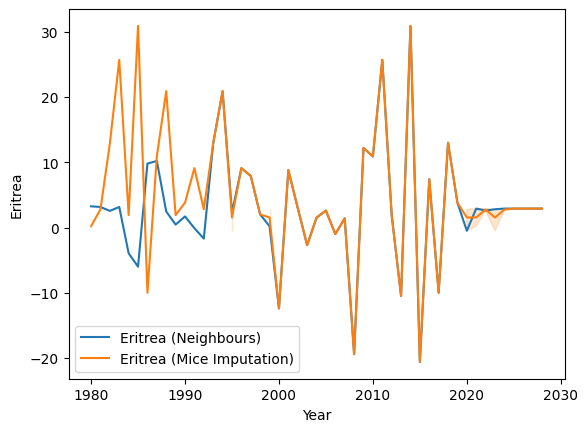

In [118]:
sns.lineplot(x = 'Year',y = 'Eritrea', data = test_df, label = 'Eritrea (Neighbours)')
sns.lineplot(x = 'Year',y = 'Eritrea', data = df_imputed_new, label = 'Eritrea (Mice Imputation)')

<Axes: xlabel='Year', ylabel='Djibouti'>

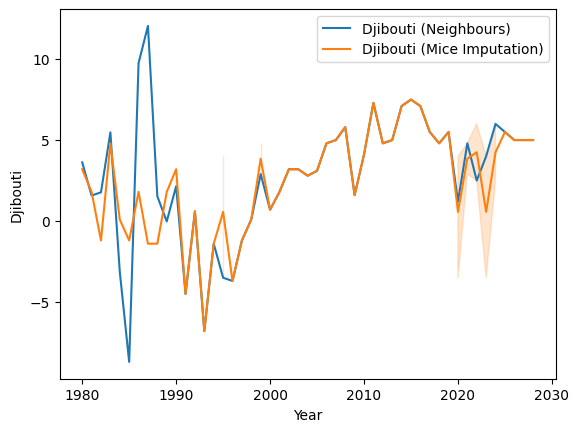

In [119]:
sns.lineplot(x = 'Year',y = 'Djibouti', data = test_df, label = 'Djibouti (Neighbours)')
sns.lineplot(x = 'Year',y = 'Djibouti', data = df_imputed_new, label = 'Djibouti (Mice Imputation)')

Há uma diferença notável nos gráficos de ambas as imputações. Para uma análise mais conclusiva, o método será aplicado em todos os dados da África Subsariana e Oriente Médio e comparado com a série temporal do grupo completo.

In [120]:
test_2_df = test_2_df.astype(float)
test_2_df.dtypes

Afghanistan                     float64
Albania                         float64
Algeria                         float64
Andorra                         float64
Angola                          float64
                                 ...   
Middle East and Central Asia    float64
Other advanced economies        float64
Sub-Saharan Africa              float64
World                           float64
Year                            float64
Length: 229, dtype: object

In [121]:
def mice_imputation(groups,group_names):
    df_dict = {str(key):None for key in group_names}
    i = 0
    for group in groups:

        kds = mf.ImputationKernel(
      test_2_df[group],
      save_all_iterations=True,
      random_state=42
    )

        # Run the MICE algorithm for 5 iterations
        kds.mice(5)

        # Return the completed dataset.
        df_imputed = kds.complete_data()
        df_imputed['Year'] = np.arange(1980,2029,1)
        df_dict[group_names[i]] = df_imputed
        i+=1
        
    
    return df_dict
        

In [122]:
african_groups = [
    group_Eritrea,
    group_Guinea_Bissau,
    group_Liberia,
    group_Namibia,
    group_Nigeria,
    group_Zimbabwe,
    group_South_Sudan
]

african_group_names = [
    'group_Eritrea',
    'group_Guinea_Bissau',
    'group_Liberia',
    'group_Namibia',
    'group_Nigeria',
    'group_Zimbabwe',
    'group_South_Sudan'
]

middle_east_groups = [
    group_Afghanistan,
    group_Armenia,
    group_Azerbaijan,
    group_Djibouti,
    group_Georgia,
    group_Iraq,
    group_Kazakhstan,
    group_Kyrgyz_Republic,
    group_Lebanon,
    group_Mauritania,
    group_Somalia,
    group_Syria,
    group_Tajikistan,
    group_Turkmenistan,
    group_Uzbekistan,
    group_West_Bank,
    group_Yemen
]

middle_east_group_names = [
    'group_Afghanistan',
    'group_Armenia',
    'group_Azerbaijan',
    'group_Djibouti',
    'group_Georgia',
    'group_Iraq',
    'group_Kazakhstan',
    'group_Kyrgyz_Republic',
    'group_Lebanon',
    'group_Mauritania',
    'group_Somalia',
    'group_Syria',
    'group_Tajikistan',
    'group_Turkmenistan',
    'group_Uzbekistan',
    'group_West_Bank',
    'group_Yemen'
]

In [123]:
sub_saharan_dict = mice_imputation(african_groups,african_group_names)

In [124]:
for group in african_group_names:
    print(sub_saharan_dict[group].head(),'\n')

   Eritrea  Ethiopia  Sudan  Djibouti  Year
0      0.2       4.0    2.5       3.2  1980
1      2.8       0.0    6.3       1.8  1981
2     12.9       1.0    4.1      -1.2  1982
3     25.7       7.8   -1.5       4.8  1983
4      1.9      -2.3   -5.6       0.1  1984 

   Guinea-Bissau  Guinea  Senegal  Year
0           -1.7     2.6     -0.8  1980
1           -0.5     0.6      5.1  1981
2            4.2     1.8      7.8  1982
3           -3.4     1.3     -5.3  1983
4            5.5     1.4      3.7  1984 

   Liberia  Guinea  Sierra Leone  Year
0      0.7     2.6          -0.6  1980
1      5.9     0.6           1.9  1981
2      6.1     1.8           1.8  1982
3      0.7     1.3          -1.6  1983
4      4.4     1.4           1.7  1984 

   Namibia  Angola  Zambia  Botswana  South Africa  Year
0      3.4     2.4     3.9      12.0           6.6  1980
1      2.8    -4.4     6.6       8.2           5.4  1981
2      1.1     0.0    -2.9      15.9          -0.4  1982
3      4.3     4.2    -1.1  

In [125]:
missing_african_countries = ['Eritrea',
    'Guinea-Bissau',
    'Liberia',
    'Namibia',
    'Nigeria',
    'Zimbabwe',
    'South Sudan']
test_3_df = test_2_df.copy()
i = 0
for country in missing_african_countries:
    test_3_df[country] = sub_saharan_dict[african_group_names[i]][country]
    i+=1
    
test_3_df[sub_saharan_africa]
test_3_df['avg_sub_saharan'] = test_3_df[sub_saharan_africa].mean(axis = 1)

<Axes: xlabel='Year', ylabel='avg_sub_saharan'>

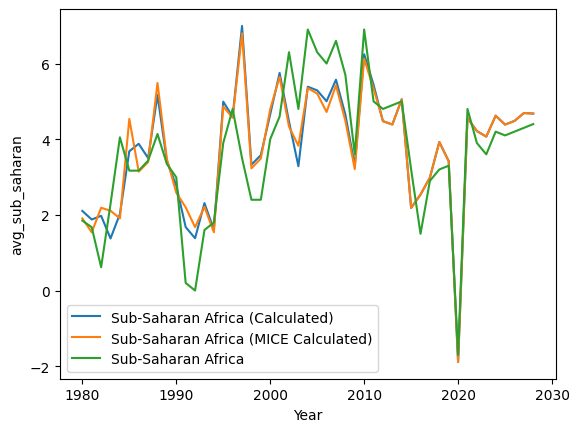

In [126]:
sns.lineplot(x = 'Year',y = 'avg_sub_saharan', data = test_df, label = 'Sub-Saharan Africa (Calculated)')
sns.lineplot(x = 'Year',y = 'avg_sub_saharan', data = test_3_df, label = 'Sub-Saharan Africa (MICE Calculated)')
sns.lineplot(x = 'Year',y = 'Sub-Saharan Africa', data = test_df, label = 'Sub-Saharan Africa')

In [127]:
middle_east_dict = mice_imputation(middle_east_groups,middle_east_group_names)

In [128]:
missing_middle_east_countries = ['Afghanistan',
'Armenia',
'Azerbaijan',
'Djibouti',
'Georgia',
'Iraq',
'Kazakhstan',
'Kyrgyz Republic',
'Lebanon',
'Mauritania',
'Somalia',
'Syria',
'Tajikistan',
'Turkmenistan',
'Uzbekistan',
'West Bank and Gaza',
'Yemen']

i = 0
for country in missing_middle_east_countries:
    test_3_df[country] = middle_east_dict[middle_east_group_names[i]][country]
    i+=1
    
test_3_df[middle_east_central_asia]
test_3_df['avg_middle_east'] = test_3_df[middle_east_central_asia].mean(axis = 1)

<Axes: xlabel='Year', ylabel='avg_middle_east'>

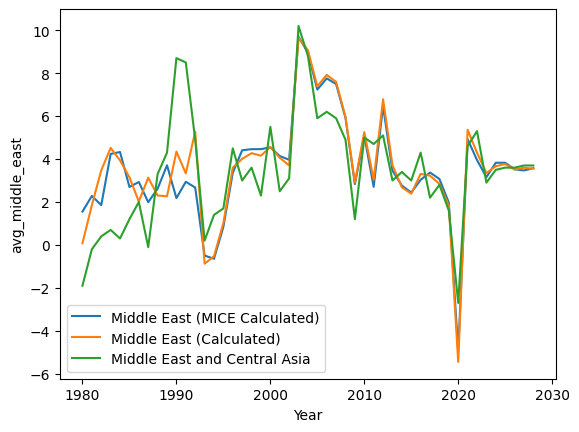

In [129]:
test_df['avg_middle_east'] = test_df[middle_east_central_asia].mean(axis = 1)
sns.lineplot(x = 'Year',y = 'avg_middle_east', data = test_3_df, label = 'Middle East (MICE Calculated)')
sns.lineplot(x = 'Year',y = 'avg_middle_east', data = test_df, label = 'Middle East (Calculated)')
sns.lineplot(x = 'Year',y = 'Middle East and Central Asia', data = test_df, label = 'Middle East and Central Asia')

Os plots indicam que, no geral, tanto a abordagem manual quanto a abordagem utilizando MICE e Lightgbm trazem resultados semelhantes, ainda que com certa variabilidade. A vantagem do MICE está em sua implementação e aplicação de um modelo de Machine Learning robusto para previsão dos dados faltantes, também preservando algumas características dos dados que podem ser perdidos com a aplicação manual. 
Desse modo, o MICE será aplicado no Pipeline do Kedro. Os dados preenchidos aqui serão integrados no DataFrame final.

In [130]:
# Substituição dos valores obtidos pelo MICE no dataset.
full_df[missing_african_countries + missing_middle_east_countries] = test_3_df[missing_african_countries + missing_middle_east_countries]

full_df[missing_african_countries + missing_middle_east_countries]

,Eritrea,Guinea-Bissau,Liberia,Namibia,Nigeria,Zimbabwe,South Sudan,Afghanistan,Armenia,Azerbaijan,...,Kyrgyz Republic,Lebanon,Mauritania,Somalia,Syria,Tajikistan,Turkmenistan,Uzbekistan,West Bank and Gaza,Yemen
0,0.2,-1.7,0.7,3.4,2.2,5.0,4.4,5.4,8.0,5.8,...,4.3,1.5,2.6,1.7,10.5,7.6,0.9,4.3,2.7,4.8
1,2.8,-0.5,5.9,2.8,-1.6,2.9,-6.5,2.2,4.7,2.6,...,3.9,0.5,4.5,2.7,8.5,1.7,-11.3,7.3,7.1,3.8
2,12.9,4.2,6.1,1.1,6.7,-7.8,5.6,11.8,5.5,6.0,...,3.7,-36.8,4.2,2.8,2.6,6.7,-2.9,7.3,1.2,5.2
3,25.7,-3.4,0.7,4.3,7.0,-0.5,5.3,14.0,3.2,1.5,...,6.0,22.7,2.6,2.7,1.6,6.9,13.0,7.0,1.2,3.6
4,1.9,5.5,4.4,3.5,4.1,-3.6,-13.3,2.2,3.2,2.6,...,-13.0,44.5,0.1,2.8,-6.5,1.7,4.7,7.1,3.7,3.6
5,30.9,4.3,0.0,3.5,7.3,1.8,-2.1,11.8,3.2,6.5,...,-0.1,24.3,1.8,1.7,7.3,4.4,1.8,1.7,2.0,3.9
6,-10.0,-1.0,5.7,2.7,5.4,-6.1,-2.1,2.2,5.2,6.2,...,7.0,-6.8,-3.9,3.7,-4.8,6.7,-1.0,5.9,7.0,3.7
7,10.9,5.6,5.5,5.3,2.2,2.0,1.6,1.0,5.5,10.6,...,3.7,16.7,4.2,3.7,1.3,7.0,-3.4,4.3,4.0,-12.7
8,20.9,2.0,2.5,5.1,2.5,19.7,-2.1,3.9,6.3,3.0,...,-0.2,-28.2,-0.8,2.2,12.7,7.9,6.1,6.9,2.0,2.0
9,1.9,2.9,5.4,1.1,1.6,4.7,-2.1,8.4,7.1,10.2,...,3.9,-42.2,4.2,1.2,-6.1,5.0,16.5,9.0,-8.6,3.9


Considerando que as regiões com dados faltantes já estão com os seus países completamente preenchidos, esses dados podem ser utilizados para a imputação utilizando a mesma função da Estratégia 2.

In [131]:
full_df['Africa (Region)'] = full_df.apply(avg_neigh_imputation([africa],'Africa (Region)'),axis = 1)

In [132]:
central_asia_causasus_countries = ['Uzbekistan', 'Kazakhstan','Kyrgyz Republic', 'Tajikistan', 'Turkmenistan', 'Azerbaijan', 'Armenia', 'Georgia']

full_df['Central Asia and the Caucasus'] = full_df.apply(avg_neigh_imputation([central_asia_causasus_countries],'Central Asia and the Caucasus'),axis = 1)

In [133]:
full_df['Sub-Saharan Africa (Region) '] = full_df.apply(avg_neigh_imputation([sub_saharan_africa],'Sub-Saharan Africa (Region) '),axis = 1)

<Axes: xlabel='Year', ylabel='Sub-Saharan Africa (Region) '>

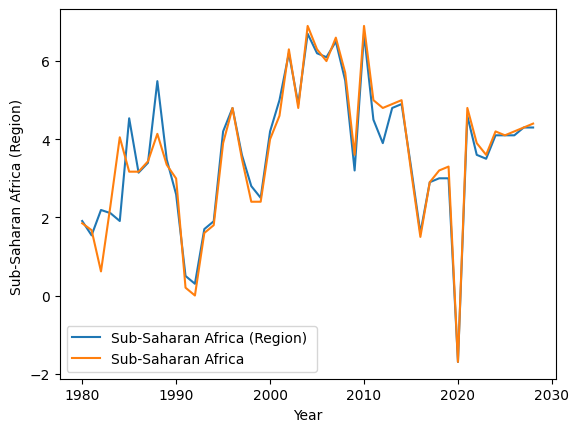

In [134]:
sns.lineplot(x = 'Year',y = 'Sub-Saharan Africa (Region) ', data = full_df, label = 'Sub-Saharan Africa (Region) ')
sns.lineplot(x = 'Year',y = 'Sub-Saharan Africa', data = full_df, label = 'Sub-Saharan Africa')

A comparação acima coloca em contraste as estratégias 1, 2 e 3 ao mesmo tempo, com o grupo da África Subsariana sendo imputado com a Estratégia 1 e a região imputado com a função da Estratégia 2 usando dados imputados com a Estratégia 3. 
Provavelmente recorrer à mesma abordagem para os grupos seria melhor, mas serve como ilustração de como diferentes métodos afetam o comportamento dos dados no geral. 

Seguindo, restam apenas os países que serão imputados utilizando o MICE.

## Estratégia 4 -  Países restantes

Baseado nas análises anteriores, também serão adicionados a cada lista de grupos as regiões as quais os países com dados faltantes dentro do grupo pertecem, para captar qualquer possível influência.

In [135]:
other_advanced_economies.extend(['Western Europe','Eastern Europe ','Southeast Asia','South America'])
european_union.extend(['Western Europe'])
euro_area.extend(['Western Europe'])
emerging_developing_asia.extend(['South Asia','Southeast Asia','Pacific Islands '])
emerging_developing_europe.extend(['Western Europe', 'Eastern Europe '])
latin_american_caribean.extend(['South America'])

In [136]:
emerging_developing_asia

['Bangladesh',
 'Bhutan',
 'Brunei Darussalam',
 'Cambodia',
 'China',
 'Fiji',
 'India',
 'Indonesia',
 'Kiribati',
 'Lao P.D.R.',
 'Malaysia',
 'Maldives',
 'Marshall Islands',
 'Micronesia',
 'Mongolia',
 'Myanmar',
 'Nauru',
 'Nepal',
 'Palau',
 'Papua New Guinea',
 'Philippines',
 'Samoa',
 'Solomon Islands',
 'Sri Lanka',
 'Thailand',
 'Timor-Leste',
 'Tonga',
 'Tuvalu',
 'Vanuatu',
 'Vietnam',
 'South Asia',
 'Southeast Asia',
 'Pacific Islands ']

In [137]:
emerging_developing_asia

['Bangladesh',
 'Bhutan',
 'Brunei Darussalam',
 'Cambodia',
 'China',
 'Fiji',
 'India',
 'Indonesia',
 'Kiribati',
 'Lao P.D.R.',
 'Malaysia',
 'Maldives',
 'Marshall Islands',
 'Micronesia',
 'Mongolia',
 'Myanmar',
 'Nauru',
 'Nepal',
 'Palau',
 'Papua New Guinea',
 'Philippines',
 'Samoa',
 'Solomon Islands',
 'Sri Lanka',
 'Thailand',
 'Timor-Leste',
 'Tonga',
 'Tuvalu',
 'Vanuatu',
 'Vietnam',
 'South Asia',
 'Southeast Asia',
 'Pacific Islands ']

In [138]:
remaining_groups = [
    other_advanced_economies,
    european_union,
    euro_area,
    emerging_developing_asia,
    emerging_developing_europe,
    latin_american_caribean
]

remaining_group_names = [
    'other_advanced_economies',
    'european_union',
    'euro_area',
    'emerging_developing_asia',
    'emerging_developing_europe',
    'latin_american_caribean'
]



In [139]:
remaining_groups_dict = mice_imputation(remaining_groups,remaining_group_names)

In [140]:
remaining_groups_dict['european_union'].isna().sum()

Austria            0
Belgium            0
Bulgaria           0
Croatia            0
Cyprus             0
Czech Republic     0
Denmark            0
Estonia            0
Finland            0
France             0
Germany            0
Greece             0
Hungary            0
Ireland            0
Italy              0
Latvia             0
Lithuania          0
Luxembourg         0
Malta              0
The Netherlands    0
Poland             0
Portugal           0
Romania            0
Slovak Republic    0
Slovenia           0
Spain              0
Sweden             0
Western Europe     0
Year               0
dtype: int64

In [141]:

    
remaining_missing_countries = {
'other_advanced_economies':
    ['Andorra',                     
'Czech Republic',              
'Macao SAR',                   
'Puerto Rico',                 
'San Marino'],
    
'euro_area':
    ['Croatia',          
'Estonia',         
'Latvia',
'The Netherlands',
'Lithuania',       
'Slovak Republic', 
'Slovenia'],
    
'emerging_developing_asia':
    ['Bangladesh',           
'Brunei Darussalam',    
'Cambodia',             
'Marshall Islands',
'Micronesia',
'Myanmar',              
'Nauru',                
'Palau',                
'Timor-Leste',          
'Tuvalu'],
    
'latin_american_caribean':
    ['Aruba',
'Venezuela'],
    
'emerging_developing_europe':
    ['Belarus',               
'Bosnia and Herzegovina',
'Kosovo',                
'Moldova',
'North Macedonia',
'Montenegro',            
'Serbia',
'Russia',
'Ukraine']
}

i = 0
#for group in remaining_groups:
for group,country_list in remaining_missing_countries.items():
    for i in range(len(country_list)):
        test_3_df[country_list[i]] = remaining_groups_dict[group][country_list[i]]


In [142]:
for group,country_list in remaining_missing_countries.items():
    full_df[country_list] = test_3_df[country_list]

<Axes: >

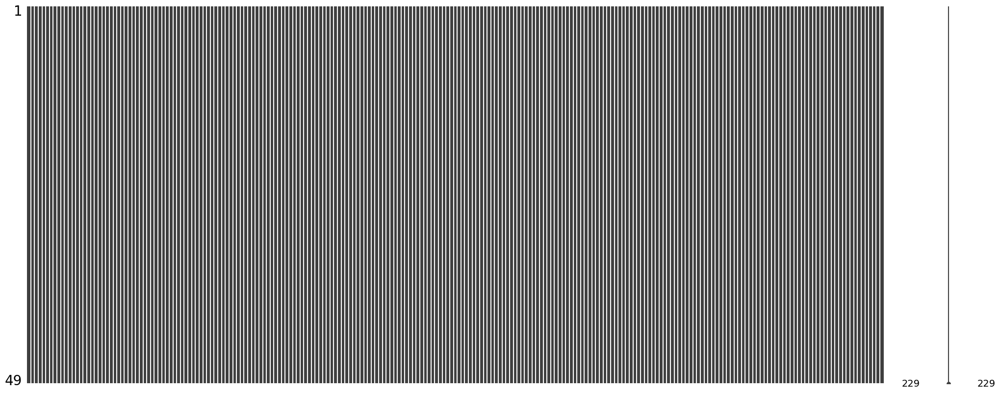

In [143]:
missingno.matrix(full_df)

Com isso, por fim tem o conjunto de dados completamente preenchido.

Sendo assim, foi aplicada novamente a análise de estacionariedade em todas as séries temporais.

In [144]:
new_series = list(full_df.columns)
new_series.remove('Year')

In [145]:
ADF_dict = {'Series':[],'ADF Statistic':[],'p-value':[],'Critical Values (1%)':[],'Critical Values (5%)':[],'Critical Values (10%)':[],'Is Stationary':[]}
for country in new_series:
    X = full_df[country].to_numpy()
    result = adfuller(X,autolag= 'AIC')
    ADF_dict['Series'].append(country)
    ADF_dict['ADF Statistic'].append(result[0])
    ADF_dict['p-value'].append(result[1])
    ADF_dict['Critical Values (1%)'].append(result[4]['1%'])
    ADF_dict['Critical Values (5%)'].append(result[4]['5%'])
    ADF_dict['Critical Values (10%)'].append(result[4]['10%'])
    if result[1] > 0.05: ADF_dict['Is Stationary'].append('NO')
    else: ADF_dict['Is Stationary'].append('YES')


In [146]:
KPSS_dict = {'Series':[],'KPSS Statistic':[],'p-value':[],'Critical Values (1%)':[],'Critical Values (2.5%)':[],'Critical Values (5%)':[],'Critical Values (10%)':[],'Is Stationary':[]}
for country in new_series:
    X = full_df[country].to_numpy()
    result = kpss(X,regression='ct')
    #argumento regression = 'ct' é utilizado para que o teste identifique que o modelo é estacionário ao longo de uma tendência, 
    #que é o que foi observado graficamente.
    KPSS_dict['Series'].append(country)
    KPSS_dict['KPSS Statistic'].append(result[0])
    KPSS_dict['p-value'].append(result[1])
    KPSS_dict['Critical Values (1%)'].append(result[3]['1%'])
    KPSS_dict['Critical Values (2.5%)'].append(result[3]["2.5%"])
    KPSS_dict['Critical Values (5%)'].append(result[3]['5%'])
    KPSS_dict['Critical Values (10%)'].append(result[3]['10%'])
    if result[1] < 0.05: KPSS_dict['Is Stationary'].append('NO')
    else: KPSS_dict['Is Stationary'].append('YES')

/tmp/ipykernel_1302/3220618479.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(X,regression='ct')
/tmp/ipykernel_1302/3220618479.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(X,regression='ct')
/tmp/ipykernel_1302/3220618479.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(X,regression='ct')
/tmp/ipykernel_1302/3220618479.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(X,regression='ct')
/tmp/ipykernel_1302/3220618479.py:4: Interpo

In [147]:
ADF_df = pd.DataFrame(ADF_dict)
kpss_df = pd.DataFrame(KPSS_dict)

statistics_df = pd.merge(ADF_df,kpss_df,how = 'inner', on = 'Series',suffixes = ['_ADF','_KPSS'])

conditions = [
    ((statistics_df['Is Stationary_KPSS'] == 'YES') & (statistics_df['Is Stationary_ADF'] == 'NO')),((statistics_df['Is Stationary_KPSS'] == 'NO') & (statistics_df['Is Stationary_ADF'] == 'YES')),
    ((statistics_df['Is Stationary_KPSS'] == 'YES') & (statistics_df['Is Stationary_ADF'] == 'YES')),((statistics_df['Is Stationary_KPSS'] == 'NO') & (statistics_df['Is Stationary_ADF'] == 'NO'))        
]
values = ['Trend Stationary','Difference Stationary','Stationary','Not Stationary']

statistics_df['Series Type'] = np.select(conditions, values)

statistics_df




,Series,ADF Statistic,p-value_ADF,Critical Values (1%)_ADF,Critical Values (5%)_ADF,Critical Values (10%)_ADF,Is Stationary_ADF,KPSS Statistic,p-value_KPSS,Critical Values (1%)_KPSS,Critical Values (2.5%),Critical Values (5%)_KPSS,Critical Values (10%)_KPSS,Is Stationary_KPSS,Series Type
0,Afghanistan,-2.732413,6.859544e-02,-3.577848,-2.925338,-2.600774,NO,0.144489,0.052798,0.216,0.176,0.146,0.119,YES,Trend Stationary
1,Albania,-2.138164,2.294480e-01,-3.615509,-2.941262,-2.609200,NO,0.106533,0.100000,0.216,0.176,0.146,0.119,YES,Trend Stationary
2,Algeria,-5.713760,7.199511e-07,-3.574589,-2.923954,-2.600039,YES,0.106457,0.100000,0.216,0.176,0.146,0.119,YES,Stationary
3,Andorra,-4.533778,1.707767e-04,-3.574589,-2.923954,-2.600039,YES,0.088726,0.100000,0.216,0.176,0.146,0.119,YES,Stationary
4,Angola,-3.528419,7.286545e-03,-3.574589,-2.923954,-2.600039,YES,0.173671,0.026941,0.216,0.176,0.146,0.119,NO,Difference Stationary
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223,Major advanced economies (G7),-6.170544,6.822231e-08,-3.574589,-2.923954,-2.600039,YES,0.062438,0.100000,0.216,0.176,0.146,0.119,YES,Stationary
224,Middle East and Central Asia,-4.100589,9.663545e-04,-3.574589,-2.923954,-2.600039,YES,0.168084,0.031597,0.216,0.176,0.146,0.119,NO,Difference Stationary
225,Other advanced economies,-0.192940,9.393579e-01,-3.615509,-2.941262,-2.609200,NO,0.115768,0.100000,0.216,0.176,0.146,0.119,YES,Trend Stationary
226,Sub-Saharan Africa,-3.688881,4.272294e-03,-3.574589,-2.923954,-2.600039,YES,0.158704,0.039413,0.216,0.176,0.146,0.119,NO,Difference Stationary


<Axes: xlabel='Series Type', ylabel='count'>

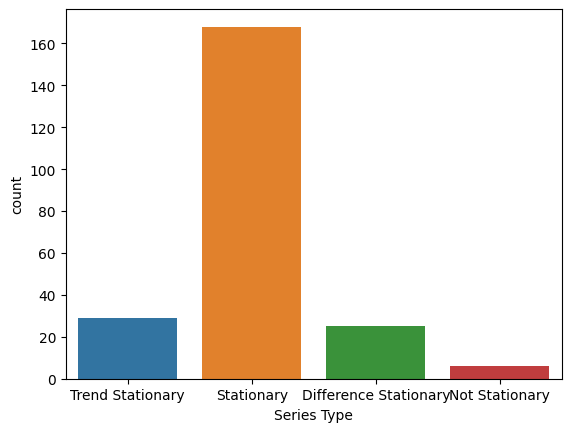

In [148]:
sns.countplot(x = 'Series Type', data = statistics_df)

In [149]:
statistics_df[statistics_df['Series Type'] == 'Not Stationary']

,Series,ADF Statistic,p-value_ADF,Critical Values (1%)_ADF,Critical Values (5%)_ADF,Critical Values (10%)_ADF,Is Stationary_ADF,KPSS Statistic,p-value_KPSS,Critical Values (1%)_KPSS,Critical Values (2.5%),Critical Values (5%)_KPSS,Critical Values (10%)_KPSS,Is Stationary_KPSS,Series Type
36,China,-2.673303,0.078773,-3.574589,-2.923954,-2.600039,NO,0.166057,0.033286,0.216,0.176,0.146,0.119,NO,Not Stationary
53,Equatorial Guinea,-2.011396,0.281599,-3.592504,-2.931550,-2.604066,NO,0.183363,0.022239,0.216,0.176,0.146,0.119,NO,Not Stationary
57,Ethiopia,-2.437773,0.131358,-3.581258,-2.926785,-2.601541,NO,0.151446,0.045462,0.216,0.176,0.146,0.119,NO,Not Stationary
163,Sri Lanka,-2.223315,0.197893,-3.581258,-2.926785,-2.601541,NO,0.150114,0.046571,0.216,0.176,0.146,0.119,NO,Not Stationary
194,Zambia,-2.064366,0.259082,-3.592504,-2.931550,-2.604066,NO,0.153024,0.044146,0.216,0.176,0.146,0.119,NO,Not Stationary
202,East Asia,-1.759610,0.400690,-3.581258,-2.926785,-2.601541,NO,0.156845,0.040963,0.216,0.176,0.146,0.119,NO,Not Stationary


No total, 6 séries temporais foram consideradas completamente não estacionárias, curiosamente sendo pouco abaixo do p-valor do intervalo de confiança do teste KPSS (0.05), mas sempre bem acima no caso do teste ADF, excetuando a China. Nenhum dos países acima tiveram seus valores imputados. 

Avaliando então os correlogramas de cada país.

Text(0, 0.5, 'GDP Index')

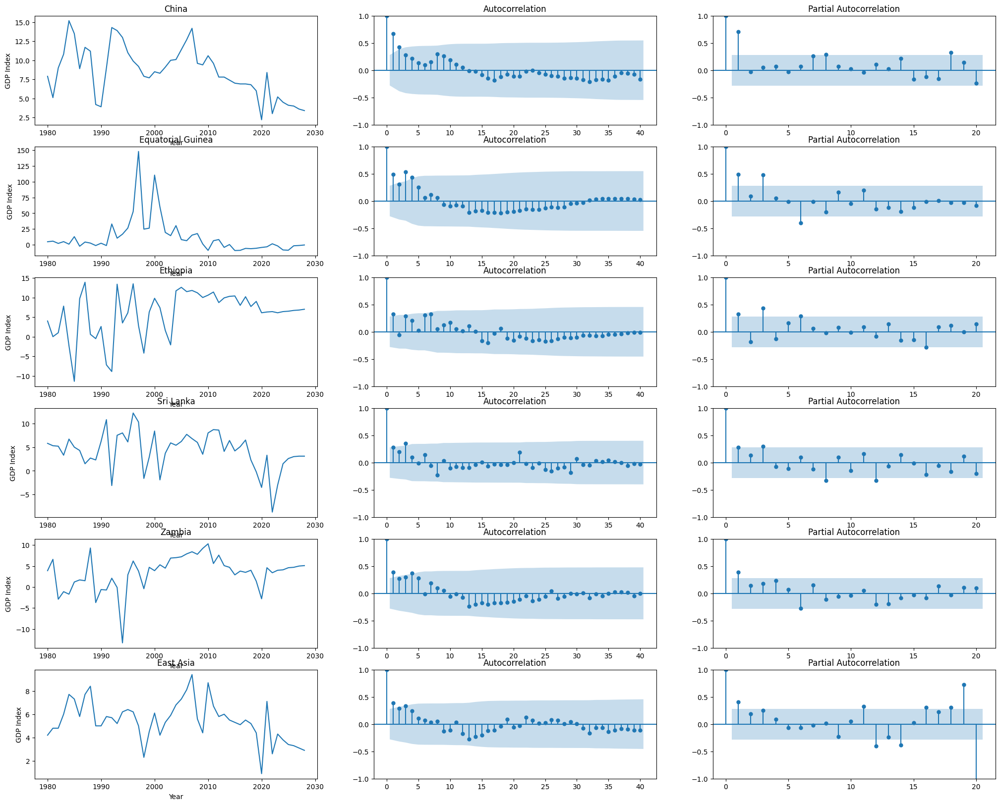

In [150]:
not_stationary = list(statistics_df[statistics_df['Series Type'] == 'Not Stationary']['Series'])


fig,ax = plt.subplots(nrows = 6, ncols = 3,figsize = (25,20))
sns.lineplot(ax = ax[0][0], x = "Year", y = not_stationary[0], data = new_df)
plot_acf(full_df[not_stationary[0]], lags=40, ax = ax[0][1])
plot_pacf(full_df[not_stationary[0]], lags = 20, method = "ols", ax = ax[0][2])

ax[0][0].set_title(not_stationary[0])
ax[0][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[1][0], x = "Year", y = not_stationary[1], data = new_df)
plot_acf(full_df[not_stationary[1]], lags=40, ax = ax[1][1])
plot_pacf(full_df[not_stationary[1]], lags = 20, method = "ols", ax = ax[1][2])

ax[1][0].set_title(not_stationary[1])
ax[1][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[2][0], x = "Year", y = not_stationary[2], data = new_df)
plot_acf(full_df[not_stationary[2]], lags=40, ax = ax[2][1])
plot_pacf(full_df[not_stationary[2]], lags = 20, method = "ols", ax = ax[2][2])

ax[2][0].set_title(not_stationary[2])
ax[2][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[3][0], x = "Year", y = not_stationary[3], data = new_df)
plot_acf(full_df[not_stationary[3]], lags=40, ax = ax[3][1])
plot_pacf(full_df[not_stationary[3]], lags = 20, method = "ols", ax = ax[3][2])

ax[3][0].set_title(not_stationary[3])
ax[3][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[4][0], x = "Year", y = not_stationary[4], data = new_df)
plot_acf(full_df[not_stationary[4]], lags=40, ax = ax[4][1])
plot_pacf(full_df[not_stationary[4]], lags = 20, method = "ols", ax = ax[4][2])

ax[4][0].set_title(not_stationary[4])
ax[4][0].set_ylabel('GDP Index')

sns.lineplot(ax = ax[5][0], x = "Year", y = not_stationary[5], data = new_df)
plot_acf(full_df[not_stationary[5]], lags=40, ax = ax[5][1])
plot_pacf(full_df[not_stationary[5]], lags = 20, method = "ols", ax = ax[5][2])

ax[5][0].set_title(not_stationary[5])
ax[5][0].set_ylabel('GDP Index')


Os plots das séries temporais apresentam um formato diferente do padrão observado mundialmente. Ainda assim, os correlogramas tendem a zero rapidamente. Isso pode se dar então ao fato das séries apresentarem algum grau de tendência ou sazonalidade que impedem-as de serem estritamente estacionárias. 

A aplicação de diferenciação é então necessária nesses casos, e nos outros cuja categoria ficou definida como "*difference stationary*".

A partir daqui os dados começarão a ser preparados para aplicação dos modelos.

## Modelos

Para esse projeto serão comparados os resultados de aplicações de alguns modelos diferentes: AutoARIMA, AutoETS, SimpleExponentialSmoothing, Drift, e HistoricAverage. Todos esses presentes na biblioteca `statsforecast`.
Além desses, também será comparada a perfomance do AutoARIMA da biblioteca anterior com o da biblioteca `pmdarima`. 

Desse modo, tem-se 3 modelos da família de *Auto Forecast*, um modelo da família de *Exponential Smoothing* e dois da família de modelos *Baseline*. Discorrendo brevemente sobre cada um:

#### AutoARIMA

Os modelos ARIMA são modelos que combinam componentes autoregressivos (AR), de média móvel (MA) e de diferenciação integrada (I). O Componente Autoregressivo (AR) rpresenta a relação entre uma observação atual e várias observações anteriores, ponderadas por coeficientes de autoregressão, ao passo que o Componente de Média Móvel (MA) leva em consideração os erros de previsão passados, ajustando a previsão atual com base em erros anteriores.
Sendo assim, o Componente de Diferenciação Integrada (I) envolve a diferenciação da série temporal para torná-la estacionária, o que facilita a modelagem e a previsão.

O Auto ARIMA é uma abordagem automatizada para selecionar os hiperparâmetros (ordens ARIMA) que melhor se ajustam a uma determinada série temporal. Ele utiliza algoritmos de busca automática para encontrar a combinação adequada de valores para os termos autoregressivos (p), de diferenciação (d) e de média móvel (q) que melhor modelam a série temporal. 

#### AutoETS

Os modelos ETS também são usados para previsão de séries temporais e são projetados para capturar os erros, tendências e sazonalidades presentes nos dados. O Componente de Erro (E) refere-se à parte aleatória da série temporal, que não pode ser explicada pela tendência ou sazonalidade, já o Componente de Tendência (T) captura a direção geral dos dados ao longo do tempo, sejam eles crescentes, decrescentes ou estáveis. Por fim, o Componente de Sazonalidade (S) lida com os padrões sazonais, que são repetições regulares de comportamento ao longo do tempo.

Os modelos ETS são úteis quando a série temporal exibe padrões sazonais, mas não é necessariamente estacionária ou não possui tendências claras.

O Auto ETS é uma abordagem semelhante ao Auto ARIMA, mas aplicada a modelos ETS. Assim como o Auto ARIMA, o Auto ETS automatiza o processo de seleção dos hiperparâmetros para os componentes de erro (E), tendência (T) e sazonalidade (S) dos modelos ETS. Ele examina diferentes combinações de configurações desses componentes para encontrar a melhor configuração que se ajusta à série temporal.

#### SimpleExponentialSmoothing

Exponential Smoothing (suavização exponencial) é uma técnica amplamente utilizada para previsão de séries temporais que se baseia na atribuição de pesos decrescentes às observações passadas. O método assume que os padrões presentes nos dados têm uma influência exponencialmente decrescente à medida que se afastam no tempo. O método usado aqui é o método básico, onde se estima um único nível e um único parâmetro de suavização. Ele é adequado para séries temporais sem tendência ou sazonalidade pronunciadas.

#### RandomWalkWithDrift

o modelo de "Drift" é uma técnica utilizada na previsão de séries temporais que pode ser visto como uma extensão do método de média móvel simples (também conhecido como método ingênuo (naive). O termo "drift" é usado para descrever o movimento gradual ou contínuo dos valores da série temporal ao longo do tempo.
O valor do "Drift" é calculado com base nas diferenças entre os valores sucessivos da série temporal. Em outras palavras, é a média das mudanças observadas nos dados históricos. A previsão futura é então determinada adicionando esse valor de "Drift" ao último valor observado na série.

#### HistoricAverage

O método da "Média Histórica" (Historical Average) é uma abordagem simples de previsão de séries temporais que se baseia na média dos valores históricos para fazer previsões futuras.



Com isso definido, agora é preciso preparar os dados.

In [151]:
forecast_df = full_df.query('Year >= 1980 and Year <= 2023')
forecast_df

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World,Year
0,5.4,2.7,-5.4,3.7,2.4,8.2,0.7,8.0,4.2,2.9,...,3.3,1.848869,1.8,6.4,0.9,-1.9,3.8,1.848869,2.1,1980
1,2.2,5.7,3.0,4.5,-4.4,3.8,-5.7,4.7,-0.9,4.1,...,1.9,1.672786,0.1,0.9,2.0,-0.2,4.2,1.672786,1.9,1981
2,11.8,2.9,6.4,1.5,0.0,-0.1,-3.1,5.5,1.2,0.1,...,1.5,0.616290,0.6,-0.5,-0.1,0.4,2.2,0.616290,0.7,1982
3,14.0,1.1,5.4,1.5,4.2,5.4,3.7,3.2,3.4,-0.5,...,1.8,2.289075,1.7,-2.8,3.3,0.7,4.0,2.289075,2.6,1983
4,2.2,2.0,5.6,8.7,6.0,10.2,2.0,3.2,7.7,6.3,...,4.1,4.049903,2.5,3.9,5.0,0.3,6.6,4.049903,4.6,1984
5,11.8,-1.5,5.6,8.7,3.5,7.6,-7.0,3.2,3.6,5.5,...,3.5,3.169489,2.2,3.2,3.8,1.2,4.3,3.169489,3.6,1985
6,2.2,5.6,-0.2,4.5,2.9,11.5,7.1,5.2,4.2,2.4,...,4.3,3.169489,2.7,4.3,3.0,2.0,5.5,3.169489,3.6,1986
7,1.0,-0.8,-0.7,8.1,4.1,6.6,2.5,5.5,16.1,4.9,...,4.0,3.433613,2.6,3.3,3.5,-0.1,6.5,3.433613,3.9,1987
8,3.9,-1.4,-1.9,3.7,6.1,5.2,-2.0,6.3,18.6,4.3,...,4.5,4.137944,3.8,1.1,4.7,3.3,5.5,4.137944,4.7,1988
9,8.4,9.8,4.8,8.1,0.0,5.3,-7.0,7.1,12.1,4.6,...,3.5,3.345572,3.6,1.1,3.8,4.3,4.6,3.345572,3.8,1989


Serão utilizados dois datasets diferentes. Um dataset para *forecasting* utilizando o modelo Auto-ARIMA da biblioteca pmdarima, e *forecasting* utilizando modelos da biblioteca statsforecast, que pedem um formato de dataset longo (*long format*). Isso será feito para no fim comparar a eficácia da previsão entre as duas abordagens. 

In [152]:
#pmdarima 

arima_forecast = forecast_df.copy()

arima_forecast.index = arima_forecast['Year']; arima_forecast = arima_forecast.drop('Year',axis = 1)
# Conversão para datetime
arima_forecast.index = pd.to_datetime(arima_forecast.index, format = '%Y')

# Modificação da data de 01-01 para 31-12
arima_forecast.index = arima_forecast.index.map(lambda date: date.replace(month=12, day=31))

# Conversão de volta para datetime
arima_forecast.index = pd.to_datetime(arima_forecast.index)

arima_forecast

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
Year,,,,,,,,,,,,,,,,,,,,,
1980-12-31,5.4,2.7,-5.4,3.7,2.4,8.2,0.7,8.0,4.2,2.9,...,-0.8,3.3,1.848869,1.8,6.4,0.9,-1.9,3.8,1.848869,2.1
1981-12-31,2.2,5.7,3.0,4.5,-4.4,3.8,-5.7,4.7,-0.9,4.1,...,-0.5,1.9,1.672786,0.1,0.9,2.0,-0.2,4.2,1.672786,1.9
1982-12-31,11.8,2.9,6.4,1.5,0.0,-0.1,-3.1,5.5,1.2,0.1,...,1.4,1.5,0.616290,0.6,-0.5,-0.1,0.4,2.2,0.616290,0.7
1983-12-31,14.0,1.1,5.4,1.5,4.2,5.4,3.7,3.2,3.4,-0.5,...,4.6,1.8,2.289075,1.7,-2.8,3.3,0.7,4.0,2.289075,2.6
1984-12-31,2.2,2.0,5.6,8.7,6.0,10.2,2.0,3.2,7.7,6.3,...,4.1,4.1,4.049903,2.5,3.9,5.0,0.3,6.6,4.049903,4.6
1985-12-31,11.8,-1.5,5.6,8.7,3.5,7.6,-7.0,3.2,3.6,5.5,...,2.4,3.5,3.169489,2.2,3.2,3.8,1.2,4.3,3.169489,3.6
1986-12-31,2.2,5.6,-0.2,4.5,2.9,11.5,7.1,5.2,4.2,2.4,...,4.4,4.3,3.169489,2.7,4.3,3.0,2.0,5.5,3.169489,3.6
1987-12-31,1.0,-0.8,-0.7,8.1,4.1,6.6,2.5,5.5,16.1,4.9,...,5.0,4.0,3.433613,2.6,3.3,3.5,-0.1,6.5,3.433613,3.9
1988-12-31,3.9,-1.4,-1.9,3.7,6.1,5.2,-2.0,6.3,18.6,4.3,...,1.6,4.5,4.137944,3.8,1.1,4.7,3.3,5.5,4.137944,4.7


In [153]:
#statsforecast

wide_forecast_df = forecast_df.T
wide_forecast_df.columns = wide_forecast_df.loc['Year']
wide_forecast_df = wide_forecast_df.drop('Year',axis = 0)
wide_forecast_df['Country'] = wide_forecast_df.index
wide_forecast_df = wide_forecast_df.reset_index()
wide_forecast_df = wide_forecast_df.drop('index',axis = 1)
wide_forecast_df.columns.name = None

In [154]:
wide_forecast_df

,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,Country
0,5.4,2.2,11.8,14.0,2.2,11.8,2.2,1.0,3.9,8.4,...,1.0,2.2,2.6,1.2,3.9,-2.4,3.9,-2.4,2.2,Afghanistan
1,2.7,5.7,2.9,1.1,2.0,-1.5,5.6,-0.8,-1.4,9.8,...,2.2,3.3,3.8,4.0,2.1,-3.5,8.5,3.7,2.2,Albania
2,-5.4,3.0,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,4.8,...,3.7,3.2,1.4,1.2,1.0,-5.1,3.4,2.9,2.6,Algeria
3,3.7,4.5,1.5,1.5,8.7,8.7,4.5,8.1,3.7,8.1,...,1.4,3.7,0.3,1.6,2.0,-11.2,8.9,8.7,1.3,Andorra
4,2.4,-4.4,0.0,4.2,6.0,3.5,2.9,4.1,6.1,0.0,...,0.9,-2.6,-0.2,-1.3,-0.7,-5.6,1.1,2.8,3.5,Angola
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223,0.9,2.0,-0.1,3.3,5.0,3.8,3.0,3.5,4.7,3.8,...,2.1,1.5,2.2,2.1,1.6,-4.5,5.3,2.3,1.1,Major advanced economies (G7)
224,-1.9,-0.2,0.4,0.7,0.3,1.2,2.0,-0.1,3.3,4.3,...,3.0,4.3,2.2,2.8,1.6,-2.7,4.6,5.3,2.9,Middle East and Central Asia
225,3.8,4.2,2.2,4.0,6.6,4.3,5.5,6.5,5.5,4.6,...,2.3,2.6,3.1,2.8,2.0,-1.6,5.4,2.6,1.8,Other advanced economies
226,1.848869,1.672786,0.61629,2.289075,4.049903,3.169489,3.169489,3.433613,4.137944,3.345572,...,3.2,1.5,2.9,3.2,3.3,-1.7,4.8,3.9,3.6,Sub-Saharan Africa


In [155]:
years = np.arange(1980,2024,1)
long_forecasting_df = pd.melt(wide_forecast_df, id_vars='Country', value_vars= years, var_name='ds', value_name='y')
long_forecasting_df =long_forecasting_df.rename(columns={'Country':'unique_id'})

In [156]:
long_forecasting_df

,unique_id,ds,y
0,Afghanistan,1980,5.4
1,Albania,1980,2.7
2,Algeria,1980,-5.4
3,Andorra,1980,3.7
4,Angola,1980,2.4
...,...,...,...
10027,Major advanced economies (G7),2023,1.1
10028,Middle East and Central Asia,2023,2.9
10029,Other advanced economies,2023,1.8
10030,Sub-Saharan Africa,2023,3.6


In [157]:
long_forecasting_df.dtypes

unique_id    object
ds           object
y            object
dtype: object

In [158]:
long_forecasting_df['ds'] = pd.to_datetime(long_forecasting_df['ds'],format='%Y')

In [159]:
long_forecasting_df

,unique_id,ds,y
0,Afghanistan,1980-01-01,5.4
1,Albania,1980-01-01,2.7
2,Algeria,1980-01-01,-5.4
3,Andorra,1980-01-01,3.7
4,Angola,1980-01-01,2.4
...,...,...,...
10027,Major advanced economies (G7),2023-01-01,1.1
10028,Middle East and Central Asia,2023-01-01,2.9
10029,Other advanced economies,2023-01-01,1.8
10030,Sub-Saharan Africa,2023-01-01,3.6


In [160]:
# conversão de datas
long_forecasting_df['ds'] = long_forecasting_df['ds'].apply(lambda date: date.replace(month=12, day=31))

long_forecasting_df['ds'] = pd.to_datetime(long_forecasting_df['ds'])

long_forecasting_df

,unique_id,ds,y
0,Afghanistan,1980-12-31,5.4
1,Albania,1980-12-31,2.7
2,Algeria,1980-12-31,-5.4
3,Andorra,1980-12-31,3.7
4,Angola,1980-12-31,2.4
...,...,...,...
10027,Major advanced economies (G7),2023-12-31,1.1
10028,Middle East and Central Asia,2023-12-31,2.9
10029,Other advanced economies,2023-12-31,1.8
10030,Sub-Saharan Africa,2023-12-31,3.6


Para fins de comparação com os resultados obtidos com os modelos utilizando o statsforecast, o mesmo processo será aplicado nos dados previstos pelo Statistica (2024 a 2028).

In [161]:
comparison_df = full_df.query('Year >= 2024 and Year <= 2028')
comparison_df

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World,Year
44,5.7,3.3,2.6,1.5,3.7,5.4,2.0,5.0,1.2,1.7,...,4.2,1.4,1.6,2.2,1.1,3.5,2.2,4.2,3.0,2024
45,2.7,3.4,2.2,1.5,4.0,4.1,2.0,4.5,1.2,2.1,...,4.0,1.9,2.2,2.3,1.7,3.6,2.3,4.1,3.2,2025
46,1.2,3.4,2.1,1.5,4.1,2.7,2.0,4.5,1.1,2.2,...,4.0,1.7,2.0,2.6,1.8,3.6,2.3,4.2,3.2,2026
47,-2.4,3.4,1.7,1.5,4.2,2.7,2.0,4.5,1.1,2.3,...,3.9,1.5,1.8,2.3,1.7,3.7,2.2,4.3,3.1,2027
48,1.0,3.4,1.8,1.5,4.2,2.7,2.0,4.5,1.1,2.3,...,3.9,1.4,1.7,2.3,1.6,3.7,2.3,4.4,3.0,2028


In [162]:
wide_coparison_df = comparison_df.T
wide_coparison_df.columns = wide_coparison_df.loc['Year']
wide_coparison_df = wide_coparison_df.drop('Year',axis = 0)
wide_coparison_df['Country'] = wide_coparison_df.index
wide_coparison_df = wide_coparison_df.reset_index()
wide_coparison_df = wide_coparison_df.drop('index',axis = 1)
wide_coparison_df.columns.name = None

In [163]:
years = np.arange(2024,2029,1)
long_comparison_df = pd.melt(wide_coparison_df, id_vars='Country', value_vars= years, var_name='ds', value_name='y')
long_comparison_df =long_comparison_df.rename(columns={'Country':'unique_id'})

long_comparison_df['ds'] = pd.to_datetime(long_comparison_df['ds'],format='%Y')
long_comparison_df['ds'] = long_comparison_df['ds'].apply(lambda date: date.replace(month=12, day=31))
long_comparison_df['ds'] = pd.to_datetime(long_comparison_df['ds'])

In [164]:
long_comparison_df

,unique_id,ds,y
0,Afghanistan,2024-12-31,5.7
1,Albania,2024-12-31,3.3
2,Algeria,2024-12-31,2.6
3,Andorra,2024-12-31,1.5
4,Angola,2024-12-31,3.7
...,...,...,...
1135,Major advanced economies (G7),2028-12-31,1.6
1136,Middle East and Central Asia,2028-12-31,3.7
1137,Other advanced economies,2028-12-31,2.3
1138,Sub-Saharan Africa,2028-12-31,4.4


Como o DataFrame de predições do statsforecast leva o unique_id como index, isso também já pode ser incorporado

In [165]:
long_comparison_df.index = long_comparison_df['unique_id']

long_comparison_df = long_comparison_df.drop('unique_id',axis = 1)

long_comparison_df

,ds,y
unique_id,,
Afghanistan,2024-12-31,5.7
Albania,2024-12-31,3.3
Algeria,2024-12-31,2.6
Andorra,2024-12-31,1.5
Angola,2024-12-31,3.7
...,...,...
Major advanced economies (G7),2028-12-31,1.6
Middle East and Central Asia,2028-12-31,3.7
Other advanced economies,2028-12-31,2.3


In [166]:
#Um pequeno tratamento caso haja valores iguais a zero, já que algumas métricas utilizam divisão e a divisão por zero pode causar complicações

long_comparison_df.query('y == 0')

,ds,y
unique_id,,
Ukraine,2025-12-31,0.0
Ukraine,2028-12-31,0.0


In [167]:
long_comparison_df['y'].replace({0:2.4}, inplace=True)

In [168]:
long_comparison_df.loc['Ukraine']

,ds,y
unique_id,,
Ukraine,2024-12-31,2.4
Ukraine,2025-12-31,2.4
Ukraine,2026-12-31,2.4
Ukraine,2027-12-31,2.4
Ukraine,2028-12-31,2.4


Considerando esse caso específico, os valores por 0 serão substituidos por 2.4, considerando o padrão do PIB nesse período.

# 4. Training

Tendo os modelos escolhidos sido apresentados anteriormente, nessa etapa serão aplicados no conjunto de dados para que efetuem suas previsões, por fim comparando-os entre si para optar pelo modelo final que será integrado no pipeline do Kedro.

## 4.1. Auto-ARIMA da biblioteca `pmdarima`

In [169]:
pip install pmdarima 

Note: you may need to restart the kernel to use updated packages.


In [170]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm

In [171]:
from dateutil.relativedelta import relativedelta

def get_forecast_group(data, n_periods, seasonal):
    # Initialize empty lists to store forecast data
    data_fc = []
    data_lower = []
    data_upper = []
    data_aic = []
    data_fitted = []
    
    # Iterate over columns in data
    for group in data.columns:
        # Fit an ARIMA model using the auto_arima function
        data_actual = data[group]
        model = pm.auto_arima(data_actual, 
                              start_p=0, start_q=0,
                              max_p=12, max_q=12, # maximum p and q
                              test='adf',         # use adftest to find optimal 'd'
                              seasonal=seasonal,  # TRUE if seasonal series
                              m=1,                # frequency of series
                              d=None,             # let model determine 'd'
                              D=None,             # let model determine 'D'
                              trace=False,
                              error_action='ignore',  
                              suppress_warnings=True, 
                              stepwise=True)
        fc, confint = model.predict(n_periods=n_periods, return_conf_int=True)
        index_of_fc = pd.date_range(pd.to_datetime(data_actual.index[-1])  + relativedelta(years = +1), periods = n_periods, freq = 'A')
        
        data_fc.append(fc)
        data_lower.append(confint[:, 0])
        data_upper.append(confint[:, 1])
        data_aic.append(model.aic())
        data_fitted.append(model.fittedvalues())

        # Create dataframes for forecast, lower bound, and upper bound
        df_fc = pd.DataFrame(index = index_of_fc)
        df_lower = pd.DataFrame(index = index_of_fc)
        df_upper = pd.DataFrame(index = index_of_fc)
        df_aic = pd.DataFrame()
        df_fitted = pd.DataFrame(index = data_actual.index)
        
        i = 0
    for group in data.columns:
        df_fc[group] = data_fc[i][:]
        df_lower[group] = data_lower[i][:]
        df_upper[group] = data_upper[i][:]
        df_aic[group] = data_aic[i]
        df_fitted[group] = data_fitted[i][:]
        i = i + 1
    
    return df_fc, df_lower, df_upper, df_aic, df_fitted

In [172]:

df_fc, df_lower, df_upper, df_aic, df_fitted = get_forecast_group(data = arima_forecast, 
                                                                  n_periods = 5, 
                                                                  seasonal = False)

/tmp/ipykernel_1302/1681617096.py:45: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_fc[group] = data_fc[i][:]
/tmp/ipykernel_1302/1681617096.py:46: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_lower[group] = data_lower[i][:]
/tmp/ipykernel_1302/1681617096.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

/tmp/ipykernel_1302/1681617096.py:47: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_upper[group] = data_upper[i][:]
/tmp/ipykernel_1302/1681617096.py:48: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_aic[group] = data_aic[i]
/tmp/ipykernel_1302/1681617096.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = fr

In [173]:
df_fc

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
2024-12-31,-0.733209,3.738784,1.79189,2.798405,2.431248,3.889696,-0.093307,5.5,2.310182,3.560694,...,1.438897,3.898848,1.399947,1.474036,-0.957572,2.086364,2.9,2.812252,3.440791,1.682392
2025-12-31,1.037005,2.832769,1.79189,2.798405,2.431248,3.386085,3.584008,5.5,2.310182,2.707185,...,2.790170,3.898848,1.399947,1.978974,3.344497,2.086364,2.9,2.925287,3.440791,3.901273
2026-12-31,-0.943678,2.832769,1.79189,2.798405,2.431248,3.386085,3.064900,5.5,2.310182,3.230111,...,0.040739,3.898848,1.399947,1.878654,2.883838,2.086364,2.9,2.706978,3.440791,3.129985
2027-12-31,1.017885,2.832769,1.79189,2.798405,2.431248,3.386085,1.799113,5.5,2.310182,2.909726,...,0.857362,3.898848,1.399947,1.794940,1.899359,2.086364,2.9,2.787822,3.440791,2.799810
2028-12-31,-0.819371,2.832769,1.79189,2.798405,2.431248,3.386085,1.749198,5.5,2.310182,3.106019,...,0.794091,3.898848,1.399947,1.807165,0.998756,2.086364,2.9,2.899442,3.440791,2.701021


In [174]:
#União da tabela de previsões no conjunto de dados

auto_arima_df = pd.concat([arima_forecast,df_fc])

#auto_arima_df.index = auto_arima_df.index.strftime('%Y')
auto_arima_df

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
1980-12-31,5.400000,2.7,-5.4,3.700000,2.4,8.2,0.7,8.0,4.200000,2.9,...,-0.8,3.3,1.848869,1.8,6.4,0.9,-1.9,3.8,1.848869,2.1
1981-12-31,2.200000,5.7,3.0,4.500000,-4.4,3.8,-5.7,4.7,-0.900000,4.1,...,-0.5,1.9,1.672786,0.1,0.9,2.0,-0.2,4.2,1.672786,1.9
1982-12-31,11.800000,2.9,6.4,1.500000,0.0,-0.1,-3.1,5.5,1.200000,0.1,...,1.4,1.5,0.616290,0.6,-0.5,-0.1,0.4,2.2,0.616290,0.7
1983-12-31,14.000000,1.1,5.4,1.500000,4.2,5.4,3.7,3.2,3.400000,-0.5,...,4.6,1.8,2.289075,1.7,-2.8,3.3,0.7,4.0,2.289075,2.6
1984-12-31,2.200000,2.0,5.6,8.700000,6.0,10.2,2.0,3.2,7.700000,6.3,...,4.1,4.1,4.049903,2.5,3.9,5.0,0.3,6.6,4.049903,4.6
1985-12-31,11.800000,-1.5,5.6,8.700000,3.5,7.6,-7.0,3.2,3.600000,5.5,...,2.4,3.5,3.169489,2.2,3.2,3.8,1.2,4.3,3.169489,3.6
1986-12-31,2.200000,5.6,-0.2,4.500000,2.9,11.5,7.1,5.2,4.200000,2.4,...,4.4,4.3,3.169489,2.7,4.3,3.0,2.0,5.5,3.169489,3.6
1987-12-31,1.000000,-0.8,-0.7,8.100000,4.1,6.6,2.5,5.5,16.100000,4.9,...,5.0,4.0,3.433613,2.6,3.3,3.5,-0.1,6.5,3.433613,3.9
1988-12-31,3.900000,-1.4,-1.9,3.700000,6.1,5.2,-2.0,6.3,18.600000,4.3,...,1.6,4.5,4.137944,3.8,1.1,4.7,3.3,5.5,4.137944,4.7
1989-12-31,8.400000,9.8,4.8,8.100000,0.0,5.3,-7.0,7.1,12.100000,4.6,...,0.1,3.5,3.345572,3.6,1.1,3.8,4.3,4.6,3.345572,3.8


In [175]:
auto_arima_df.index = pd.to_datetime(auto_arima_df.index).strftime('%Y')
auto_arima_df

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
1980,5.400000,2.7,-5.4,3.700000,2.4,8.2,0.7,8.0,4.200000,2.9,...,-0.8,3.3,1.848869,1.8,6.4,0.9,-1.9,3.8,1.848869,2.1
1981,2.200000,5.7,3.0,4.500000,-4.4,3.8,-5.7,4.7,-0.900000,4.1,...,-0.5,1.9,1.672786,0.1,0.9,2.0,-0.2,4.2,1.672786,1.9
1982,11.800000,2.9,6.4,1.500000,0.0,-0.1,-3.1,5.5,1.200000,0.1,...,1.4,1.5,0.616290,0.6,-0.5,-0.1,0.4,2.2,0.616290,0.7
1983,14.000000,1.1,5.4,1.500000,4.2,5.4,3.7,3.2,3.400000,-0.5,...,4.6,1.8,2.289075,1.7,-2.8,3.3,0.7,4.0,2.289075,2.6
1984,2.200000,2.0,5.6,8.700000,6.0,10.2,2.0,3.2,7.700000,6.3,...,4.1,4.1,4.049903,2.5,3.9,5.0,0.3,6.6,4.049903,4.6
1985,11.800000,-1.5,5.6,8.700000,3.5,7.6,-7.0,3.2,3.600000,5.5,...,2.4,3.5,3.169489,2.2,3.2,3.8,1.2,4.3,3.169489,3.6
1986,2.200000,5.6,-0.2,4.500000,2.9,11.5,7.1,5.2,4.200000,2.4,...,4.4,4.3,3.169489,2.7,4.3,3.0,2.0,5.5,3.169489,3.6
1987,1.000000,-0.8,-0.7,8.100000,4.1,6.6,2.5,5.5,16.100000,4.9,...,5.0,4.0,3.433613,2.6,3.3,3.5,-0.1,6.5,3.433613,3.9
1988,3.900000,-1.4,-1.9,3.700000,6.1,5.2,-2.0,6.3,18.600000,4.3,...,1.6,4.5,4.137944,3.8,1.1,4.7,3.3,5.5,4.137944,4.7
1989,8.400000,9.8,4.8,8.100000,0.0,5.3,-7.0,7.1,12.100000,4.6,...,0.1,3.5,3.345572,3.6,1.1,3.8,4.3,4.6,3.345572,3.8


## 4.2. Auto-ARIMA da biblioteca `statsforecast`

In [176]:
from statsforecast import StatsForecast

/home/lcscrv/projetos/indicium/kedro/kedro_time_series_project/venv/lib/python3.8/site-packages/statsforecast/core.py:25: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [177]:
from statsforecast.models import AutoARIMA

forecast_model = [AutoARIMA(season_length = 1)]
                           
arima_sf = StatsForecast(
    df=long_forecasting_df, 
    models=forecast_model,
    freq='A', 
    n_jobs=-1
)

arima_forecasts_df = arima_sf.forecast(h=5)

In [178]:
arima_forecasts_df.head()

,ds,AutoARIMA
unique_id,,
ASEAN-5,2024-12-31,4.032939
ASEAN-5,2025-12-31,4.022299
ASEAN-5,2026-12-31,4.011687
ASEAN-5,2027-12-31,4.001103
ASEAN-5,2028-12-31,3.990547


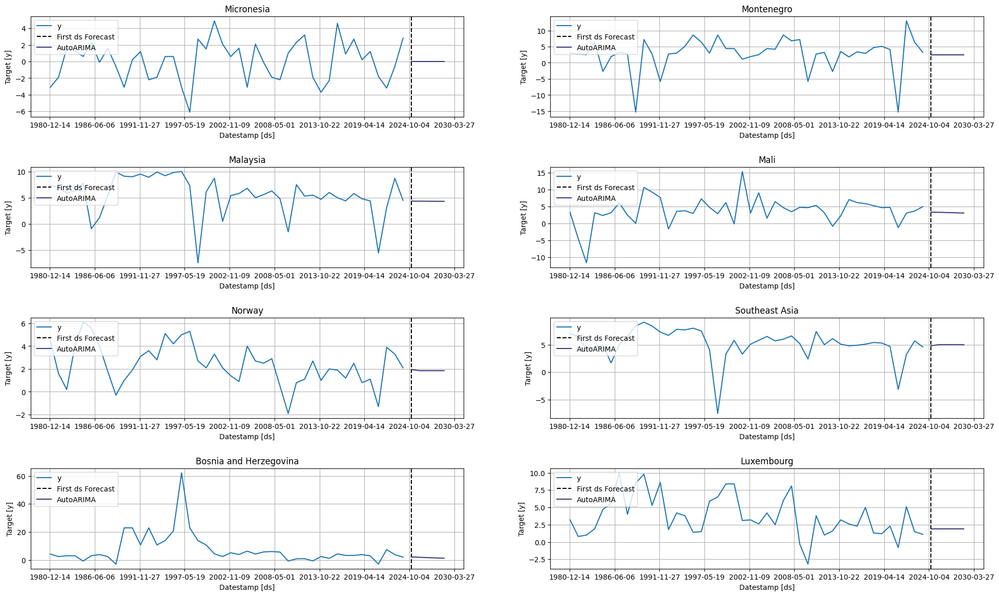

In [179]:
arima_sf.plot(long_forecasting_df,arima_forecasts_df)

## 4.3. Modelos da biblioteca `statsforecast`

Agora, o *forecasting* será feito utilizando diversos modelos, visando comparar a eficiência de cada modelo e no fim, escolhendo o modelo ideal para cada série com base na comparação com os dados já existentes.

In [180]:
from statsforecast.models import (
    AutoARIMA,
    AutoETS,
    SimpleExponentialSmoothingOptimized,
    HistoricAverage,
    RandomWalkWithDrift
)

models = [
    AutoARIMA(season_length=1),
    AutoETS(season_length=1),
    SimpleExponentialSmoothingOptimized(),
    HistoricAverage(),
    RandomWalkWithDrift()
]

sf = StatsForecast(
    df=long_forecasting_df, 
    models=models,
    freq='A', 
    n_jobs=-1
)

In [181]:
forecasts_df = sf.forecast(h=5)

forecasts_df.head()

,ds,AutoARIMA,AutoETS,SESOpt,HistoricAverage,RWD
unique_id,,,,,,
ASEAN-5,2024-12-31,4.032939,5.025013,3.941006,5.027273,4.425581
ASEAN-5,2025-12-31,4.022299,5.025013,3.941006,5.027273,4.351163
ASEAN-5,2026-12-31,4.011687,5.025013,3.941006,5.027273,4.276744
ASEAN-5,2027-12-31,4.001103,5.025013,3.941006,5.027273,4.202325
ASEAN-5,2028-12-31,3.990547,5.025013,3.941006,5.027273,4.127907


In [182]:
forecasts_df

,ds,AutoARIMA,AutoETS,SESOpt,HistoricAverage,RWD
unique_id,,,,,,
ASEAN-5,2024-12-31,4.032939,5.025013,3.941006,5.027273,4.425581
ASEAN-5,2025-12-31,4.022299,5.025013,3.941006,5.027273,4.351163
ASEAN-5,2026-12-31,4.011687,5.025013,3.941006,5.027273,4.276744
ASEAN-5,2027-12-31,4.001103,5.025013,3.941006,5.027273,4.202325
ASEAN-5,2028-12-31,3.990547,5.025013,3.941006,5.027273,4.127907
...,...,...,...,...,...,...
Zimbabwe,2024-12-31,1.644208,2.266041,2.352698,0.609091,2.441860
Zimbabwe,2025-12-31,0.000000,2.266041,2.352698,0.609091,2.383721
Zimbabwe,2026-12-31,0.000000,2.266041,2.352698,0.609091,2.325581


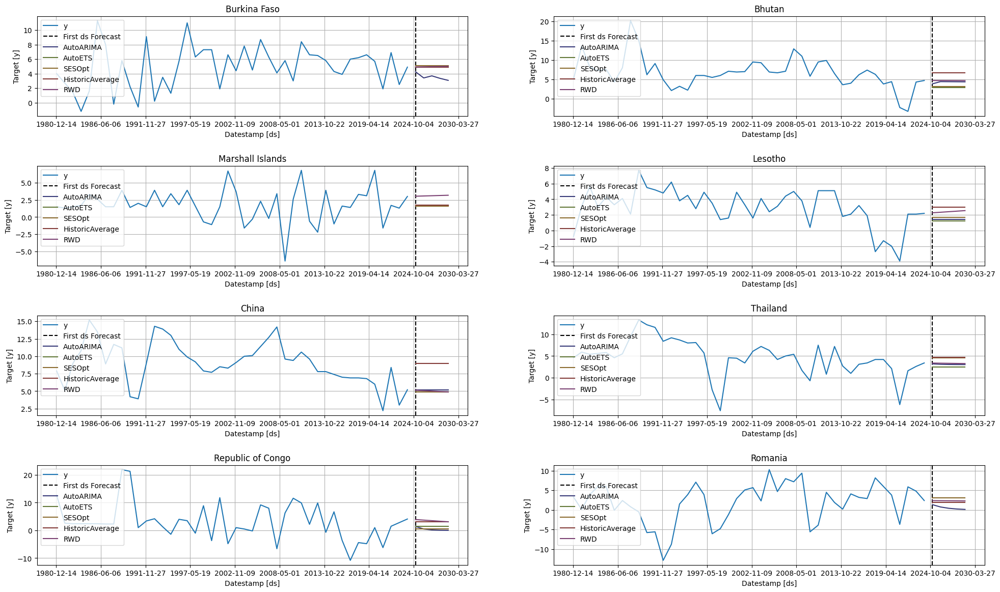

In [183]:
sf.plot(long_forecasting_df,forecasts_df)

In [184]:
forecast_comparison_df = forecasts_df.merge(long_comparison_df, on = ['unique_id','ds'])

In [185]:
forecast_comparison_df

,ds,AutoARIMA,AutoETS,SESOpt,HistoricAverage,RWD,y
unique_id,,,,,,,
ASEAN-5,2024-12-31,4.032939,5.025013,3.941006,5.027273,4.425581,4.6
ASEAN-5,2025-12-31,4.022299,5.025013,3.941006,5.027273,4.351163,4.6
ASEAN-5,2026-12-31,4.011687,5.025013,3.941006,5.027273,4.276744,4.6
ASEAN-5,2027-12-31,4.001103,5.025013,3.941006,5.027273,4.202325,4.5
ASEAN-5,2028-12-31,3.990547,5.025013,3.941006,5.027273,4.127907,4.6
...,...,...,...,...,...,...,...
Zimbabwe,2024-12-31,1.644208,2.266041,2.352698,0.609091,2.441860,2.6
Zimbabwe,2025-12-31,0.000000,2.266041,2.352698,0.609091,2.383721,2.7
Zimbabwe,2026-12-31,0.000000,2.266041,2.352698,0.609091,2.325581,2.8


Abaixo será criada a função de comparação entre as previsões de cada modelo com as previsões do Statistica, escolhendo o modelo adequado para cada série.

### Esse passo só é possível devido ao problema proposto já entregar dados para a comparação e ser uma etapa do desafio.  Para um caso real, outras metodologias devem ser aplicadas para validação e avaliação do modelo, como backtesting. 

In [186]:
from datasetsforecast.losses import mse, mae, rmse,mape

def evaluate_val_data(df, metric):
    models = df.drop(columns=['ds', 'y']).columns.tolist()
    evals = []
    for model in models:
        eval_ = df.groupby(['unique_id']).apply(lambda x: metric(x['y'].values, x[model].values)).to_frame() # Calculate loss for every unique_id, model and cutoff.
        eval_.columns = [model]
        evals.append(eval_)
    evals = pd.concat(evals, axis=1)
    evals = evals.groupby(['unique_id']).mean(numeric_only=True) # Averages the error metrics for all cutoffs for every combination of model and unique_id
    evals['best_model'] = evals.idxmin(axis=1)
    return evals

A métrica escolhida aqui e que também será aplicada mais para frente no notebook foi o Erro Percentual Médio Absoluto (*Mean Absolute Percentage Error* ou MAPE). MAPE é uma métrica que representa a média do erro percentual absoluto de cada ponto de dado no conjunto para calcular o quão acuradas são as quantidades previstas comparadas ao valor real. Sua fórmula básica é*

`Forecast error percent = [(| actual - forecast | ) / actual] x 100`

É uma métrica com boa interpretabilidade pois é expressa em porcentagem, com quanto menor o valor do MAPE melhor a previsão. Ainda assim, é possível que valores do MAPE ultrapassem 100% ou explodam para valores altos caso o valor real de algum ponto real seja próximo de zero.

In [187]:
mape_evaluation_df = evaluate_val_data(forecast_comparison_df, mape)

mape_evaluation_df.head()

,AutoARIMA,AutoETS,SESOpt,HistoricAverage,RWD,best_model
unique_id,,,,,,
ASEAN-5,12.402221,9.724931,13.945179,9.774264,6.621279,RWD
Advanced economies,38.482158,10.929764,8.662944,34.130785,24.411030,SESOpt
Afghanistan,74.756209,60.876274,236.582739,225.826775,82.704611,AutoETS
Africa (Region),28.769890,24.206210,24.011572,18.432146,11.760674,RWD
Albania,85.702085,16.437984,17.640081,16.340952,35.930024,HistoricAverage


<Axes: xlabel='best_model', ylabel='count'>

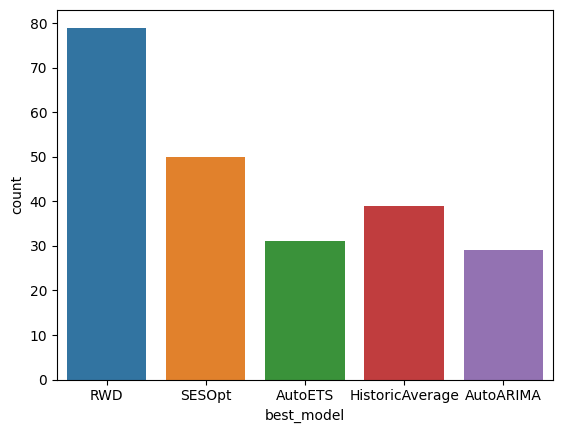

In [188]:
sns.countplot(x = 'best_model',data = mape_evaluation_df)

Daqui já se observa que o modelo `RandomWalkWithDrift` foi o que melhor performou dentre os 5, mesmo sendo um modelo de baseline, seguido pelo modelo de Suavização Exponencial simples. o `Auto-ARIMA` foi o menos performático, aparecendo na mesma proporção que o `Auto-ETS`, que teve desempenho semelhante.

Por exemplo, pegando-se um país dentro do conjunto de dados como Zimbabwe o contraste entre cada modelo fica mais evidente.

In [189]:
mape_evaluation_df.loc['Zimbabwe']

AutoARIMA          87.352245
AutoETS            18.341697
SESOpt             15.218943
HistoricAverage    78.050997
RWD                16.073874
best_model            SESOpt
Name: Zimbabwe, dtype: object

`Auto-ARIMA` e `HistoricAverage` tiveram um erro percentual elevado, sendo o melhor modelo o de suavização exponencial simples. Também pode-se ter o suporte visual para comparação entre as performances, apesar de ser menos clara que a informação numérica.

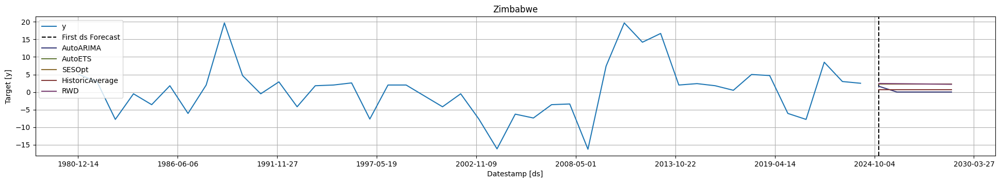

In [190]:
sf.plot(long_forecasting_df,forecasts_df, unique_ids=['Zimbabwe'])

In [191]:
summary_df = mape_evaluation_df.groupby('best_model').size().sort_values().to_frame()

summary_df.reset_index().columns = ["Model", "Nr. of unique_ids"]

In [192]:
summary_df

,0
best_model,
AutoARIMA,29
AutoETS,31
HistoricAverage,39
SESOpt,50
RWD,79


Tem-se portanto a contagem da atribuição dos melhores modelos. 
Os modelos podem ter tido melhor performance tanto por realmente serem os mais adequados às séries temporais, mas também podem ser o reflexo de métodos semelhantes aplicados pelo Statistica para previsão e por isso tiveram resultados aproximados.

Com essa informação, basta filtrar o dataset para conter apenas a melhor previsão para cada país. 

#### A abordagem aqui é diferente da utilizada no pipeline do Kedro.

In [193]:
def get_best_model_forecast(forecasts_df, evaluation_df):
    df = forecasts_df.set_index('ds', append=True).stack().to_frame().reset_index(level=2) # Wide to long 
    df.columns = ['model', 'best_model_forecast'] 
    df = df.join(evaluation_df[['best_model']])
    df = df.query('model.str.replace("-lo-90|-hi-90", "", regex=True) == best_model').copy()
    df.loc[:, 'model'] = [model.replace(bm, 'best_model') for model, bm in zip(df['model'], df['best_model'])]
    df = df.drop(columns='best_model').set_index('model', append=True).unstack()
    df.columns = df.columns.droplevel()
    df = df.reset_index(level=1)
    return df

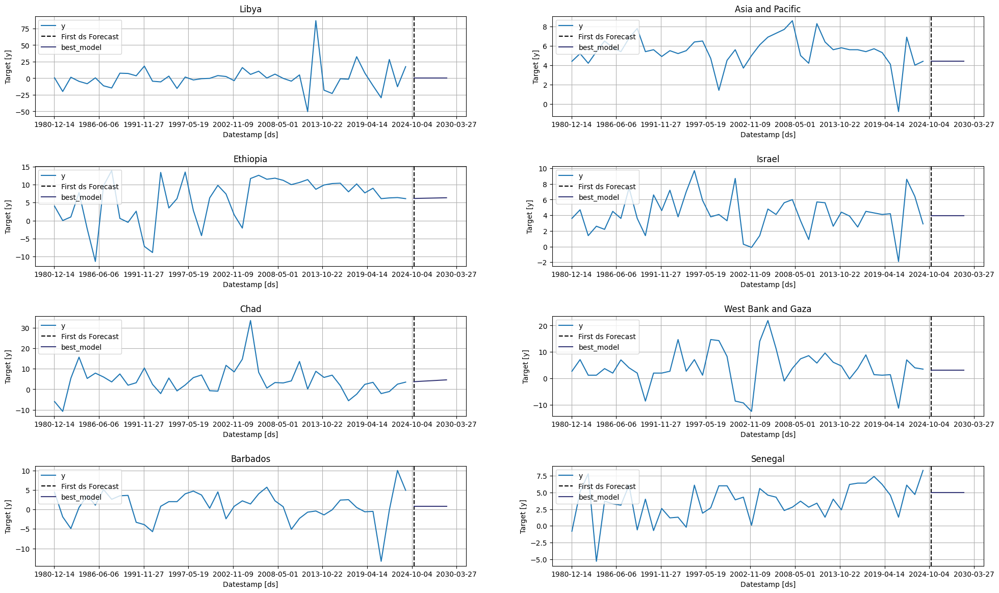

In [194]:
prod_forecasts_df = get_best_model_forecast(forecasts_df, mape_evaluation_df)

sf.plot(long_forecasting_df, prod_forecasts_df)

In [195]:
prod_forecasts_df

model,ds,best_model
unique_id,,
ASEAN-5,2024-12-31,4.425581
ASEAN-5,2025-12-31,4.351163
ASEAN-5,2026-12-31,4.276744
ASEAN-5,2027-12-31,4.202325
ASEAN-5,2028-12-31,4.127907
...,...,...
Zimbabwe,2024-12-31,2.352698
Zimbabwe,2025-12-31,2.352698
Zimbabwe,2026-12-31,2.352698


A partir daqui serão aplicados tratamentos para transformar os datasets de ambas as previsões do formato *long* para *wide*, e assim comparar as três previsões.

In [196]:

arima_forecasts_df = arima_forecasts_df.reset_index()
arima_forecasts_df = arima_forecasts_df.rename(columns = {'AutoARIMA':'y'}) 
arima_forecasts_df

,unique_id,ds,y
0,ASEAN-5,2024-12-31,4.032939
1,ASEAN-5,2025-12-31,4.022299
2,ASEAN-5,2026-12-31,4.011687
3,ASEAN-5,2027-12-31,4.001103
4,ASEAN-5,2028-12-31,3.990547
...,...,...,...
1135,Zimbabwe,2024-12-31,1.644208
1136,Zimbabwe,2025-12-31,0.000000
1137,Zimbabwe,2026-12-31,0.000000
1138,Zimbabwe,2027-12-31,0.000000


In [197]:
models_forecasts = prod_forecasts_df[['ds','best_model']]
models_forecasts

model,ds,best_model
unique_id,,
ASEAN-5,2024-12-31,4.425581
ASEAN-5,2025-12-31,4.351163
ASEAN-5,2026-12-31,4.276744
ASEAN-5,2027-12-31,4.202325
ASEAN-5,2028-12-31,4.127907
...,...,...
Zimbabwe,2024-12-31,2.352698
Zimbabwe,2025-12-31,2.352698
Zimbabwe,2026-12-31,2.352698


In [198]:
models_forecasts = models_forecasts.reset_index()
models_forecasts = models_forecasts.rename(columns = {'best_model':'y'}) 


In [199]:
#my_forecasts = my_forecasts.drop(['index','level_0'],axis = 1)
models_forecasts.columns.name = None
models_forecasts

,unique_id,ds,y
0,ASEAN-5,2024-12-31,4.425581
1,ASEAN-5,2025-12-31,4.351163
2,ASEAN-5,2026-12-31,4.276744
3,ASEAN-5,2027-12-31,4.202325
4,ASEAN-5,2028-12-31,4.127907
...,...,...,...
1135,Zimbabwe,2024-12-31,2.352698
1136,Zimbabwe,2025-12-31,2.352698
1137,Zimbabwe,2026-12-31,2.352698
1138,Zimbabwe,2027-12-31,2.352698


In [200]:
complete_ARIMA_long_df = pd.concat([long_forecasting_df,arima_forecasts_df], ignore_index = True)

complete_ARIMA_long_df.columns = ['Country','Year','GDP index']

complete_ARIMA_long_df['Year'] = complete_ARIMA_long_df['Year'].dt.strftime('%Y')

complete_ARIMA_long_df

,Country,Year,GDP index
0,Afghanistan,1980,5.4
1,Albania,1980,2.7
2,Algeria,1980,-5.4
3,Andorra,1980,3.7
4,Angola,1980,2.4
...,...,...,...
11167,Zimbabwe,2024,1.644208
11168,Zimbabwe,2025,0.0
11169,Zimbabwe,2026,0.0
11170,Zimbabwe,2027,0.0


In [201]:
complete_models_long_df = pd.concat([long_forecasting_df,models_forecasts], ignore_index = True)

complete_models_long_df.columns = ['Country','Year','GDP index']

complete_models_long_df['Year'] = complete_models_long_df['Year'].dt.strftime('%Y')

complete_models_long_df

,Country,Year,GDP index
0,Afghanistan,1980,5.4
1,Albania,1980,2.7
2,Algeria,1980,-5.4
3,Andorra,1980,3.7
4,Angola,1980,2.4
...,...,...,...
11167,Zimbabwe,2024,2.352698
11168,Zimbabwe,2025,2.352698
11169,Zimbabwe,2026,2.352698
11170,Zimbabwe,2027,2.352698


In [202]:
ARIMA_wide_df = pd.pivot(complete_ARIMA_long_df, index= 'Country', columns= 'Year', values= 'GDP index')
ARIMA_wide_df = ARIMA_wide_df.T
ARIMA_wide_df.tail()

Country,ASEAN-5,Advanced economies,Afghanistan,Africa (Region),Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,...,Vanuatu,Venezuela,Vietnam,West Bank and Gaza,Western Europe,Western Hemisphere (Region),World,Yemen,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,
2024,4.032939,0.343098,0.699359,3.181782,2.359156,1.667565,2.807873,2.313029,2.289777,0.050215,...,2.568959,2.690828,1.934934,1.611104,1.439012,2.096942,1.478746,-2.038405,3.124872,1.644208
2025,4.022299,2.43141,0.185504,3.134287,0.0,1.069528,2.807873,2.064866,0.953287,0.012608,...,2.568958,1.448111,1.632109,0.741616,1.435152,2.093499,3.672335,-2.038405,3.124872,0.0
2026,4.011687,1.722574,0.942732,3.087501,0.0,0.685964,2.807873,1.843328,0.396875,0.003165,...,2.568957,0.779324,1.376677,0.341377,1.431302,2.090062,2.876029,-2.038405,3.124872,0.0
2027,4.001103,1.218637,0.440648,3.041413,0.0,0.439958,2.807873,1.645558,0.165228,0.000795,...,2.568957,0.419405,1.161221,0.157141,1.427463,2.086631,2.499722,-2.038405,3.124872,0.0
2028,3.990547,1.076341,0.468784,2.996014,0.0,0.282176,2.807873,1.469007,0.068788,0.0002,...,2.568956,0.225709,0.979485,0.072334,1.423634,2.083205,2.290861,-2.038405,3.124872,0.0


In [203]:
models_wide_df = pd.pivot(complete_models_long_df, index= 'Country', columns= 'Year', values= 'GDP index')
models_wide_df = models_wide_df.T
models_wide_df.tail()

Country,ASEAN-5,Advanced economies,Afghanistan,Africa (Region),Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,...,Vanuatu,Venezuela,Vietnam,West Bank and Gaza,Western Europe,Western Hemisphere (Region),World,Yemen,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,
2024,4.425581,1.735889,1.167606,3.742955,2.827273,2.441543,1.244186,3.525581,3.347727,1.811364,...,3.453488,3.754441,6.016279,3.140727,1.439012,2.096942,3.157328,1.606818,4.002326,2.352698
2025,4.351163,1.735889,1.167606,3.78591,2.827273,2.441543,1.188372,3.551163,3.347727,1.811364,...,3.406977,3.754441,6.232558,3.140727,1.435152,2.093499,3.157328,1.606818,4.004651,2.352698
2026,4.276744,1.735889,1.167606,3.828865,2.827273,2.441543,1.132558,3.576744,3.347727,1.811364,...,3.360465,3.754441,6.448837,3.140727,1.431302,2.090062,3.157328,1.606818,4.006977,2.352698
2027,4.202325,1.735889,1.167606,3.871819,2.827273,2.441543,1.076744,3.602326,3.347727,1.811364,...,3.313953,3.754441,6.665116,3.140727,1.427463,2.086631,3.157328,1.606818,4.009302,2.352698
2028,4.127907,1.735889,1.167606,3.914774,2.827273,2.441543,1.02093,3.627907,3.347727,1.811364,...,3.267442,3.754441,6.881395,3.140727,1.423634,2.083205,3.157328,1.606818,4.011628,2.352698


Com isso, já é possível traçar um comparativo das performances dos modelos. Isso será feito primeiro visualmente e depois utilizando métricas como o MAPE.

Para o comparativo visual será construída uma lista com países de cada grupo sendo escolhidos aleatoriamente, permitindo ter uma visão geral das predições.

In [204]:
full_df.index = full_df['Year']; full_df = full_df.drop('Year',axis = 1)
full_df

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
Year,,,,,,,,,,,,,,,,,,,,,
1980,5.4,2.7,-5.4,3.7,2.4,8.2,0.7,8.0,4.2,2.9,...,-0.8,3.3,1.848869,1.8,6.4,0.9,-1.9,3.8,1.848869,2.1
1981,2.2,5.7,3.0,4.5,-4.4,3.8,-5.7,4.7,-0.9,4.1,...,-0.5,1.9,1.672786,0.1,0.9,2.0,-0.2,4.2,1.672786,1.9
1982,11.8,2.9,6.4,1.5,0.0,-0.1,-3.1,5.5,1.2,0.1,...,1.4,1.5,0.616290,0.6,-0.5,-0.1,0.4,2.2,0.616290,0.7
1983,14.0,1.1,5.4,1.5,4.2,5.4,3.7,3.2,3.4,-0.5,...,4.6,1.8,2.289075,1.7,-2.8,3.3,0.7,4.0,2.289075,2.6
1984,2.2,2.0,5.6,8.7,6.0,10.2,2.0,3.2,7.7,6.3,...,4.1,4.1,4.049903,2.5,3.9,5.0,0.3,6.6,4.049903,4.6
1985,11.8,-1.5,5.6,8.7,3.5,7.6,-7.0,3.2,3.6,5.5,...,2.4,3.5,3.169489,2.2,3.2,3.8,1.2,4.3,3.169489,3.6
1986,2.2,5.6,-0.2,4.5,2.9,11.5,7.1,5.2,4.2,2.4,...,4.4,4.3,3.169489,2.7,4.3,3.0,2.0,5.5,3.169489,3.6
1987,1.0,-0.8,-0.7,8.1,4.1,6.6,2.5,5.5,16.1,4.9,...,5.0,4.0,3.433613,2.6,3.3,3.5,-0.1,6.5,3.433613,3.9
1988,3.9,-1.4,-1.9,3.7,6.1,5.2,-2.0,6.3,18.6,4.3,...,1.6,4.5,4.137944,3.8,1.1,4.7,3.3,5.5,4.137944,4.7


In [205]:
full_df.tail()

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
Year,,,,,,,,,,,,,,,,,,,,,
2024,5.7,3.3,2.6,1.5,3.7,5.4,2.0,5.0,1.2,1.7,...,2.5,4.2,1.4,1.6,2.2,1.1,3.5,2.2,4.2,3.0
2025,2.7,3.4,2.2,1.5,4.0,4.1,2.0,4.5,1.2,2.1,...,2.5,4.0,1.9,2.2,2.3,1.7,3.6,2.3,4.1,3.2
2026,1.2,3.4,2.1,1.5,4.1,2.7,2.0,4.5,1.1,2.2,...,2.4,4.0,1.7,2.0,2.6,1.8,3.6,2.3,4.2,3.2
2027,-2.4,3.4,1.7,1.5,4.2,2.7,2.0,4.5,1.1,2.3,...,2.3,3.9,1.5,1.8,2.3,1.7,3.7,2.2,4.3,3.1
2028,1.0,3.4,1.8,1.5,4.2,2.7,2.0,4.5,1.1,2.3,...,2.3,3.9,1.4,1.7,2.3,1.6,3.7,2.3,4.4,3.0


In [206]:
#Aplicação do tratamento para evitar os valores iguais a 0.
full_df.loc[2025,'Ukraine'] = 2.4

full_df.loc[2028,'Ukraine'] = 2.4

In [207]:
full_df['Ukraine']

Year
1980   -15.1
1981    -3.0
1982    -0.2
1983     2.2
1984     3.4
1985     0.2
1986     3.1
1987     2.4
1988     2.4
1989    -3.0
1990    -9.9
1991   -15.1
1992    -9.9
1993   -14.2
1994   -22.9
1995   -12.2
1996   -10.0
1997    -3.0
1998    -1.9
1999    -0.2
2000     5.9
2001     8.8
2002     5.3
2003     9.5
2004    11.8
2005     3.1
2006     7.6
2007     8.2
2008     2.2
2009   -15.1
2010     4.1
2011     5.5
2012     0.2
2013     0.0
2014    -6.6
2015    -9.8
2016     2.4
2017     2.4
2018     3.5
2019     3.2
2020    -3.8
2021     3.4
2022   -30.3
2023    -3.0
2024     2.4
2025     2.4
2026     2.4
2027     2.4
2028     2.4
Name: Ukraine, dtype: float64

In [208]:
import random
random_countries = []
for group in updated_economic_groups:
    if len(group) > 5:
        random_choices = random.choices(group,k = 5)
    else: 
        random_choices = random.choices(group,k = 3)
    random_countries.extend(random_choices)
random_countries   

['Germany',
 'Japan',
 'Germany',
 'Canada',
 'Canada',
 'New Zealand',
 'Denmark',
 'Sweden',
 'Singapore',
 'Israel',
 'Cyprus',
 'Slovenia',
 'Spain',
 'Cyprus',
 'Spain',
 'Thailand',
 'Philippines',
 'Malaysia',
 'Cyprus',
 'The Netherlands',
 'Slovenia',
 'Spain',
 'Belgium',
 'Myanmar',
 'Brunei Darussalam',
 'Mongolia',
 'Pacific Islands ',
 'Bangladesh',
 'Western Europe',
 'Albania',
 'Hungary',
 'North Macedonia',
 'Albania',
 'Jamaica',
 'Antigua and Barbuda',
 'Dominican Republic',
 'South America',
 'Chile',
 'Pakistan',
 'Kazakhstan',
 'Lebanon',
 'Libya',
 'Somalia',
 "Côte d'Ivoire",
 'Ethiopia',
 'Zambia',
 'Uganda',
 'South Africa']

In [209]:
len(random_countries)

48

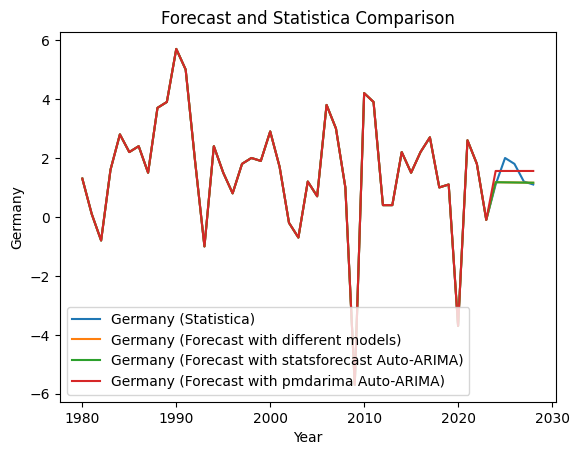

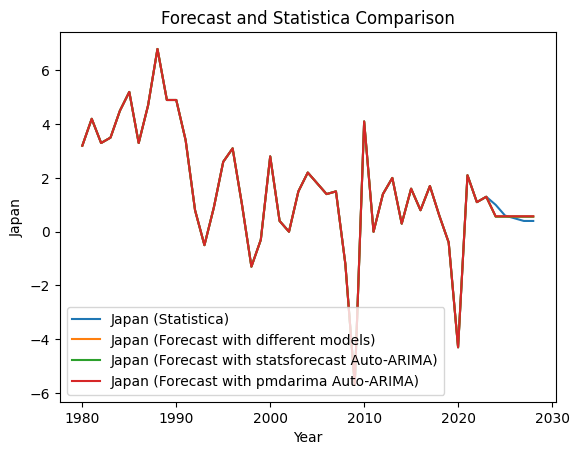

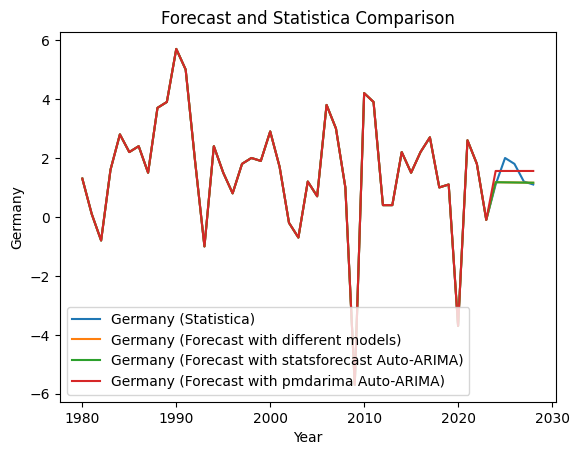

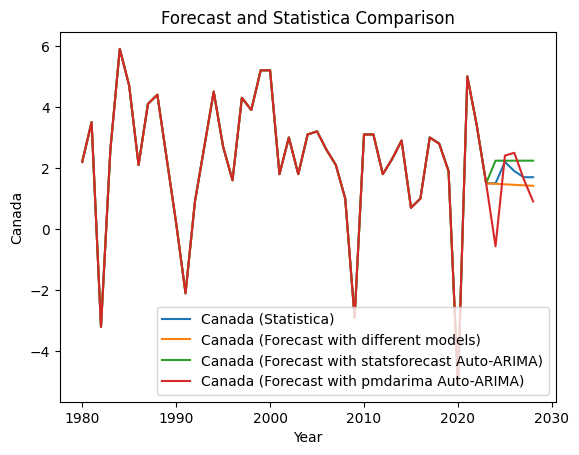

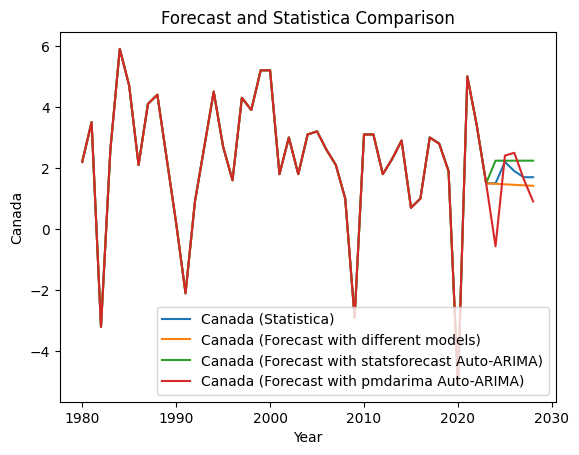

...

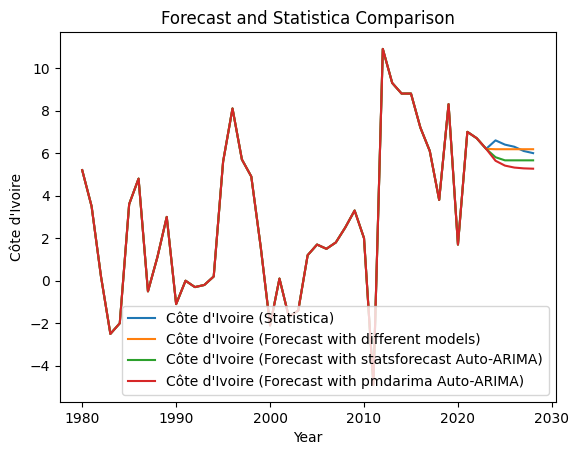

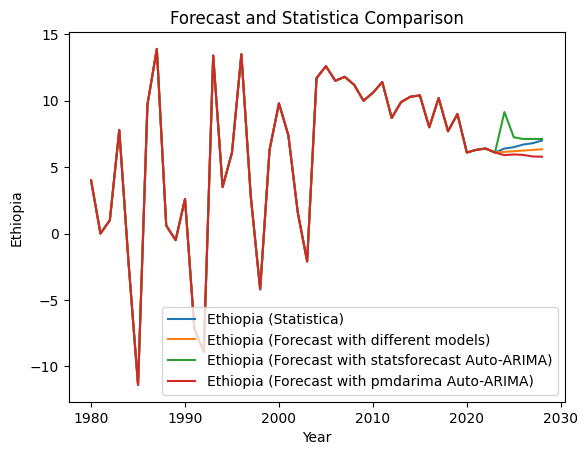

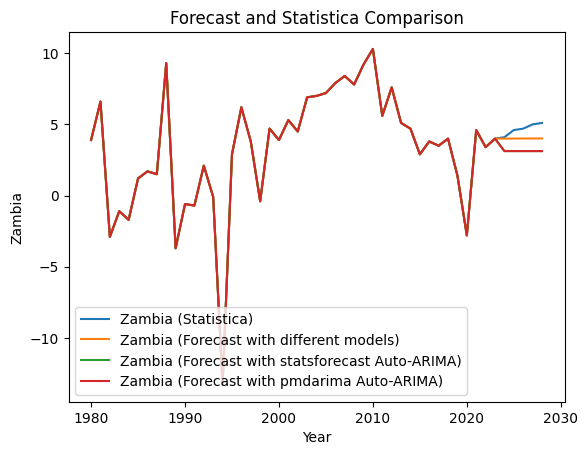

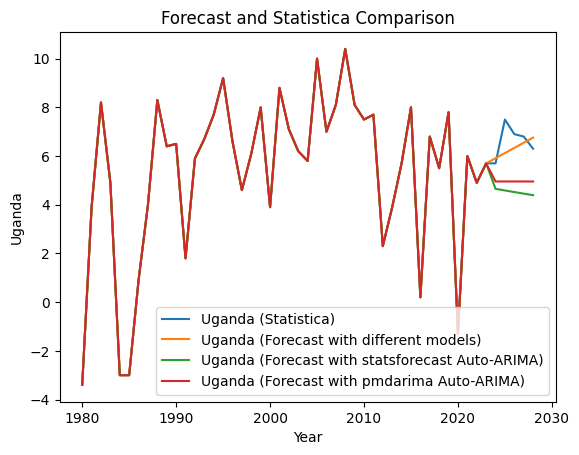

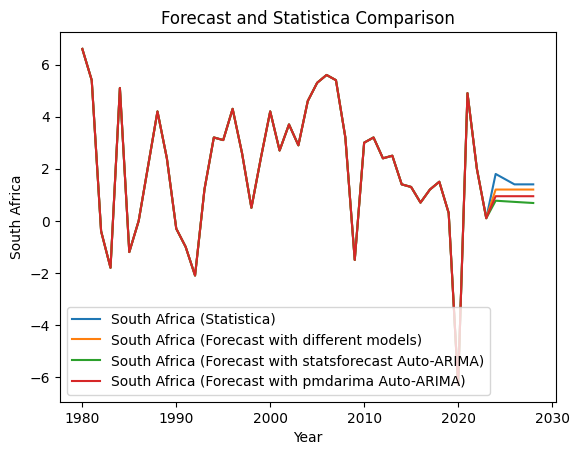

In [210]:
for country in random_countries:
    plt.figure()
    sns.lineplot(x = full_df.index, y = country, data = full_df, label = f'{country} (Statistica)')
    sns.lineplot(x = models_wide_df.index.astype(int), y = country, data = models_wide_df,label = f'{country} (Forecast with different models)')
    sns.lineplot(x = ARIMA_wide_df.index.astype(int), y = country, data = ARIMA_wide_df,label = f'{country} (Forecast with statsforecast Auto-ARIMA)')
    sns.lineplot(x = auto_arima_df.index.astype(int), y = country, data = auto_arima_df,label = f'{country} (Forecast with pmdarima Auto-ARIMA)')
    
    plt.title('Forecast and Statistica Comparison')
    # Show/save figure as desired.
    plt.show()

Visualmente a previsão utilizando vários modelos com a biblioteca statsforecast performou melhor. A perfomance do `Auto-ARIMA` tanto da mesma biblioteca quanto do `pmdarima` apresentam algumas previsões diferentes do esperado, com esse último performando até pior em alguns casos. 

Além disso, também será aplicada a métrica MAPE para uma melhor interpretabilidade desses resultados, não ficando restrito apenas à interpretação visual.

In [211]:
models_df = models_wide_df.tail()
stats_arima_df = ARIMA_wide_df.tail()
pmd_arima_df = auto_arima_df.tail()
statistica_df = full_df.tail()

models_df = models_df.T
stats_arima_df = stats_arima_df.T
pmd_arima_df = pmd_arima_df.T
statistica_df = statistica_df.T

In [212]:
models_df

Year,2024,2025,2026,2027,2028
Country,,,,,
ASEAN-5,4.425581,4.351163,4.276744,4.202325,4.127907
Advanced economies,1.735889,1.735889,1.735889,1.735889,1.735889
Afghanistan,1.167606,1.167606,1.167606,1.167606,1.167606
Africa (Region),3.742955,3.78591,3.828865,3.871819,3.914774
Albania,2.827273,2.827273,2.827273,2.827273,2.827273
...,...,...,...,...,...
Western Hemisphere (Region),2.096942,2.093499,2.090062,2.086631,2.083205
World,3.157328,3.157328,3.157328,3.157328,3.157328
Yemen,1.606818,1.606818,1.606818,1.606818,1.606818


In [213]:
statistica_df.columns = statistica_df.columns.astype(str)

In [214]:
statistica_df.columns

Index(['2024', '2025', '2026', '2027', '2028'], dtype='object', name='Year')

In [215]:
statistica_models_df = statistica_df.merge(models_df,left_index = True,right_index = True,suffixes = ('_stat','_models')) 
statistica_s_arima_df = statistica_df.merge(stats_arima_df,left_index = True,right_index = True,suffixes = ('_stat','_arima'))
statistica_pmd_arima_df = statistica_df.merge(pmd_arima_df,left_index = True,right_index = True,suffixes = ('_stat','_pmdarima'))

In [216]:
statistica_models_df

Year,2024_stat,2025_stat,2026_stat,2027_stat,2028_stat,2024_models,2025_models,2026_models,2027_models,2028_models
Afghanistan,5.7,2.7,1.2,-2.4,1.0,1.167606,1.167606,1.167606,1.167606,1.167606
Albania,3.3,3.4,3.4,3.4,3.4,2.827273,2.827273,2.827273,2.827273,2.827273
Algeria,2.6,2.2,2.1,1.7,1.8,2.441543,2.441543,2.441543,2.441543,2.441543
Andorra,1.5,1.5,1.5,1.5,1.5,1.244186,1.188372,1.132558,1.076744,1.02093
Angola,3.7,4.0,4.1,4.2,4.2,3.525581,3.551163,3.576744,3.602326,3.627907
...,...,...,...,...,...,...,...,...,...,...
Major advanced economies (G7),1.1,1.7,1.8,1.7,1.6,1.684339,1.684339,1.684339,1.684339,1.684339
Middle East and Central Asia,3.5,3.6,3.6,3.7,3.7,3.390216,3.390216,3.390216,3.390216,3.390216
Other advanced economies,2.2,2.3,2.3,2.2,2.3,2.551328,2.551328,2.551328,2.551328,2.551328
Sub-Saharan Africa,4.2,4.1,4.2,4.3,4.4,3.640724,3.681448,3.722172,3.762896,3.80362


Aqui também será utilizado o MAPE como métrica de validação. O Erro Percentual Absoluto (APE) será aplicado entre cada ano de cada país para maior granularidade e posteriormente a média será calculada.

In [217]:
statistica_models_df['APE_2024'] = abs((statistica_models_df['2024_stat'] - statistica_models_df['2024_models']) / statistica_models_df['2024_stat'])
statistica_models_df['APE_2025'] = abs((statistica_models_df['2025_stat'] - statistica_models_df['2025_models']) / statistica_models_df['2025_stat'])
statistica_models_df['APE_2026'] = abs((statistica_models_df['2026_stat'] - statistica_models_df['2026_models']) / statistica_models_df['2026_stat'])
statistica_models_df['APE_2027'] = abs((statistica_models_df['2027_stat'] - statistica_models_df['2027_models']) / statistica_models_df['2027_stat'])
statistica_models_df['APE_2028'] = abs((statistica_models_df['2028_stat'] - statistica_models_df['2028_models']) / statistica_models_df['2028_stat'])

In [218]:
statistica_s_arima_df['APE_2024'] = abs((statistica_s_arima_df['2024_stat'] - statistica_s_arima_df['2024_arima']) / statistica_s_arima_df['2024_stat'])
statistica_s_arima_df['APE_2025'] = abs((statistica_s_arima_df['2025_stat'] - statistica_s_arima_df['2025_arima']) / statistica_s_arima_df['2025_stat'])
statistica_s_arima_df['APE_2026'] = abs((statistica_s_arima_df['2026_stat'] - statistica_s_arima_df['2026_arima']) / statistica_s_arima_df['2026_stat'])
statistica_s_arima_df['APE_2027'] = abs((statistica_s_arima_df['2027_stat'] - statistica_s_arima_df['2027_arima']) / statistica_s_arima_df['2027_stat'])
statistica_s_arima_df['APE_2028'] = abs((statistica_s_arima_df['2028_stat'] - statistica_s_arima_df['2028_arima']) / statistica_s_arima_df['2028_stat'])

In [219]:
statistica_pmd_arima_df['APE_2024'] = abs((statistica_pmd_arima_df['2024_stat'] - statistica_pmd_arima_df['2024_pmdarima']) / statistica_pmd_arima_df['2024_stat'])
statistica_pmd_arima_df['APE_2025'] = abs((statistica_pmd_arima_df['2025_stat'] - statistica_pmd_arima_df['2025_pmdarima']) / statistica_pmd_arima_df['2025_stat'])
statistica_pmd_arima_df['APE_2026'] = abs((statistica_pmd_arima_df['2026_stat'] - statistica_pmd_arima_df['2026_pmdarima']) / statistica_pmd_arima_df['2026_stat'])
statistica_pmd_arima_df['APE_2027'] = abs((statistica_pmd_arima_df['2027_stat'] - statistica_pmd_arima_df['2027_pmdarima']) / statistica_pmd_arima_df['2027_stat'])
statistica_pmd_arima_df['APE_2028'] = abs((statistica_pmd_arima_df['2028_stat'] - statistica_pmd_arima_df['2028_pmdarima']) / statistica_pmd_arima_df['2028_stat'])

In [220]:
statistica_models_df

Year,2024_stat,2025_stat,2026_stat,2027_stat,2028_stat,2024_models,2025_models,2026_models,2027_models,2028_models,APE_2024,APE_2025,APE_2026,APE_2027,APE_2028
Afghanistan,5.7,2.7,1.2,-2.4,1.0,1.167606,1.167606,1.167606,1.167606,1.167606,0.795157,0.567553,0.026995,1.486502,0.167606
Albania,3.3,3.4,3.4,3.4,3.4,2.827273,2.827273,2.827273,2.827273,2.827273,0.143251,0.168449,0.168449,0.168449,0.168449
Algeria,2.6,2.2,2.1,1.7,1.8,2.441543,2.441543,2.441543,2.441543,2.441543,0.060945,0.109792,0.16264,0.436202,0.356413
Andorra,1.5,1.5,1.5,1.5,1.5,1.244186,1.188372,1.132558,1.076744,1.02093,0.170543,0.207752,0.244961,0.282171,0.31938
Angola,3.7,4.0,4.1,4.2,4.2,3.525581,3.551163,3.576744,3.602326,3.627907,0.04714,0.112209,0.127623,0.142303,0.136213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Major advanced economies (G7),1.1,1.7,1.8,1.7,1.6,1.684339,1.684339,1.684339,1.684339,1.684339,0.531217,0.009213,0.064256,0.009213,0.052712
Middle East and Central Asia,3.5,3.6,3.6,3.7,3.7,3.390216,3.390216,3.390216,3.390216,3.390216,0.031367,0.058273,0.058273,0.083725,0.083725
Other advanced economies,2.2,2.3,2.3,2.2,2.3,2.551328,2.551328,2.551328,2.551328,2.551328,0.159695,0.109273,0.109273,0.159695,0.109273
Sub-Saharan Africa,4.2,4.1,4.2,4.3,4.4,3.640724,3.681448,3.722172,3.762896,3.80362,0.133161,0.102086,0.113769,0.124908,0.135541


In [221]:
mape_models_2024 = statistica_models_df['APE_2024'].mean() ;mape_models_2025 = statistica_models_df['APE_2025'].mean() ;mape_models_2026 = statistica_models_df['APE_2026'].mean() ;mape_models_2027 = statistica_models_df['APE_2027'].mean() ;mape_models_2028 = statistica_models_df['APE_2028'].mean()

mape_stats_arima_2024 = statistica_s_arima_df['APE_2024'].mean() ;mape_stats_arima_2025 = statistica_s_arima_df['APE_2025'].mean() ;mape_stats_arima_2026 = statistica_s_arima_df['APE_2026'].mean() ;mape_stats_arima_2027 = statistica_s_arima_df['APE_2027'].mean() ;mape_stats_arima_2028 = statistica_s_arima_df['APE_2028'].mean()

mape_pmd_arima_2024 = statistica_pmd_arima_df['APE_2024'].mean() ;mape_pmd_arima_2025 = statistica_pmd_arima_df['APE_2025'].mean() ;mape_pmd_arima_2026 = statistica_pmd_arima_df['APE_2026'].mean() ;mape_pmd_arima_2027 = statistica_pmd_arima_df['APE_2027'].mean() ;mape_pmd_arima_2028 = statistica_pmd_arima_df['APE_2028'].mean()

d = {'Models':[mape_models_2024,mape_models_2025,mape_models_2026,mape_models_2027,mape_models_2028],
     'Stats Arima':[mape_stats_arima_2024,mape_stats_arima_2025,mape_stats_arima_2026,mape_stats_arima_2027,mape_stats_arima_2028],
     'pmd Arima':[mape_pmd_arima_2024,mape_pmd_arima_2025,mape_pmd_arima_2026,mape_pmd_arima_2027,mape_pmd_arima_2028]}

In [222]:
pd.DataFrame(d, index = np.arange(2024,2029,1))

,Models,Stats Arima,pmd Arima
2024,0.239835,0.531652,0.612414
2025,0.185948,0.582793,0.641156
2026,0.175986,0.552445,0.586088
2027,0.187998,0.686158,0.799661
2028,0.189371,0.662481,0.925358


In [223]:
pd.DataFrame(d, index = np.arange(2024,2029,1))

,Models,Stats Arima,pmd Arima
2024,0.239835,0.531652,0.612414
2025,0.185948,0.582793,0.641156
2026,0.175986,0.552445,0.586088
2027,0.187998,0.686158,0.799661
2028,0.189371,0.662481,0.925358


O `Auto-ARIMA` da biblioteca `pmdarima` performou pior no geral que os outros dois modelos, ainda ficando próximo do erro do `Auto-ARIMA` do `statsforecast`. A performance da abordagem de múltiplos modelos de longe foi a de melhor eficiência, com erro médio máximo de 24%. 
Por fim, é interessante ver quais países ficaram acima da média por ano para averiguar quais compunham a lista de países que tiveram dados imputados.

In [224]:
above_2024 = statistica_models_df.query('`APE_2024`> 0.24').index

above_2025 = statistica_models_df.query('`APE_2025`> 0.19').index

above_2026 = statistica_models_df.query('`APE_2026`> 0.19').index

above_2027 = statistica_models_df.query('`APE_2027`> 0.2').index

above_2028 = statistica_models_df.query('`APE_2028`> 0.2').index

In [225]:
print('Percentage of above average APE countries for each year')
print(100*len(above_2024)/228,100*len(above_2025)/228,100*len(above_2026)/228,100*len(above_2027)/228,100*len(above_2028)/228)

Percentage of above average APE countries for each year
32.01754385964912 33.333333333333336 30.263157894736842 28.07017543859649 30.70175438596491


Países cujo erro percentual das previsões foram acima da média representam cerca de 30% do total para cada ano. Isso engloba tanto os casos em que o APE foi pouco maior que a média quanto os casos cujo APE estourou para valores altos, ultrapassando 100% por exemplo. 

Desses, é interessante saber quantos são países que tiveram dados imputados, o que dependendo da quantidade pode sugerir que a imputação pode ter causado um maior erro devido ao *fit* dos modelos ter ser feito com dados problemáticos.

In [226]:
# lista de países originalmente com dados faltantes

all_missing_countries = new_df.columns[new_df.isna().any()].tolist()
len(all_missing_countries)

62

In [227]:
#função para fazer a contagem dos países que tiveram dados imputados nas listas de países com MAPE acima da média

def count_imputed_countries_in_lists(lists_above_average, imputed_countries):
    counts = {}
    
    for idx, country_list in enumerate(lists_above_average):
        count = sum(1 for country in imputed_countries if country in country_list)
        percentage = (count / len(country_list)) * 100
        counts[f"202{idx+4}"] = {"count": count, "percentage": percentage}
    
    return counts

lists_above_average = [above_2024 ,above_2025 ,above_2026 ,above_2027 ,above_2028]

counts = count_imputed_countries_in_lists(lists_above_average, all_missing_countries)

for key, value in counts.items():
    count = value["count"]
    percentage = value["percentage"]
    print(f"Number of imputed countries above the average APE in {key}: {count} ({percentage:.2f}%)")

Number of imputed countries above the average APE in 2024: 18 (24.66%)
Number of imputed countries above the average APE in 2025: 31 (40.79%)
Number of imputed countries above the average APE in 2026: 28 (40.58%)
Number of imputed countries above the average APE in 2027: 24 (37.50%)
Number of imputed countries above the average APE in 2028: 23 (32.86%)


Percebe-se que os países imputados não chegam a 50% dos países com APE acima da média em cada ano, o que pode indicar mais uma característica dos próprios dados do que algo causado pelos métodos de imputação. Ainda assim, estão presentes em todos os anos. Como as imputações utilizaram dados de outros países, o *fit* dos modelos pode ter sido semelhante ao desses países que foram utilizados para a imputação e apresentaram erro alto, reproduzindo essa tendência. 
Ainda assim, é uma suposição que pede por uma investigação mais profunda que já foge ao escopo desse projeto.

Dito isso, essa abordagem foi possível somente porque **dados para comparação já estavam disponíveis** e permitiram efetuar a comparação com os resultados dos modelos, selecionando o melhor para cada caso. Em um caso de forecasting puro, outros métodos de avaliação de modelo e previsões devem ser usados, como validação cruzada, backtesting etc.

Além disso, esse problema pede um modelo de natureza mais exploratória, não visando um caso de produtização do modelo. Caso isso fosse pedido para o projeto, outras análises deveriam ser levadas em conta, como interação com a infraestrutura e como os dados desconhecidos serão injetados no modelo. Sendo assim, para casos assim outros modelos e técnicas de ciência de dados podem ser mais apropriadas.

Abaixo, o dataset final da análise.

In [228]:
final_df = models_wide_df

final_df

Country,ASEAN-5,Advanced economies,Afghanistan,Africa (Region),Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,...,Vanuatu,Venezuela,Vietnam,West Bank and Gaza,Western Europe,Western Hemisphere (Region),World,Yemen,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,
1980,7.7,1.3,5.4,1.852941,2.7,-5.4,3.7,2.4,8.2,0.7,...,5.5,-4.9,-3.5,2.7,1.6,2.2,2.1,4.8,3.9,5.0
1981,6.5,2.0,2.2,1.558824,5.7,3.0,4.5,-4.4,3.8,-5.7,...,4.4,-1.3,5.8,7.1,0.3,2.0,1.9,3.8,6.6,2.9
1982,3.8,0.2,11.8,2.594118,2.9,6.4,1.5,0.0,-0.1,-3.1,...,2.0,2.6,8.2,1.2,0.7,-1.4,0.7,5.2,-2.9,-7.8
1983,4.5,3.2,14.0,2.4,1.1,5.4,1.5,4.2,5.4,3.7,...,3.0,-9.9,7.1,1.2,1.7,2.1,2.6,3.6,-1.1,-0.5
1984,4.6,4.8,2.2,2.015686,2.0,5.6,8.7,6.0,10.2,2.0,...,9.6,5.2,8.4,3.7,2.5,6.1,4.6,3.6,-1.7,-3.6
1985,1.3,3.7,11.8,4.329412,-1.5,5.6,8.7,3.5,7.6,-7.0,...,1.0,0.9,5.6,2.0,2.6,3.9,3.6,3.9,1.2,1.8
1986,5.2,3.3,2.2,3.009804,5.6,-0.2,4.5,2.9,11.5,7.1,...,-0.1,6.1,3.4,7.0,2.6,3.7,3.6,3.7,1.7,-6.1
1987,6.9,3.8,1.0,3.219608,-0.8,-0.7,8.1,4.1,6.6,2.5,...,-2.9,4.8,2.5,4.0,3.0,3.5,3.9,-12.7,1.5,2.0
1988,8.8,4.8,3.9,5.254902,-1.4,-1.9,3.7,6.1,5.2,-2.0,...,-1.7,6.5,5.1,2.0,4.2,3.3,4.7,2.0,9.3,19.7


De acordo com Aaron O'Neill, expert de pesquisas em dados históricos globais, "*[...]however current estimates suggest that annual growth will return to steady figures of around 3 percent in 2028.*"


Repetindo as mesmas sete séries temporais analisadas na etapa 2.3, pode-se observar as tendências previstas pelos modelos e constratar com essa estimativa dadao por Aaron.

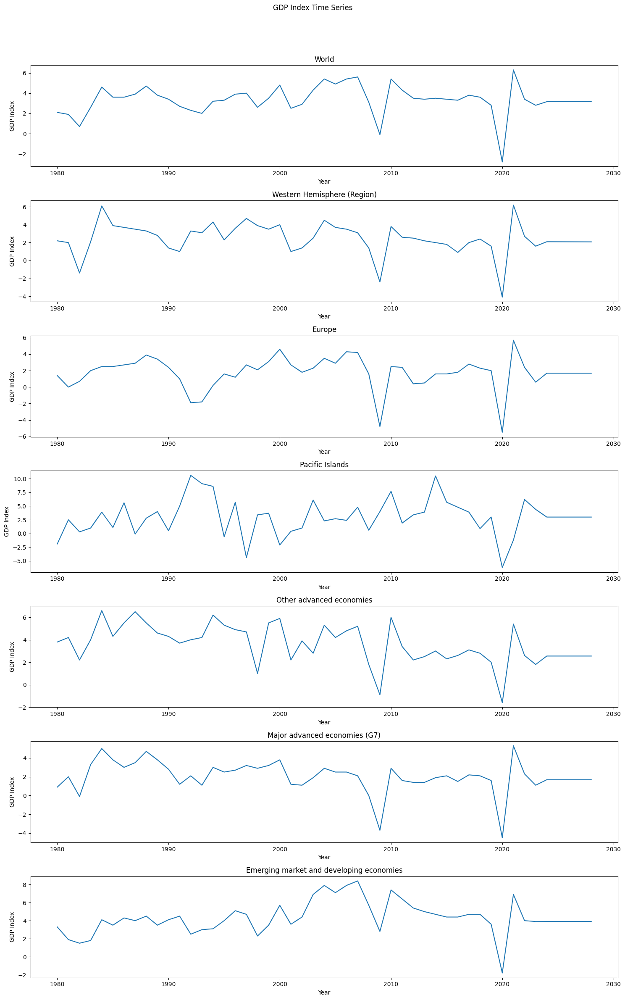

In [233]:
fig, ax = plt.subplots(nrows = 7,figsize=(15,25))
fig.suptitle('GDP Index Time Series')

sns.lineplot(ax = ax[0], x = final_df.index.astype(int), y = "World", data = final_df)
ax[0].set_title('World')
ax[0].set_ylabel('GDP Index')
#ax[0].set_xticks([1980,1990,2000,2010,2020,2030])

sns.lineplot(ax = ax[1], x = final_df.index.astype(int), y = "Western Hemisphere (Region)", data = final_df)
ax[1].set_title('Western Hemisphere (Region)')
ax[1].set_ylabel('GDP Index')
#ax[1].set_xticks([1980,1990,2000,2010,2020,2030])

sns.lineplot(ax = ax[2], x = final_df.index.astype(int), y = "Europe", data = final_df)
ax[2].set_title('Europe')
#ax[2].set_xticks([1980,1990,2000,2010,2020,2030])

ax[2].set_ylabel('GDP Index')
sns.lineplot(ax = ax[3], x = final_df.index.astype(int), y = "Pacific Islands ", data = final_df)
ax[3].set_title('Pacific Islands')
ax[3].set_ylabel('GDP Index')
#ax[3].set_xticks([1980,1990,2000,2010,2020,2030])

sns.lineplot(ax = ax[4], x = final_df.index.astype(int), y = "Other advanced economies", data = final_df)
ax[4].set_title('Other advanced economies')
ax[4].set_ylabel('GDP Index')
#ax[4].set_xticks([1980,1990,2000,2010,2020,2030])

sns.lineplot(ax = ax[5], x = final_df.index.astype(int), y = "Major advanced economies (G7)", data = final_df)
ax[5].set_title('Major advanced economies (G7)')
ax[5].set_ylabel('GDP Index')
#ax[5].set_xticks([1980,1990,2000,2010,2020,2030])

sns.lineplot(ax = ax[6], x = final_df.index.astype(int), y = "Emerging market and developing economies", data = final_df)
ax[6].set_title('Emerging market and developing economies')
ax[6].set_ylabel('GDP Index')
#ax[6].set_xticks([1980,1990,2000,2010,2020,2030])

fig.tight_layout(rect=[0, 0.03, 1, 0.95])

No geral, as previsões feitas nesse notebook respeitam as estimativas feitas por Aaron de Índice GDP em torno de 3% até 2028, com algumas variações. Desse modo, pode-se afirmar que a modelagem aqui aplicada foi eficaz e trouxe uma previsão coerente com o esperado mundialmente.

# 5. Useful Links and References

- [Forecasting: Principles and Practice (2nd ed) (otexts.com)](https://otexts.com/fpp2/)
- [Time Series Evaluation Metrics — MAPE vs WMAPE vs SMAPE — which one to use, why and when? — Part1 | by Vinit Kothari | Medium](https://medium.com/@vinitkothari.24/time-series-evaluation-metrics-mape-vs-wmape-vs-smape-which-one-to-use-why-and-when-part1-32d3852b4779)
- [Walk through TIME — Part-1 (Basics of Time Series Analysis in Python) | by Hitesh Tripathi | Medium](https://tripathitesh.medium.com/walk-through-time-part-1-basics-of-time-series-analysis-in-python-4523418cd96b)
- [Exploring Auto ARIMA in Python for Multiple Time Series Forecasting | by Iqbal Rahmadhan | Medium](https://miqbalrp.medium.com/exploring-autoarima-in-python-for-multiple-time-series-forecasting-2f3004ba5a49)
- [ARIMA model tips for time series forecasting | Capital One](https://www.capitalone.com/tech/machine-learning/arima-model-time-series-forecasting/)
- [Nixtla/datasetsforecast: Datasets for time series forecasting (github.com)](https://github.com/Nixtla/datasetsforecast/tree/main/)
- [ARIMA. Advanced Time Series Methods: Auto… | by Nadeem | Analytics Vidhya | Medium](https://medium.com/analytics-vidhya/arima-fc1f962c22d4#:~:text=D%20%3D%20In%20an%20ARIMA%20model,variance%20are%20constant%20over%20time.)
- [Stationarity in Time Series - Towards Data Science](https://towardsdatascience.com/stationarity-in-time-series-analysis-90c94f27322)
- [Detecting stationarity in time series data | by Shay Palachy Affek | Towards Data Science](https://towardsdatascience.com/detecting-stationarity-in-time-series-data-d29e0a21e638)
- [Different types of Time-series Forecasting Models - Data Analytics (vitalflux.com)](https://vitalflux.com/different-types-of-time-series-forecasting-models/#Autoregressive_AR_model) 
- [Augmented Dickey-Fuller (ADF) Test - Must Read Guide - ML+ (machinelearningplus.com)](https://www.machinelearningplus.com/time-series/augmented-dickey-fuller-test/#google_vignette)
- [KPSS Test for Stationarity - Machine Learning Plus](https://www.machinelearningplus.com/time-series/kpss-test-for-stationarity/)